# **LOAD DATASET**

In [ ]:
# Import of the libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import numpy as np
import plotly.express as px

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, StratifiedKFold
from sklearn.metrics import precision_recall_curve, average_precision_score, recall_score, f1_score, auc, classification_report, make_scorer, roc_curve, precision_recall_fscore_support, plot_confusion_matrix
from sklearn.utils.testing import ignore_warnings
from sklearn.exceptions import ConvergenceWarning


from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline

from inspect import signature

In [ ]:
#Load dataset

filename = 'risk_factors_cervical_cancer.csv'
df = pd.read_csv(filename,sep = ',', na_values = '?')
print(df.info())
print(df.head(5))

# Look at the count of unique values in each factor,including NaN's
for column in df.columns:
    print('Unique values and count in {}'.format(column))
    print(df[column].value_counts(dropna=False))
    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 858 entries, 0 to 857
Data columns (total 36 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Age                                 858 non-null    int64  
 1   Number of sexual partners           832 non-null    float64
 2   First sexual intercourse            851 non-null    float64
 3   Num of pregnancies                  802 non-null    float64
 4   Smokes                              845 non-null    float64
 5   Smokes (years)                      845 non-null    float64
 6   Smokes (packs/year)                 845 non-null    float64
 7   Hormonal Contraceptives             750 non-null    float64
 8   Hormonal Contraceptives (years)     750 non-null    float64
 9   IUD                                 741 non-null    float64
 10  IUD (years)                         741 non-null    float64
 11  STDs                                753 non-n

# Missing Values

In [ ]:
# Let's view the count of NaN's in each factor
df.isna().sum()

Age                                     0
Number of sexual partners              26
First sexual intercourse                7
Num of pregnancies                     56
Smokes                                 13
Smokes (years)                         13
Smokes (packs/year)                    13
Hormonal Contraceptives               108
Hormonal Contraceptives (years)       108
IUD                                   117
IUD (years)                           117
STDs                                  105
STDs (number)                         105
STDs:condylomatosis                   105
STDs:cervical condylomatosis          105
STDs:vaginal condylomatosis           105
STDs:vulvo-perineal condylomatosis    105
STDs:syphilis                         105
STDs:pelvic inflammatory disease      105
STDs:genital herpes                   105
STDs:molluscum contagiosum            105
STDs:AIDS                             105
STDs:HIV                              105
STDs:Hepatitis B                  

In [ ]:
numberNaNvalues = df.isna().sum()
percentageOfNaNperColumns = round((numberNaNvalues/858) *100, 2)

for index,row in zip(percentageOfNaNperColumns.index ,percentageOfNaNperColumns.values):
    print('The percentage of NaN values of {} is:\n {} % '.format(index,row))

The percentage of NaN values of Age is:
 0.0 % 
The percentage of NaN values of Number of sexual partners is:
 3.03 % 
The percentage of NaN values of First sexual intercourse is:
 0.82 % 
The percentage of NaN values of Num of pregnancies is:
 6.53 % 
The percentage of NaN values of Smokes is:
 1.52 % 
The percentage of NaN values of Smokes (years) is:
 1.52 % 
The percentage of NaN values of Smokes (packs/year) is:
 1.52 % 
The percentage of NaN values of Hormonal Contraceptives is:
 12.59 % 
The percentage of NaN values of Hormonal Contraceptives (years) is:
 12.59 % 
The percentage of NaN values of IUD is:
 13.64 % 
The percentage of NaN values of IUD (years) is:
 13.64 % 
The percentage of NaN values of STDs is:
 12.24 % 
The percentage of NaN values of STDs (number) is:
 12.24 % 
The percentage of NaN values of STDs:condylomatosis is:
 12.24 % 
The percentage of NaN values of STDs:cervical condylomatosis is:
 12.24 % 
The percentage of NaN values of STDs:vaginal condylomatosis is

Features : Time since first diagnosis and Time since last diagnosis
        

In [ ]:
# Let's analyze the features with an elevated number of NaN's
# Before analyzing the features ('STDs: Time since first diagnosis' and 'STDs: Time since last diagnosis')
# we have to analyze STDs: Number of diagnosis

df['STDs: Number of diagnosis'].value_counts(dropna=False)

# The fact that over 90% of the record have a zero value for this factor means that the patient have never been diagnosed with an STD.
# but in the other 71 records there may be some useful information 

0    787
1     68
2      2
3      1
Name: STDs: Number of diagnosis, dtype: int64

In [ ]:
# Now we verify if the Nan's of the other features are Nan's because the 
# patient has never been diagnosed STD

value_zero = df['STDs: Number of diagnosis'] == 0
temp = df[value_zero]

print('time since first diagnosis:\n{}'.format(temp['STDs: Time since first diagnosis'].value_counts(dropna=False)))
print('time since last diagnosis:\n{}'.format(temp['STDs: Time since last diagnosis'].value_counts(dropna=False)))

time since first diagnosis:
NaN    787
Name: STDs: Time since first diagnosis, dtype: int64
time since last diagnosis:
NaN    787
Name: STDs: Time since last diagnosis, dtype: int64


In [ ]:
# Now, because these values must be missing, then I choose to substitute
# them with 0
df['STDs: Time since first diagnosis'].fillna(0, inplace=True)
print(df['STDs: Time since first diagnosis'].value_counts(dropna=False))

df['STDs: Time since last diagnosis'].fillna(0, inplace=True)
print(df['STDs: Time since last diagnosis'].value_counts(dropna=False))

0.0     787
1.0      15
3.0      10
2.0       9
4.0       6
7.0       5
5.0       4
16.0      4
6.0       3
8.0       3
19.0      2
21.0      2
11.0      2
15.0      1
18.0      1
12.0      1
22.0      1
10.0      1
9.0       1
Name: STDs: Time since first diagnosis, dtype: int64
0.0     787
1.0      17
2.0      10
3.0       9
4.0       6
7.0       5
16.0      4
5.0       3
6.0       3
8.0       3
21.0      2
11.0      2
19.0      1
15.0      1
18.0      1
12.0      1
22.0      1
10.0      1
9.0       1
Name: STDs: Time since last diagnosis, dtype: int64


In [ ]:
#For the other features with missing features, it is used a function
#displaying a countplot, a boxplot and summary stats for a factor

def countplot_boxplot(column, dataframe):
    fig = plt.figure(figsize = (15,20))
    fig.suptitle(column, size = 20)
    
    ax1 = fig.add_subplot(2,1,1)
    sb.countplot(dataframe[column])
    plt.xticks(rotation = 45)
    
    ax2 = fig.add_subplot(2,1,2)
    sb.boxplot(dataframe[column])
    plt.xticks(rotation = 45)
    plt.show()
    
    print('Min:', dataframe[column].min())
    print('Mean:', dataframe[column].mean())
    print('Median:', dataframe[column].median())
    print('Mode:', dataframe[column].mode()[0])
    print('Max:', dataframe[column].max())
    print('% of values missing:', (dataframe[column].isna().sum() / len(dataframe))*100)  
    

Features: Smokes, Smokes (years), Smokes (packs/year)


In [ ]:
print(df['Smokes'].value_counts(dropna = False))

value_zero = df['Smokes'].isna()
temp = df[value_zero]

print('Years:\n{}'.format(temp['Smokes (years)'].value_counts(dropna=False)))
print('Pack/Year:\n{}'.format(temp['Smokes (packs/year)'].value_counts(dropna=False)))


0.0    722
1.0    123
NaN     13
Name: Smokes, dtype: int64
Years:
NaN    13
Name: Smokes (years), dtype: int64
Pack/Year:
NaN    13
Name: Smokes (packs/year), dtype: int64


In [ ]:
# The NaN's of Smokes feature are in percentage very low (1.52 %), then I choose to replace these values with all 0
df['Smokes'].fillna(0, inplace = True)
df['Smokes (years)'].fillna(0, inplace = True)
print(df['Smokes (years)'].value_counts(dropna=False))

df['Smokes (packs/year)'].fillna(0, inplace = True)
print(df['Smokes (packs/year)'].value_counts(dropna=False))

0.000000     735
1.266973      15
5.000000       9
9.000000       9
1.000000       8
3.000000       7
2.000000       7
7.000000       6
16.000000      6
8.000000       6
4.000000       5
10.000000      5
11.000000      5
6.000000       4
15.000000      4
14.000000      4
0.500000       3
12.000000      3
13.000000      3
19.000000      3
22.000000      2
37.000000      1
34.000000      1
20.000000      1
21.000000      1
18.000000      1
28.000000      1
24.000000      1
32.000000      1
0.160000       1
Name: Smokes (years), dtype: int64
0.000000    735
0.513202     18
1.000000      6
3.000000      5
0.050000      4
           ... 
1.650000      1
0.001000      1
0.370000      1
5.500000      1
2.100000      1
Name: Smokes (packs/year), Length: 62, dtype: int64


Feature: Hormonal Contraceptives

In [ ]:
# Now, Hormonal Contraceptives, IUD and STDs features are analyzed.
# These are boolean factors with about 12-13 % of missing values in each

print('Hormonal Contraceptives\n {}'.format(df['Hormonal Contraceptives'].value_counts(dropna = False)))
print('------------------')
print('IUD\n {}'.format(df['IUD'].value_counts(dropna = False)))
print('------------------')
print('STDs\n {}'.format(df['STDs'].value_counts(dropna = False)))

Hormonal Contraceptives
 1.0    481
0.0    269
NaN    108
Name: Hormonal Contraceptives, dtype: int64
------------------
IUD
 0.0    658
NaN    117
1.0     83
Name: IUD, dtype: int64
------------------
STDs
 0.0    674
NaN    105
1.0     79
Name: STDs, dtype: int64


In [ ]:
# In this case I decide to fill the missing values in each feature with 
# the value (0 or 1) having the highest frequency

df['Hormonal Contraceptives'].fillna(1, inplace = True)
print(df['Hormonal Contraceptives'].value_counts(dropna = False))
df['IUD'].fillna(0, inplace = True)
print(df['IUD'].value_counts(dropna = False))
df['STDs'].fillna(0, inplace = True)
print(df['STDs'].value_counts(dropna = False))


1.0    589
0.0    269
Name: Hormonal Contraceptives, dtype: int64
0.0    775
1.0     83
Name: IUD, dtype: int64
0.0    779
1.0     79
Name: STDs, dtype: int64


Feature: Number of sexual partners

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



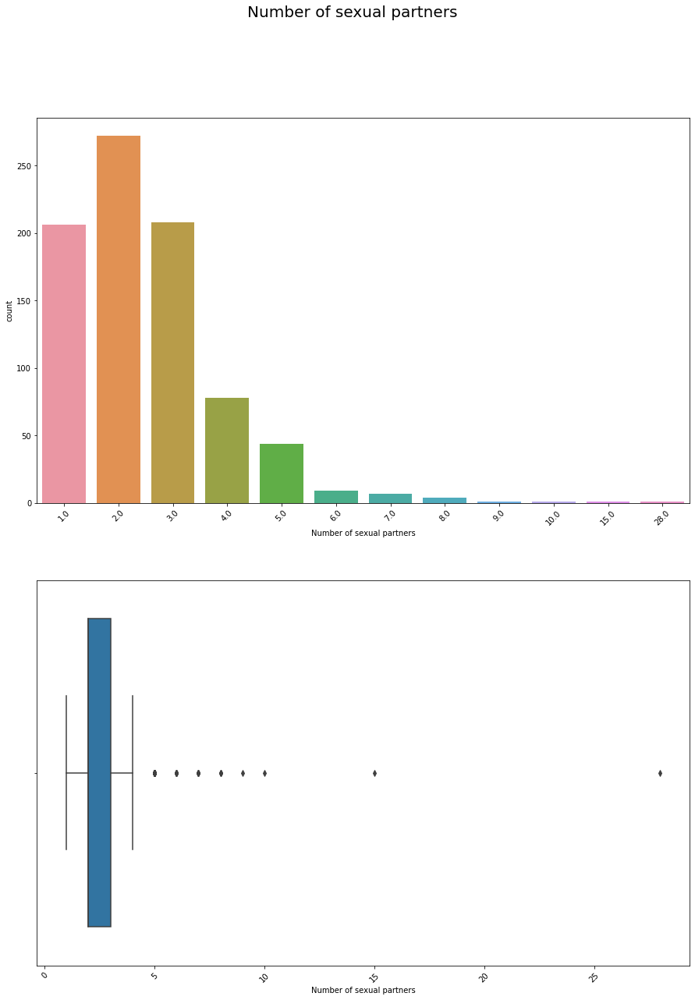

Min: 1.0
Mean: 2.527644230769231
Median: 2.0
Mode: 2.0
Max: 28.0
% of values missing: 3.0303030303030303


In [ ]:
# Now, integer features, having missing values in 1 to 12% records are
# analyzed
# Number of sexual partners:

countplot_boxplot('Number of sexual partners', df)


In [ ]:
# The mean of 'Number of sexual partners' is pulled higher by some 
# outliers present in the features.
# Then, I will replace the missing values with 2.0, the value of the mode
# and of the median
df['Number of sexual partners'].fillna(df['Number of sexual partners'].mode()[0], inplace = True)

df['Number of sexual partners'].value_counts(dropna = False)

2.0     298
3.0     208
1.0     206
4.0      78
5.0      44
6.0       9
7.0       7
8.0       4
9.0       1
28.0      1
10.0      1
15.0      1
Name: Number of sexual partners, dtype: int64

Feature: First sexual intercourse

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



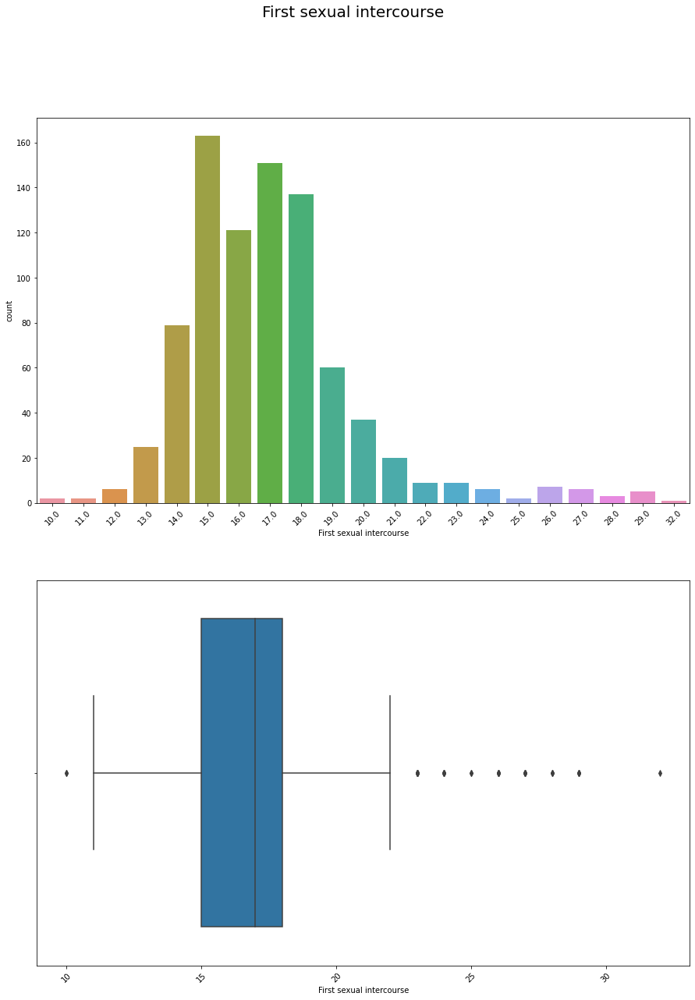

Min: 10.0
Mean: 16.995299647473562
Median: 17.0
Mode: 15.0
Max: 32.0
% of values missing: 0.8158508158508158


In [ ]:
# Now, integer features, having missing values in 1 to 12% records are
# analyzed
# Number of sexual intercourse:

countplot_boxplot('First sexual intercourse', df)

In [ ]:
# Here, less than 1% of values are missing for this feature. I will 
# replace those with the median value
df['First sexual intercourse'].fillna(df['First sexual intercourse'].median(), inplace = True)

df['First sexual intercourse'].value_counts(dropna = False)


15.0    163
17.0    158
18.0    137
16.0    121
14.0     79
19.0     60
20.0     37
13.0     25
21.0     20
22.0      9
23.0      9
26.0      7
27.0      6
24.0      6
12.0      6
29.0      5
28.0      3
25.0      2
11.0      2
10.0      2
32.0      1
Name: First sexual intercourse, dtype: int64

Feature: Num of pregnancies

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



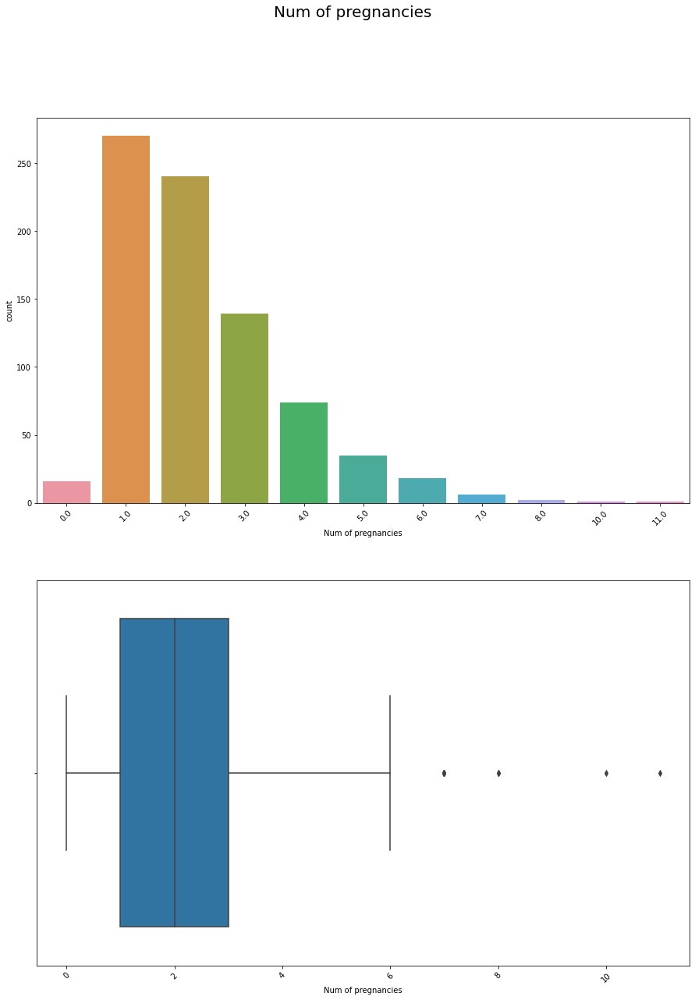

Min: 0.0
Mean: 2.275561097256858
Median: 2.0
Mode: 1.0
Max: 11.0
% of values missing: 6.526806526806526


In [ ]:
# Now, integer features, having missing values in 1 to 12% records are
# analyzed
# Number of pregnancies:

countplot_boxplot('Num of pregnancies', df)


In [ ]:
# About 6.5% of the values are missing and then I replce these values with the median value
df['Num of pregnancies'].fillna(df['Num of pregnancies'].median(), inplace = True)

df['Num of pregnancies'].value_counts(dropna = False)

2.0     296
1.0     270
3.0     139
4.0      74
5.0      35
6.0      18
0.0      16
7.0       6
8.0       2
10.0      1
11.0      1
Name: Num of pregnancies, dtype: int64

Feature: Hormonal Contraceptives (years)

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



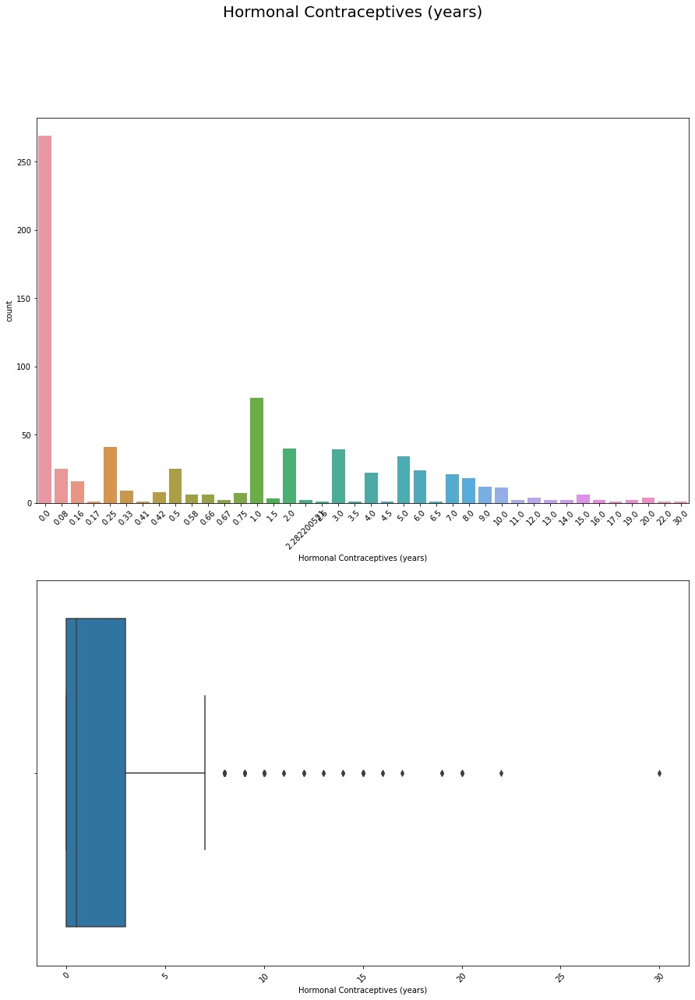

Min: 0.0
Mean: 2.2564192013893343
Median: 0.5
Mode: 0.0
Max: 30.0
% of values missing: 12.587412587412588


In [ ]:
# Hormonal Contraceptives (years)
countplot_boxplot('Hormonal Contraceptives (years)', df)

In [ ]:
# About 12.6% of the records are missing values for this factor and records
# with a zero value are by far the largest group, There are quite a few 
# outliers, all falling in the higher value range. These high outliers, 
# pull the mean substantially higher than the median. An argument could be 
# made to fill the missing values with either the mode (0) or the median 
# (0.5). I choose to fill the values with the median.

df['Hormonal Contraceptives (years)'].fillna(df['Hormonal Contraceptives (years)'].median(), inplace = True)

df['Hormonal Contraceptives (years)'].value_counts(dropna = False)


0.000000     269
0.500000     133
1.000000      77
0.250000      41
2.000000      40
3.000000      39
5.000000      34
0.080000      25
6.000000      24
4.000000      22
7.000000      21
8.000000      18
0.160000      16
9.000000      12
10.000000     11
0.330000       9
0.420000       8
0.750000       7
0.580000       6
15.000000      6
0.660000       6
20.000000      4
12.000000      4
1.500000       3
19.000000      2
0.670000       2
11.000000      2
14.000000      2
13.000000      2
16.000000      2
2.282201       2
0.170000       1
22.000000      1
2.500000       1
4.500000       1
6.500000       1
3.500000       1
30.000000      1
17.000000      1
0.410000       1
Name: Hormonal Contraceptives (years), dtype: int64

Feature: IUD (years)

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



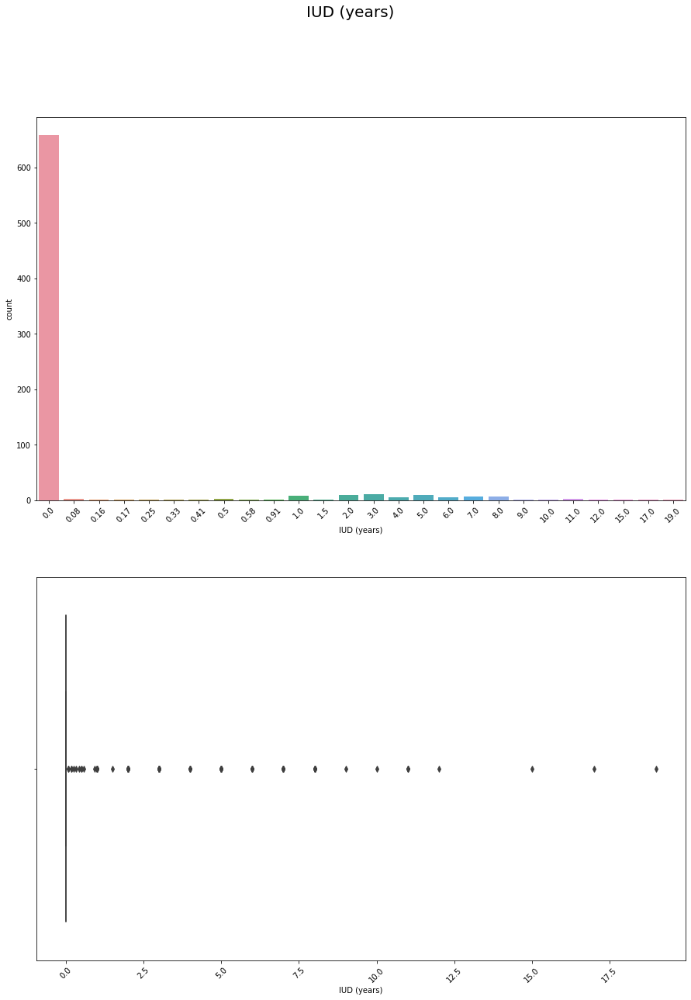

Min: 0.0
Mean: 0.514804318488529
Median: 0.0
Mode: 0.0
Max: 19.0
% of values missing: 13.636363636363635


In [ ]:
# IUD (years)
countplot_boxplot('IUD (years)', df)

In [ ]:
# The factor has among 13.6% missing values. 
# Zero occurs in the majority of the records, then I choose 0
df['IUD (years)'].fillna(df['IUD (years)'].mode()[0], inplace = True)

df['IUD (years)'].value_counts(dropna = False)

0.00     775
3.00      11
2.00      10
5.00       9
1.00       8
7.00       7
8.00       7
6.00       5
4.00       5
11.00      3
0.50       2
0.08       2
12.00      1
15.00      1
9.00       1
0.33       1
10.00      1
0.25       1
17.00      1
19.00      1
1.50       1
0.17       1
0.41       1
0.58       1
0.91       1
0.16       1
Name: IUD (years), dtype: int64

Feature: STDs (number)

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



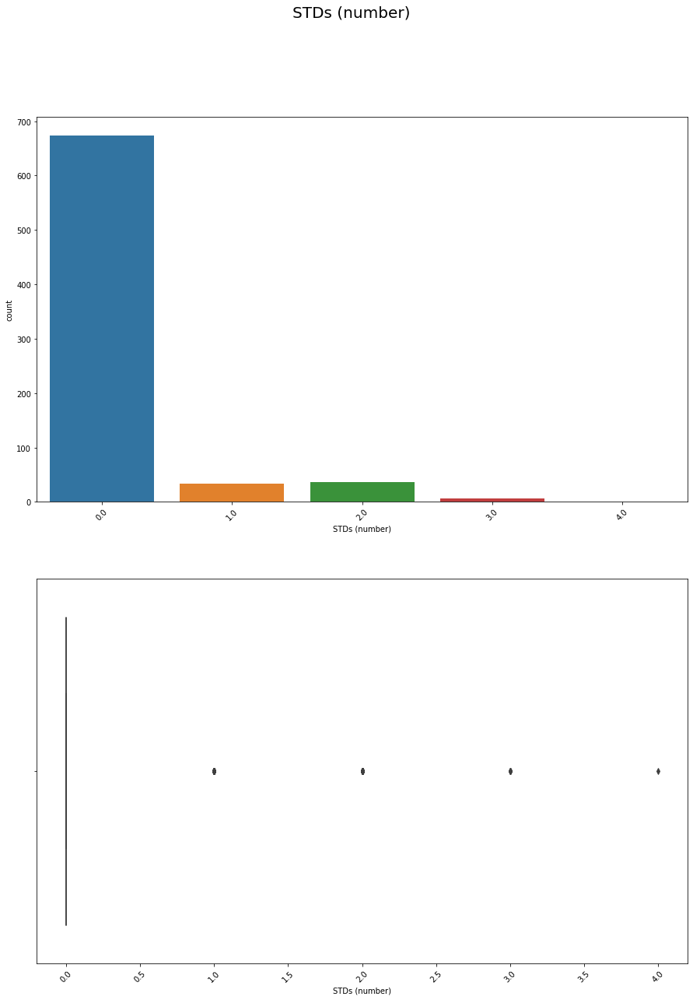

Min: 0.0
Mean: 0.17662682602921648
Median: 0.0
Mode: 0.0
Max: 4.0
% of values missing: 12.237762237762238


In [ ]:
countplot_boxplot('STDs (number)', df)

In [ ]:
# The missing values of this feature are about 12.23%
# Because also in this case the zero is the number more present,
# I choose to replace the NaN's with 0
df['STDs (number)'].fillna(df['STDs (number)'].median(), inplace = True)

df['STDs (number)'].value_counts(dropna = False)

0.0    779
2.0     37
1.0     34
3.0      7
4.0      1
Name: STDs (number), dtype: int64

Features related with STDs

In [ ]:
# Then there are 12 individual boolean factors,each for a different STD.
# Each has about 12% missing values.
# Now because these features are related to 'STDs(number)', 
# I will replace the missing values in each of these factors with 0

features = [
    'STDs:condylomatosis',
    'STDs:cervical condylomatosis',
    'STDs:vaginal condylomatosis',
    'STDs:vulvo-perineal condylomatosis',
    'STDs:syphilis',
    'STDs:pelvic inflammatory disease',
    'STDs:genital herpes',
    'STDs:molluscum contagiosum',
    'STDs:AIDS',
    'STDs:HIV',
    'STDs:Hepatitis B',
    'STDs:HPV']
for feature in features:
    df[feature].fillna(0, inplace = True)
    print(df[feature].value_counts(dropna = False))

0.0    814
1.0     44
Name: STDs:condylomatosis, dtype: int64
0.0    858
Name: STDs:cervical condylomatosis, dtype: int64
0.0    854
1.0      4
Name: STDs:vaginal condylomatosis, dtype: int64
0.0    815
1.0     43
Name: STDs:vulvo-perineal condylomatosis, dtype: int64
0.0    840
1.0     18
Name: STDs:syphilis, dtype: int64
0.0    857
1.0      1
Name: STDs:pelvic inflammatory disease, dtype: int64
0.0    857
1.0      1
Name: STDs:genital herpes, dtype: int64
0.0    857
1.0      1
Name: STDs:molluscum contagiosum, dtype: int64
0.0    858
Name: STDs:AIDS, dtype: int64
0.0    840
1.0     18
Name: STDs:HIV, dtype: int64
0.0    857
1.0      1
Name: STDs:Hepatitis B, dtype: int64
0.0    856
1.0      2
Name: STDs:HPV, dtype: int64


In [ ]:
# It is possible to see that features 'STDs:AIDS' and
# 'STDs:cervical condylomatosis' have no information, then these are 
# eliminated from the dataframe.
df.drop(['STDs:cervical condylomatosis','STDs:AIDS'], axis=1, inplace=True)

In [ ]:
# look for any remaining NaN's in the dataframe
df.isna().sum()

Age                                   0
Number of sexual partners             0
First sexual intercourse              0
Num of pregnancies                    0
Smokes                                0
Smokes (years)                        0
Smokes (packs/year)                   0
Hormonal Contraceptives               0
Hormonal Contraceptives (years)       0
IUD                                   0
IUD (years)                           0
STDs                                  0
STDs (number)                         0
STDs:condylomatosis                   0
STDs:vaginal condylomatosis           0
STDs:vulvo-perineal condylomatosis    0
STDs:syphilis                         0
STDs:pelvic inflammatory disease      0
STDs:genital herpes                   0
STDs:molluscum contagiosum            0
STDs:HIV                              0
STDs:Hepatitis B                      0
STDs:HPV                              0
STDs: Number of diagnosis             0
STDs: Time since first diagnosis      0


In [ ]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 858 entries, 0 to 857
Data columns (total 34 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Age                                 858 non-null    int64  
 1   Number of sexual partners           858 non-null    float64
 2   First sexual intercourse            858 non-null    float64
 3   Num of pregnancies                  858 non-null    float64
 4   Smokes                              858 non-null    float64
 5   Smokes (years)                      858 non-null    float64
 6   Smokes (packs/year)                 858 non-null    float64
 7   Hormonal Contraceptives             858 non-null    float64
 8   Hormonal Contraceptives (years)     858 non-null    float64
 9   IUD                                 858 non-null    float64
 10  IUD (years)                         858 non-null    float64
 11  STDs                                858 non-n

# EXPLORATORY DATA ANALYSIS

# **Heatmap with Pearson's correlation**

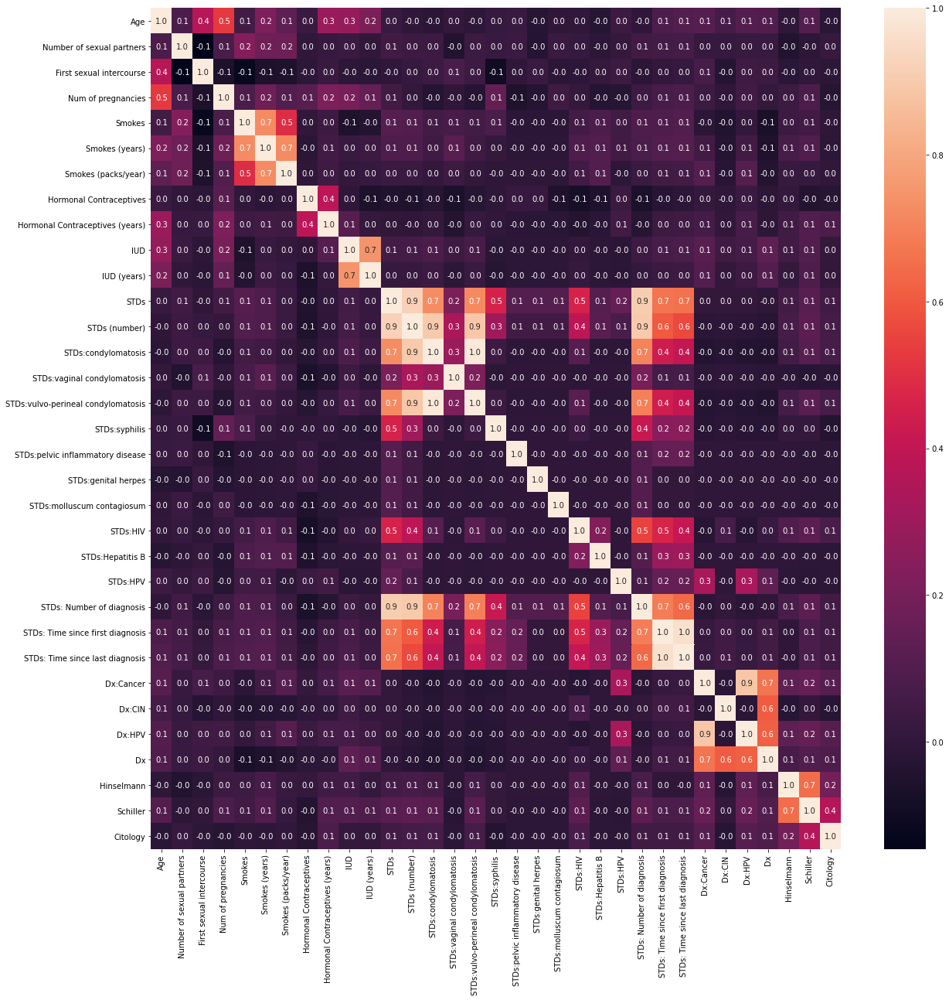

In [ ]:
# I pull the target variable from the dataframe and use the heatmap to 
# look at possible correlations between factors
temp_df =  df.drop('Biopsy', axis= 1)
f,ax = plt.subplots(figsize = (20,20))
sb.heatmap(temp_df.loc[:,:].corr(), annot = True, fmt='.1f')
plt.show()

From the heatmap it is possible to see that there is strong correlation between some factors, but this is not surprising.
For example 'STDs', 'STDs (number)', and 'STDs: Number of diagnosis',all show significant correlations to the individual STD factors and this would be expected.
Other correlations not surprising were between age and 'number of sexual partners','First sexual intercourse', 'Number of pregnancies','Smokes(years)', 'Hormonal Contraceptives(years)','IUD', 'IUD (years)'

# **Feature Selection**

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 858 entries, 0 to 857
Data columns (total 28 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Age                               858 non-null    int64  
 1   Number of sexual partners         858 non-null    float64
 2   First sexual intercourse          858 non-null    float64
 3   Num of pregnancies                858 non-null    float64
 4   Smokes                            858 non-null    float64
 5   Smokes (years)                    858 non-null    float64
 6   Smokes (packs/year)               858 non-null    float64
 7   Hormonal Contraceptives           858 non-null    float64
 8   Hormonal Contraceptives (years)   858 non-null    float64
 9   IUD                               858 non-null    float64
 10  IUD (years)                       858 non-null    float64
 11  STDs                              858 non-null    float64
 12  STDs:vag

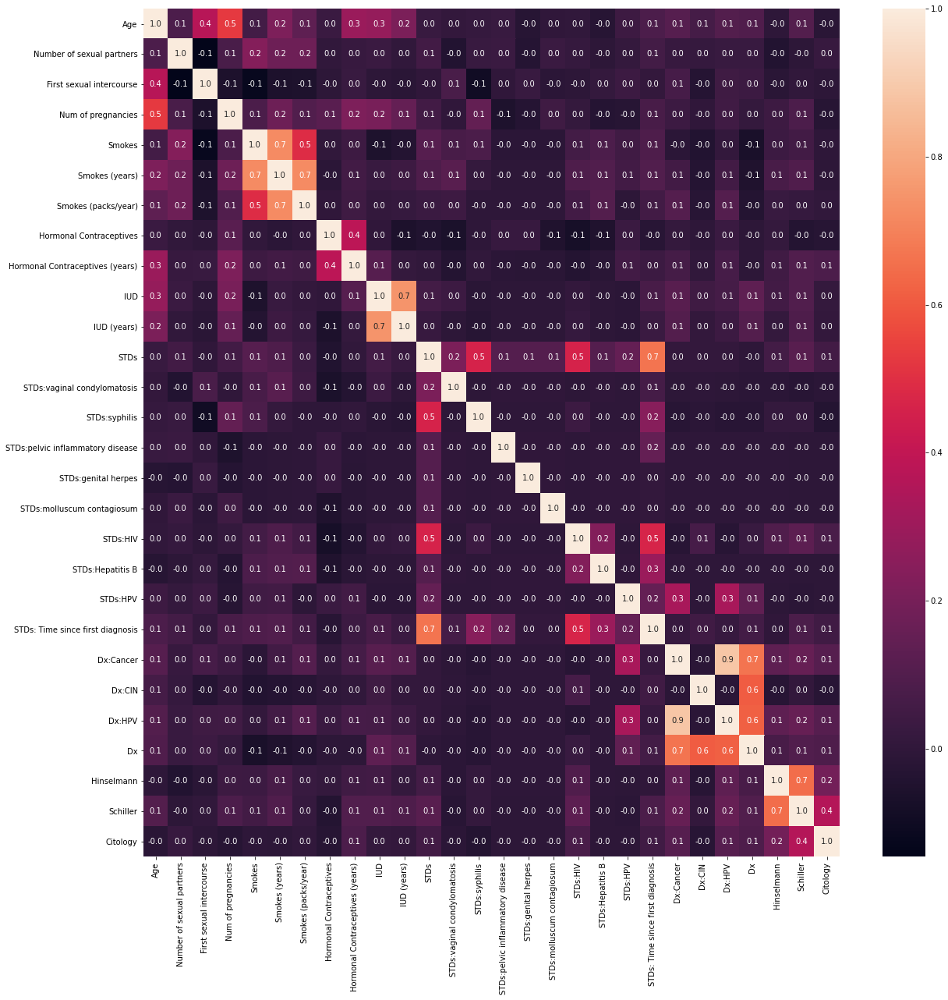

In [ ]:
corr = temp_df.loc[:,:].corr()

columns = np.full((corr.shape[0],), True, dtype=bool)
for i in range(corr.shape[0]):
    for j in range(i+1, corr.shape[0]):
        if corr.iloc[i,j] >= 0.9:
            if columns[j]:
                columns[j] = False

selected_columns = temp_df.columns[columns]
temp_df = temp_df[selected_columns]
temp_df.info()
f,ax = plt.subplots(figsize = (20,20))
sb.heatmap(temp_df.loc[:,:].corr(), annot = True, fmt='.1f')
plt.show()

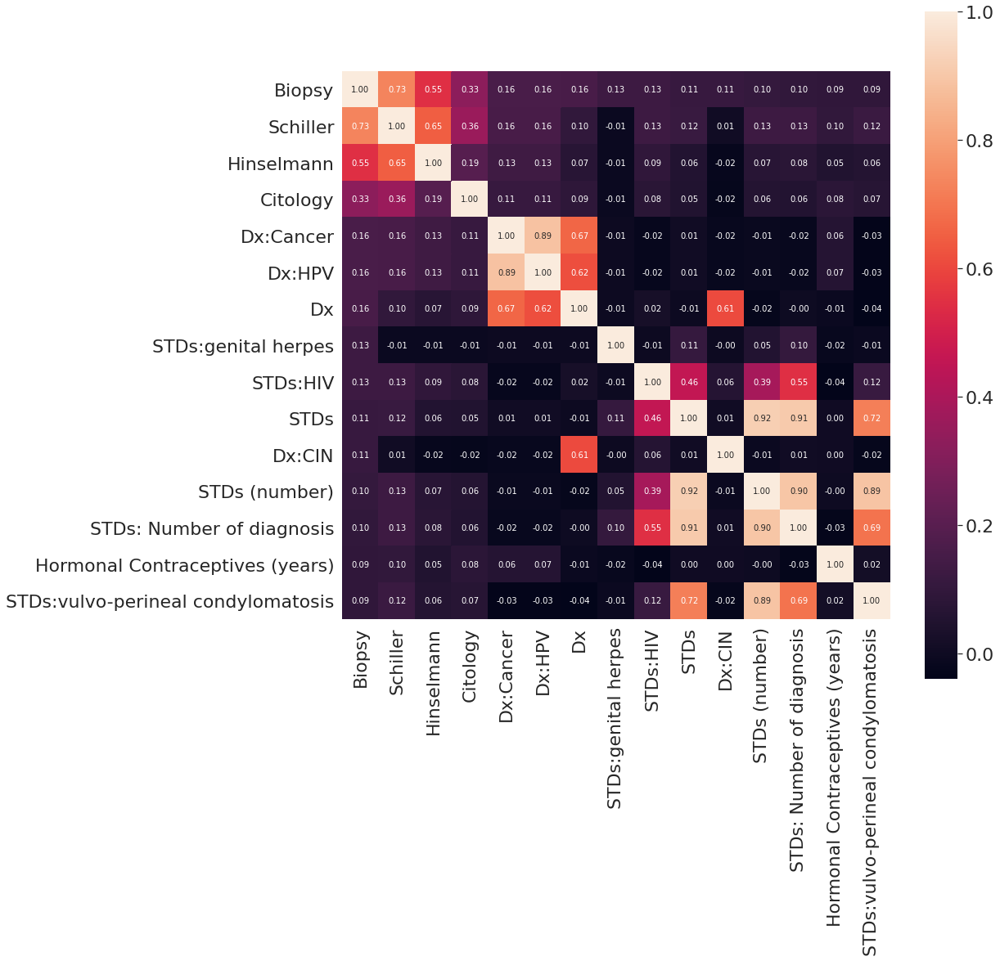

In [ ]:
# Next I looked how factors correlated to the target variable (BIOPSY).
# To simplify, I choose to look at the top 15 factors.
# (ranked by correlation to Biopsy (target variable))
corrmat = df.corr()
cols = corrmat.nlargest(15,'Biopsy')['Biopsy'].index
cm = np.corrcoef(df[cols].values.T)

plt.figure(figsize = (15,15))

sb.set(font_scale = 2)
hm = sb.heatmap(cm, cbar = True, annot = True, square = True, fmt='.2f', 
                annot_kws = {'size':10}, yticklabels= cols.values, 
                xticklabels = cols.values)
plt.show()

Schiller, Hinselmann, and Citology are features representing medical diagnostic
tools used to identify cervical cancer. It is not surprising tehy have the 
strongest correlations to Biopsy


# BOXPLOT, DISTPLOT FOR NUMERICAL FEATURES




#**Boxplot**

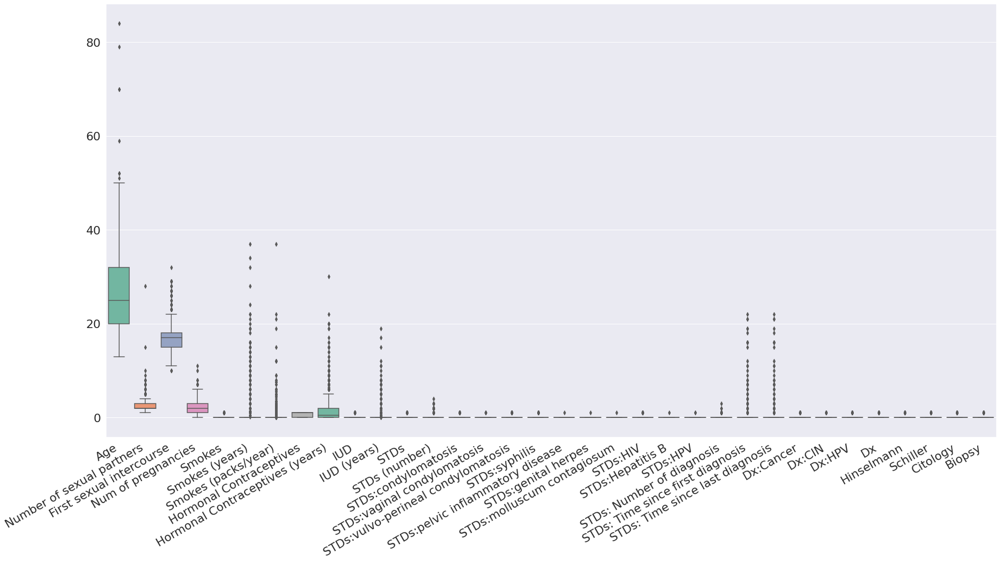

In [ ]:
numerical_features = ['Age','Number of sexual partners','First sexual intercourse','Num of pregnancies','Smokes (years)','Smokes (packs/year)','Hormonal Contraceptives (years)','IUD (years)','STDs (number)','STDs: Number of diagnosis','STDs: Time since first diagnosis','STDs: Time since last diagnosis']
new_df = df.copy()
plt.figure(figsize=(30,15))
ax = sb.boxplot(data=new_df, palette="Set2")
plt.setp(ax.get_xticklabels(), rotation=30, horizontalalignment='right')
plt.show()

# **Box plot after Min-Max scaling**

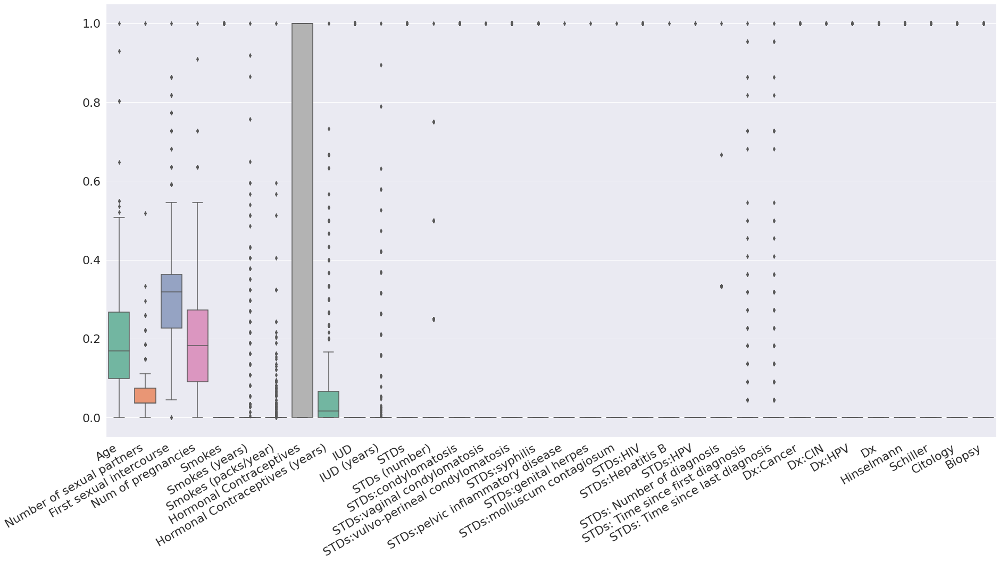

In [ ]:
minmax_scale = MinMaxScaler(feature_range = (0,1))
minmax_df = pd.DataFrame(minmax_scale.fit_transform(new_df), columns = new_df.columns)
plt.figure(figsize=(30,15))
ax = sb.boxplot(data=minmax_df, palette="Set2")
plt.setp(ax.get_xticklabels(), rotation=30, horizontalalignment='right')
plt.show()

# **Box plot after standardization**

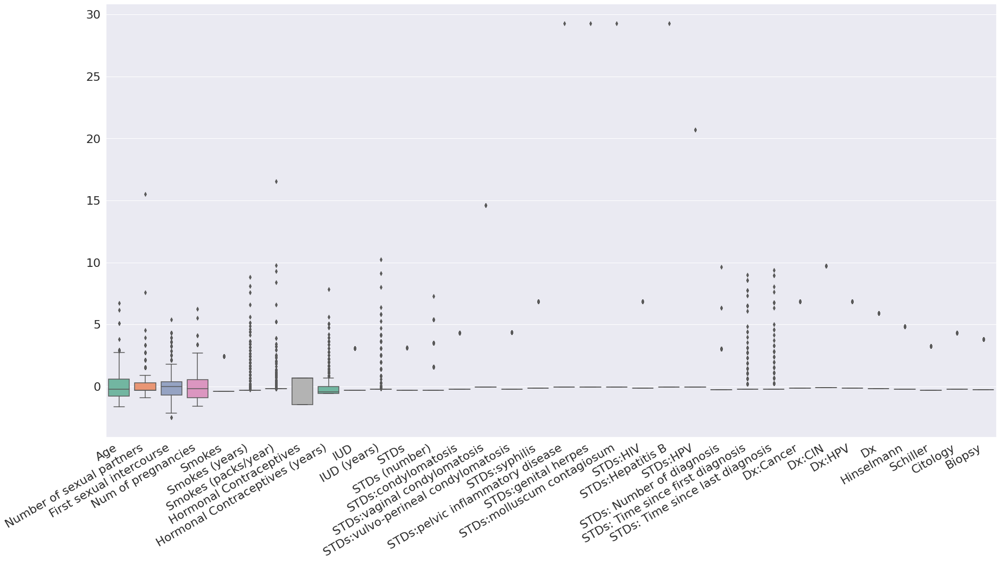

In [ ]:
std_scale = StandardScaler()
std_df = pd.DataFrame(std_scale.fit_transform(new_df), columns = new_df.columns)
plt.figure(figsize=(30,15))
ax = sb.boxplot(data=std_df, palette="Set2")
plt.setp(ax.get_xticklabels(), rotation=30, horizontalalignment='right')
plt.show()

# **Box Plot per class**

Min: 13
Mean: 26.82051282051282
Median: 25.0
Mode: 23
Max: 84


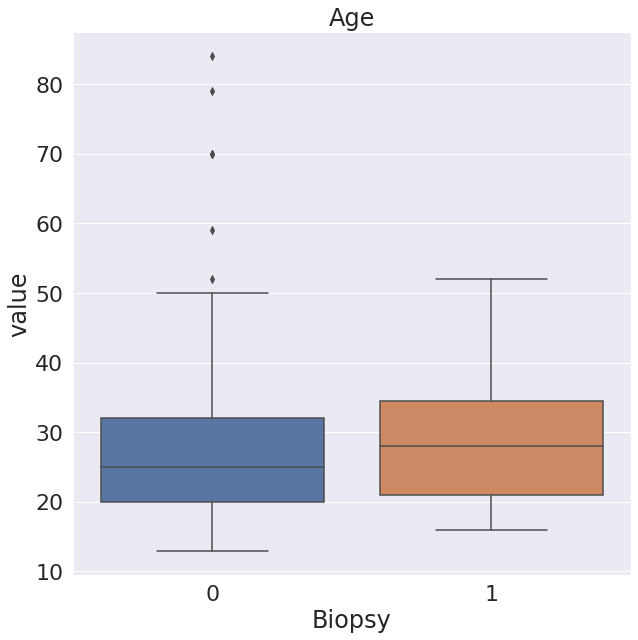

Min: 1.0
Mean: 2.511655011655012
Median: 2.0
Mode: 2.0
Max: 28.0


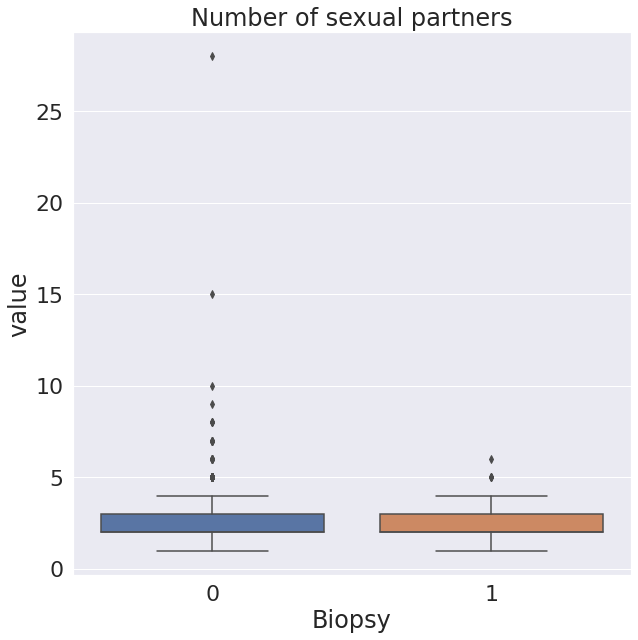

Min: 10.0
Mean: 16.995337995337994
Median: 17.0
Mode: 15.0
Max: 32.0


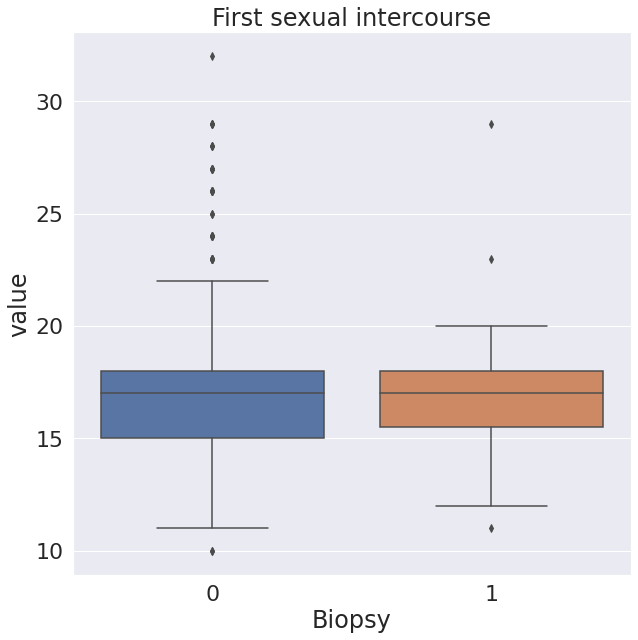

Min: 0.0
Mean: 2.257575757575758
Median: 2.0
Mode: 2.0
Max: 11.0


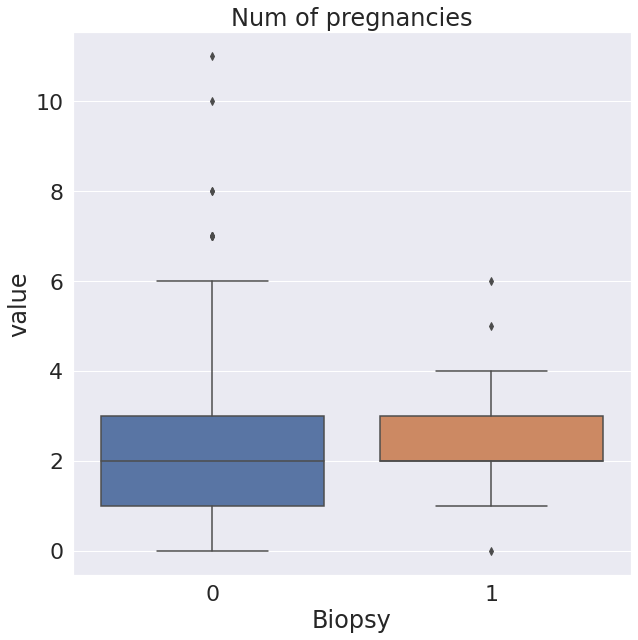

Min: 0.0
Mean: 1.2012407851223772
Median: 0.0
Mode: 0.0
Max: 37.0


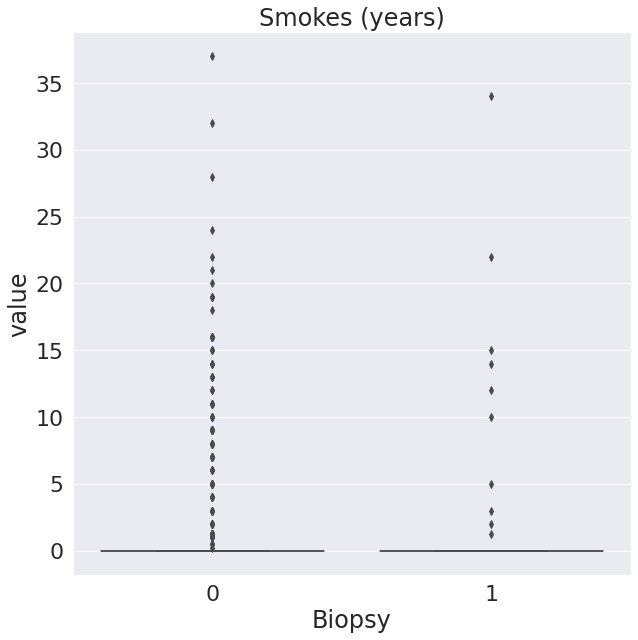

Min: 0.0
Mean: 0.4462781332151517
Median: 0.0
Mode: 0.0
Max: 37.0


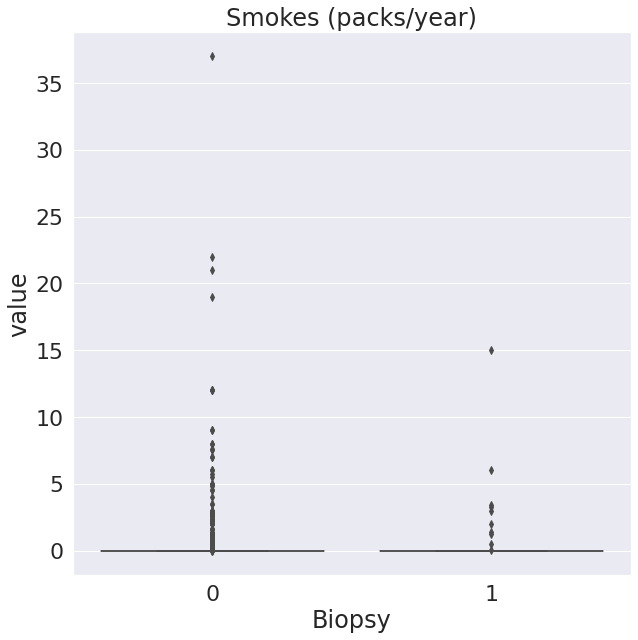

Min: 0.0
Mean: 2.035331469745921
Median: 0.5
Mode: 0.0
Max: 30.0


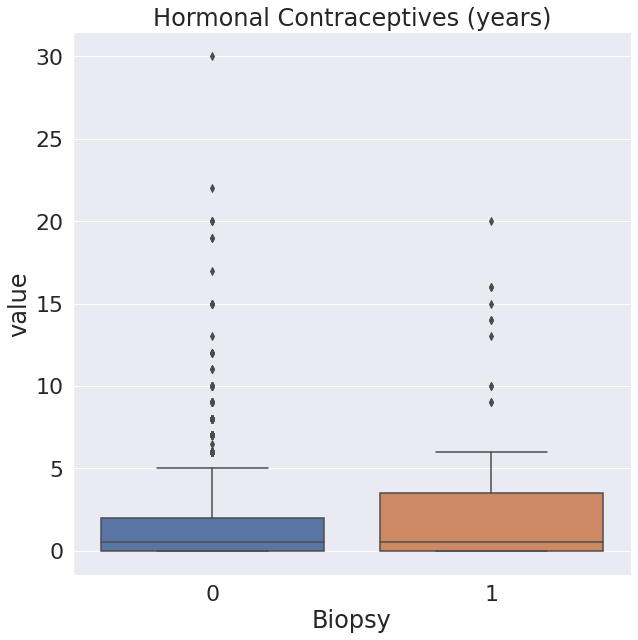

Min: 0.0
Mean: 0.4446037296037296
Median: 0.0
Mode: 0.0
Max: 19.0


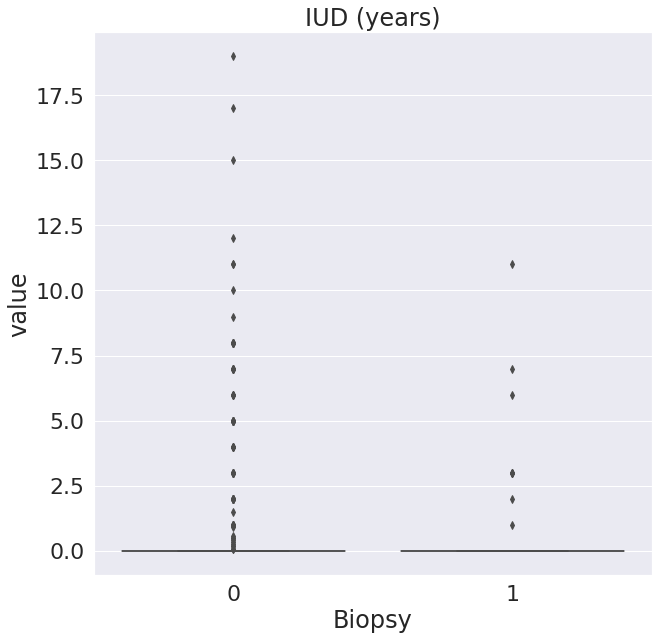

Min: 0.0
Mean: 0.155011655011655
Median: 0.0
Mode: 0.0
Max: 4.0


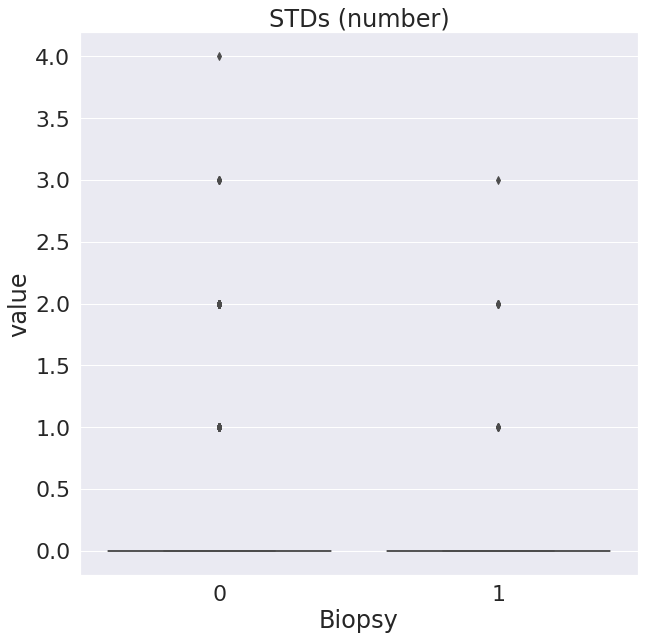

Min: 0
Mean: 0.08741258741258741
Median: 0.0
Mode: 0
Max: 3


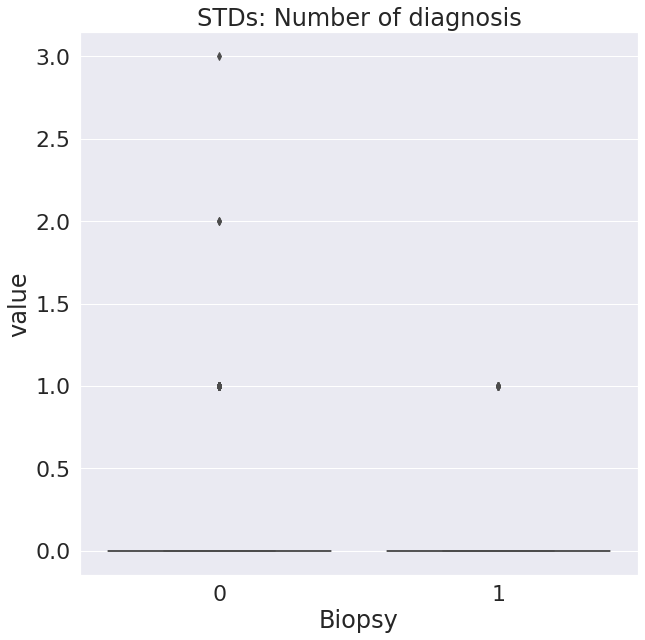

Min: 0.0
Mean: 0.5081585081585082
Median: 0.0
Mode: 0.0
Max: 22.0


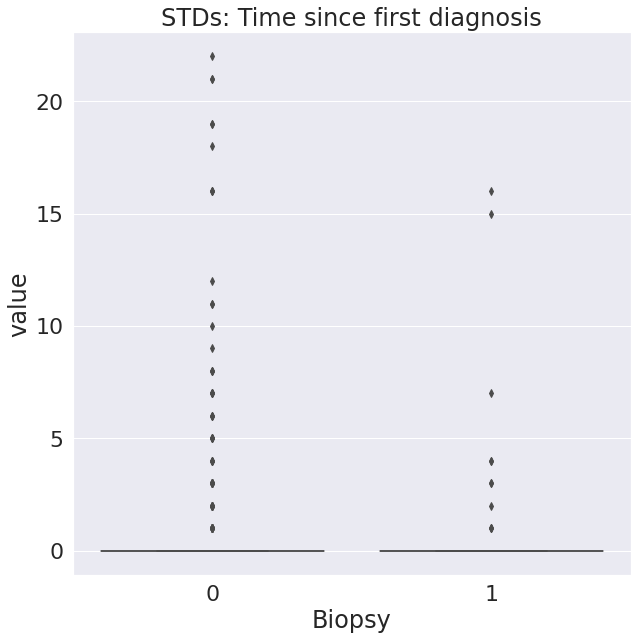

Min: 0.0
Mean: 0.4813519813519814
Median: 0.0
Mode: 0.0
Max: 22.0


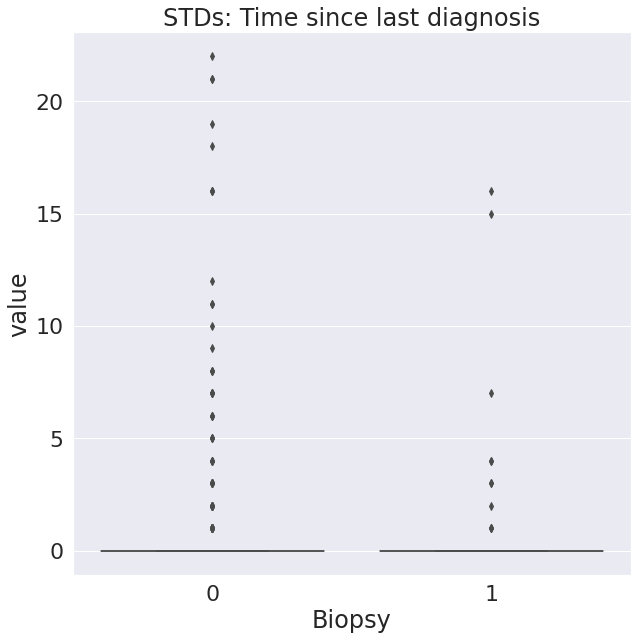

In [ ]:
for column in numerical_features:
    plt.figure(figsize = (10,10))
    dd=pd.melt(df,id_vars=['Biopsy'],value_vars=[column])
    sb.boxplot(x='Biopsy', y='value', data=dd)
    print('Min:', df[column].min())
    print('Mean:', df[column].mean())
    print('Median:', df[column].median())
    print('Mode:', df[column].mode()[0])
    print('Max:', df[column].max())
    plt.title(column)
    plt.show()


# **Dist Plot**

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Skewness: 1.394279
Kurtosis: 4.778575


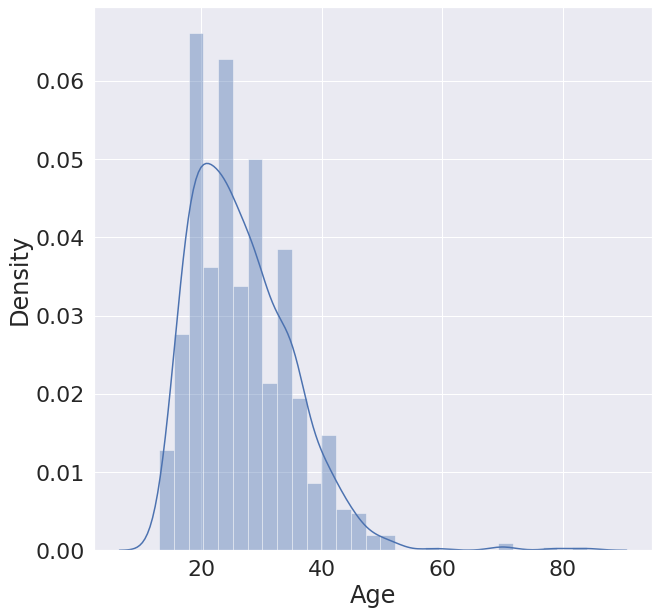

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Skewness: 5.542012
Kurtosis: 71.214301


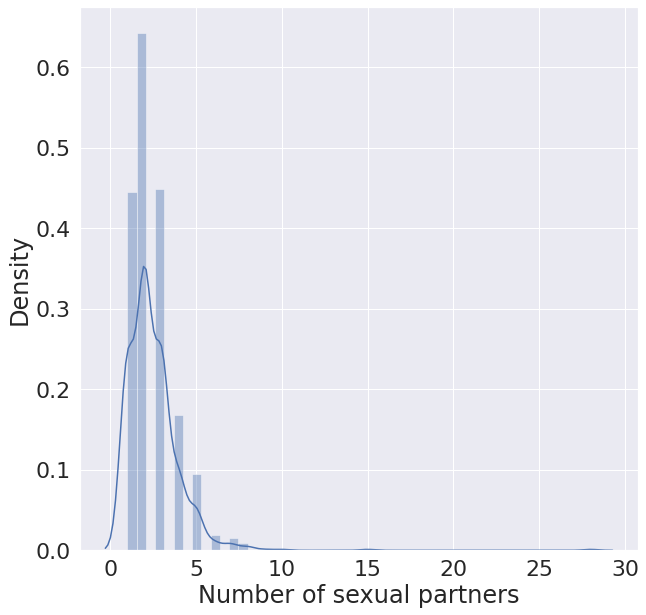

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Skewness: 1.570731
Kurtosis: 4.348045


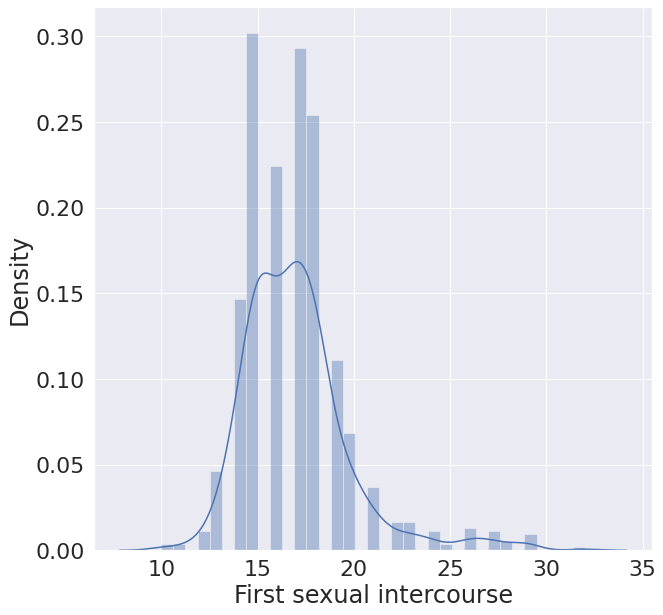

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Skewness: 1.505086
Kurtosis: 3.691356


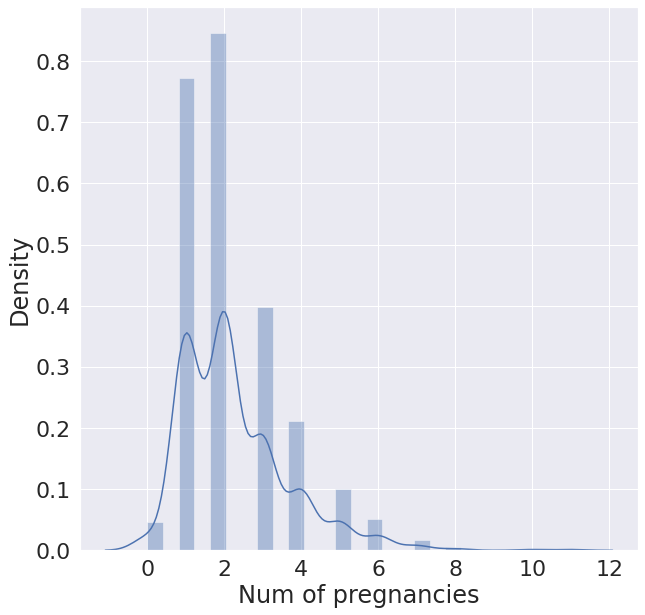

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Skewness: 4.503760
Kurtosis: 24.187248


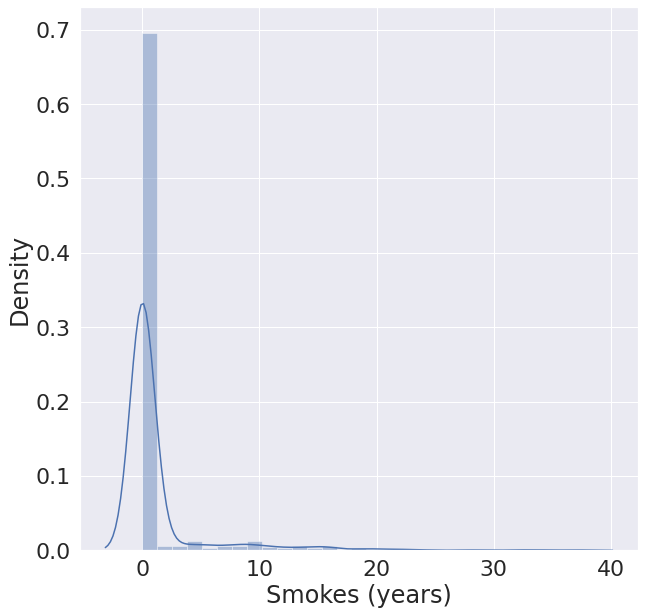

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Skewness: 9.380263
Kurtosis: 116.609051


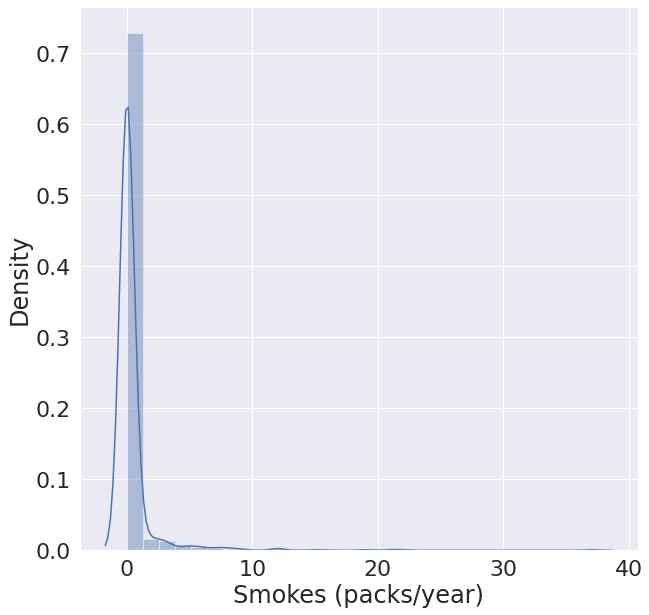

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Skewness: 2.868247
Kurtosis: 10.741690


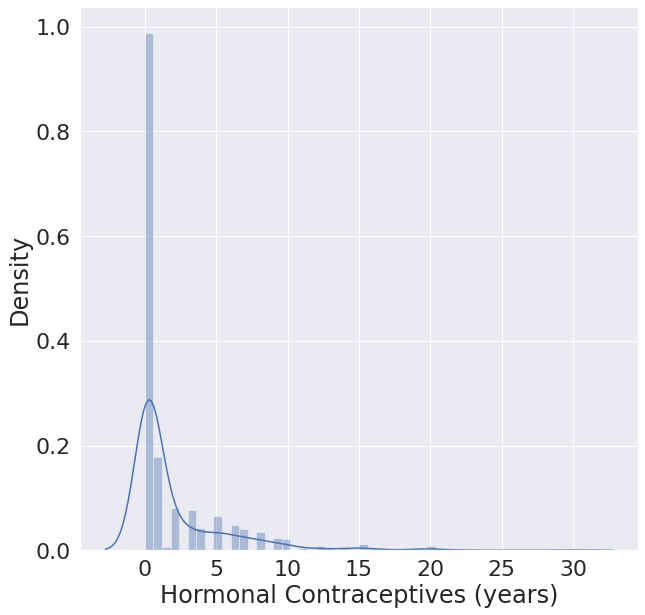

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Skewness: 5.417522
Kurtosis: 35.283895


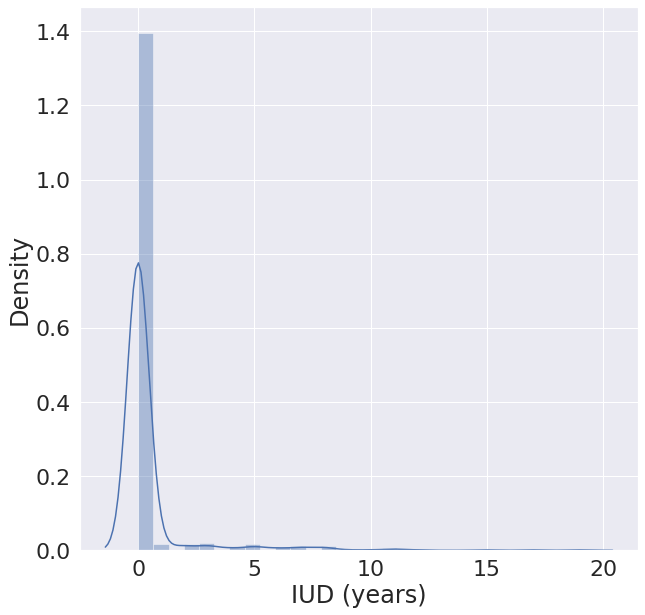

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Skewness: 3.684760
Kurtosis: 13.771536


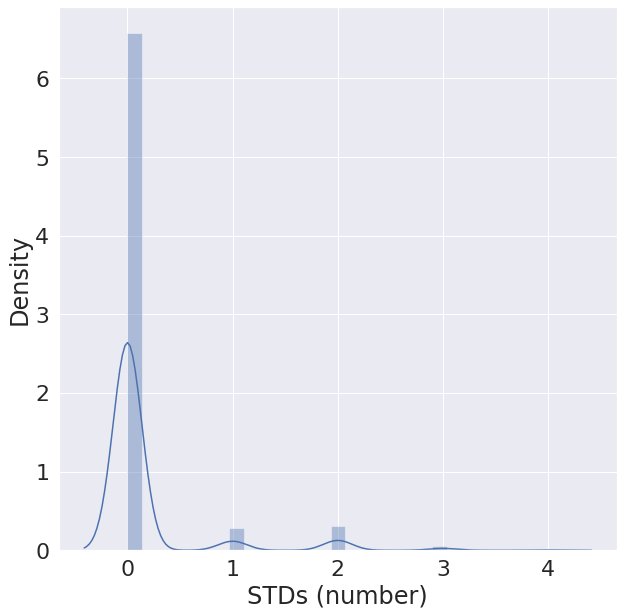

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Skewness: 3.794990
Kurtosis: 17.456839


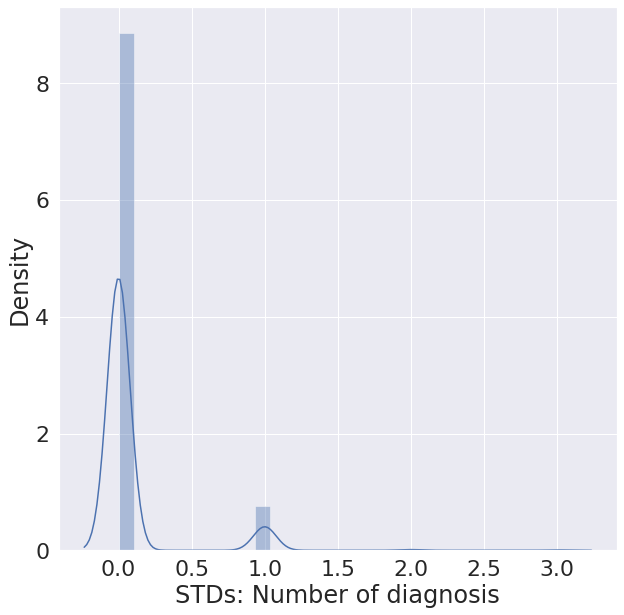

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Skewness: 6.196172
Kurtosis: 42.025466


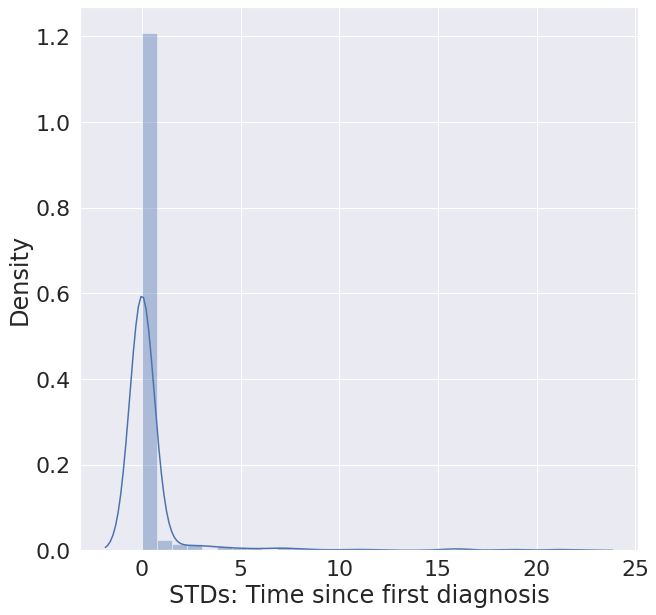

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Skewness: 6.379002
Kurtosis: 44.960799


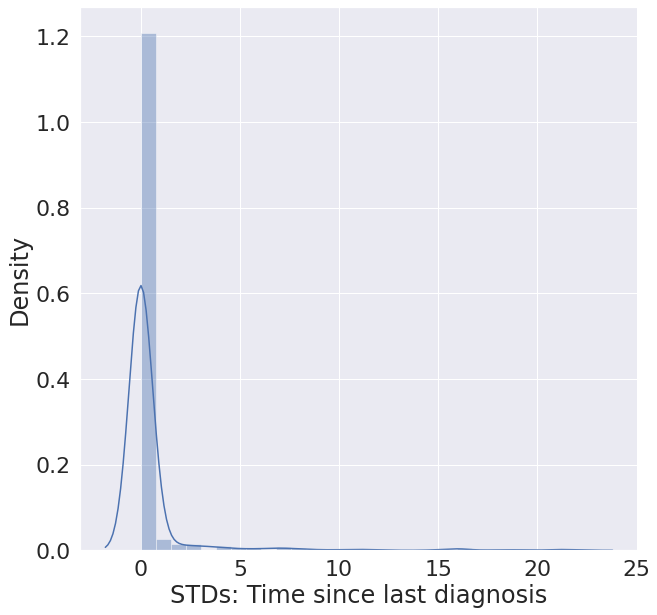

In [ ]:
#skewness and kurtosis indicates the shape of the distribution
for column in numerical_features:
    plt.figure(figsize = (10,10))
    sb.distplot(df[column])
    #skewness and kurtosis
    print("Skewness: %f" % df[column].skew())
    print("Kurtosis: %f" % df[column].kurt())
    plt.show()

In [ ]:
#plot = sb.pairplot(df, vars = numerical_features, hue = "Biopsy")
#for ax in plot.axes.flat:
#    ax.tick_params("x", labelrotation=45)

#plt.show()

# **Visualization of binary features**

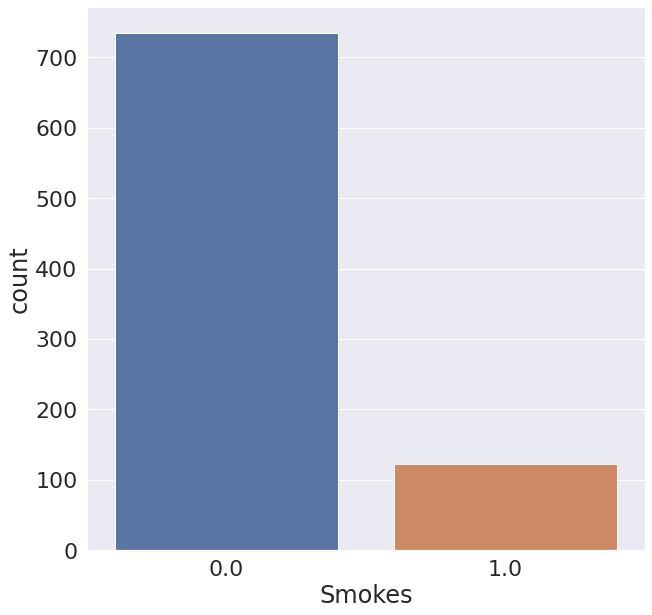

0.0    735
1.0    123
Name: Smokes, dtype: int64


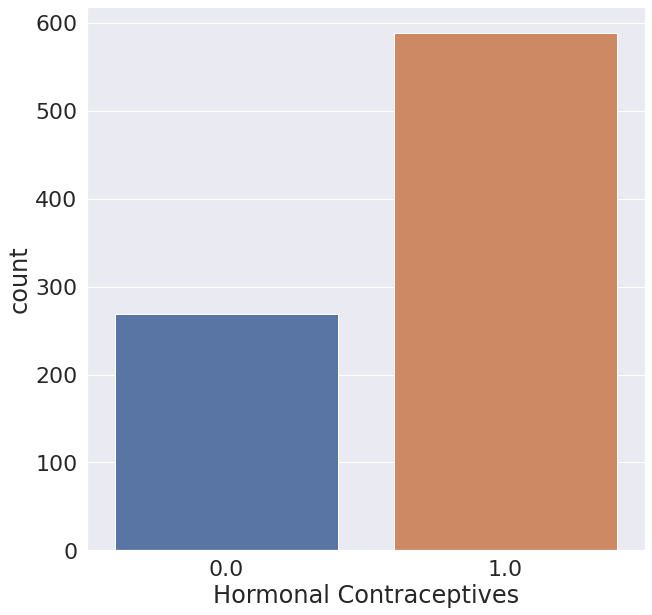

1.0    589
0.0    269
Name: Hormonal Contraceptives, dtype: int64


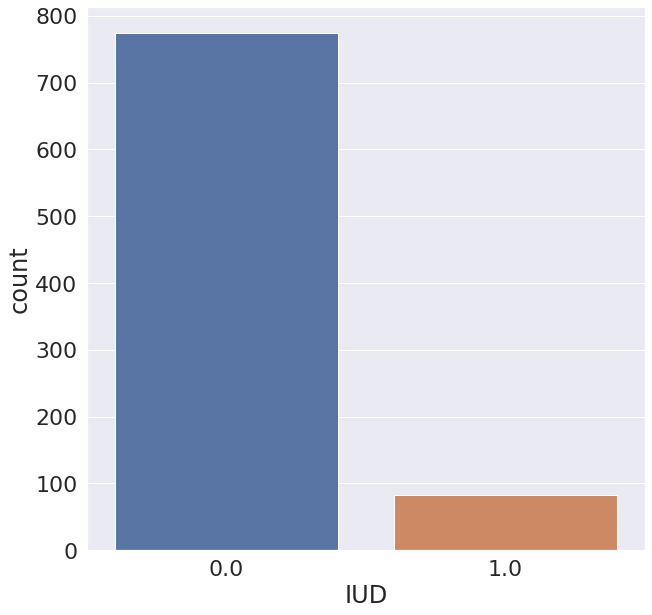

0.0    775
1.0     83
Name: IUD, dtype: int64


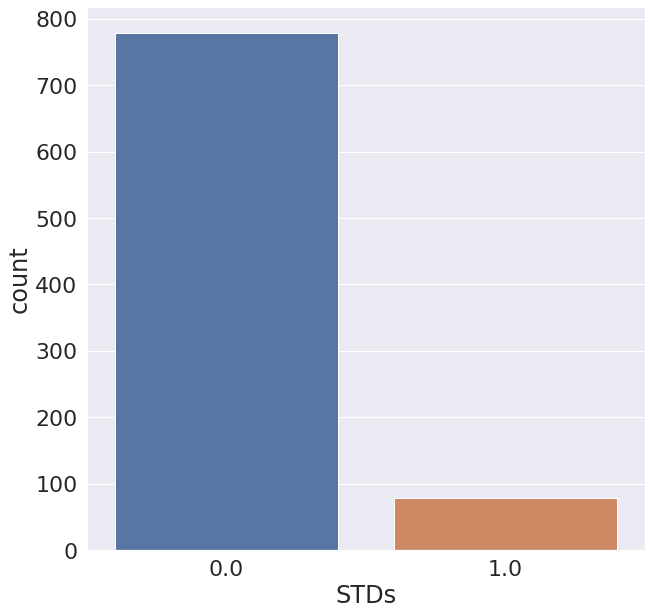

0.0    779
1.0     79
Name: STDs, dtype: int64


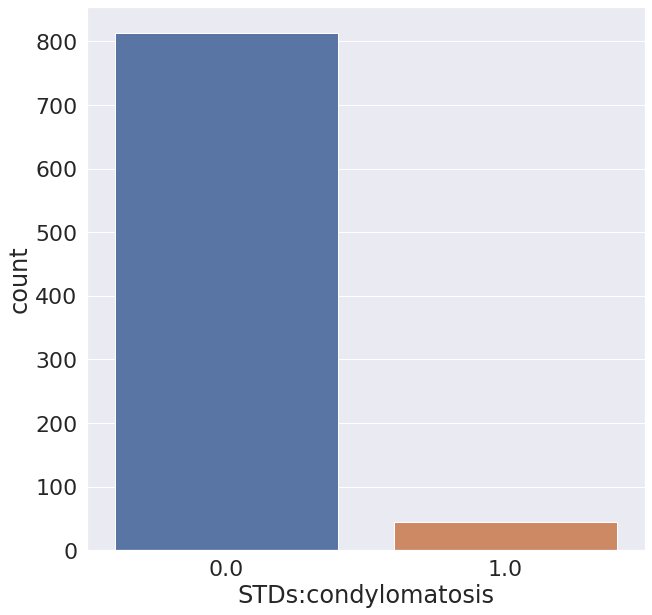

0.0    814
1.0     44
Name: STDs:condylomatosis, dtype: int64


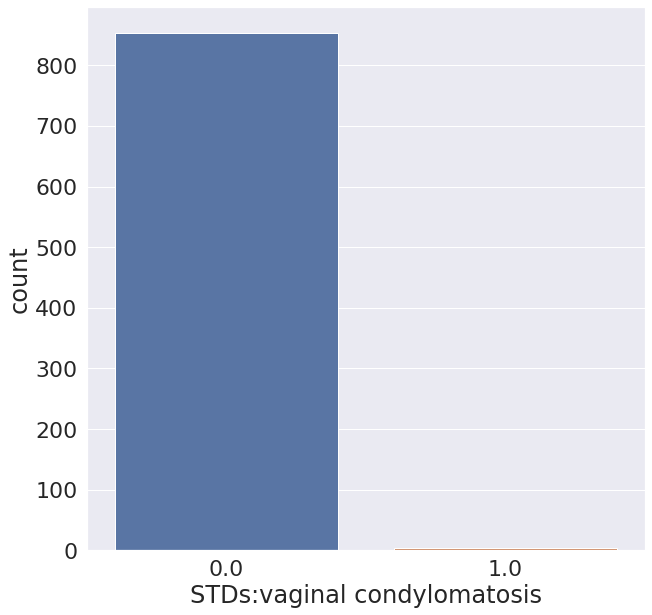

0.0    854
1.0      4
Name: STDs:vaginal condylomatosis, dtype: int64


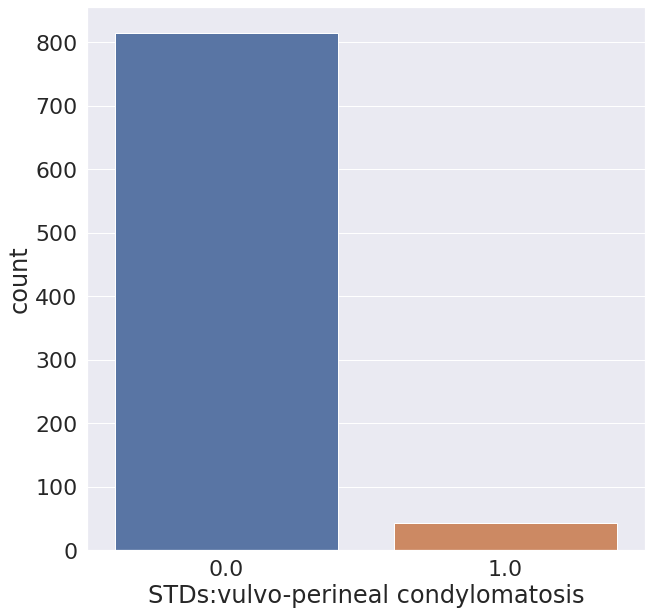

0.0    815
1.0     43
Name: STDs:vulvo-perineal condylomatosis, dtype: int64


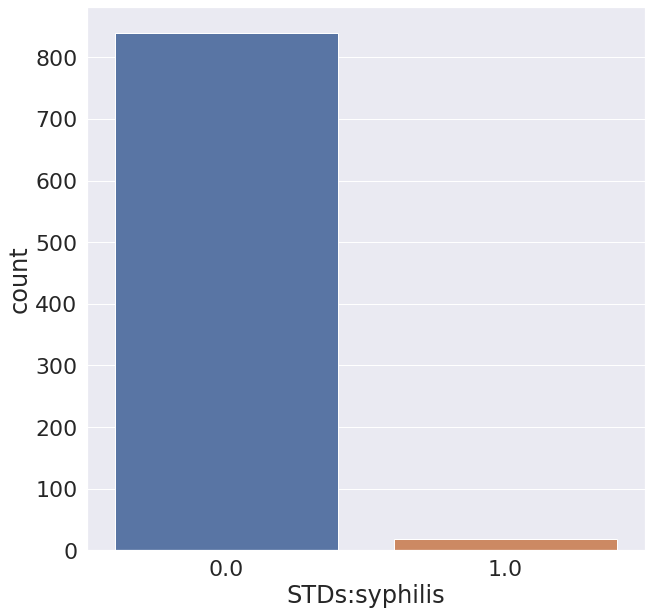

0.0    840
1.0     18
Name: STDs:syphilis, dtype: int64


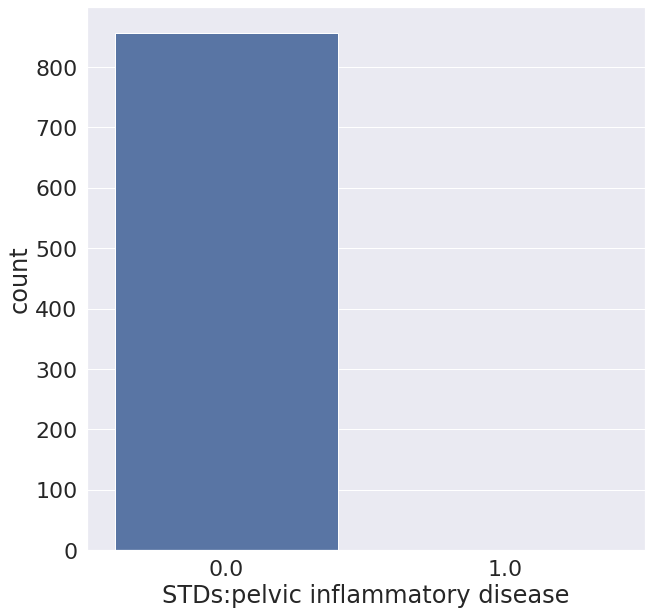

0.0    857
1.0      1
Name: STDs:pelvic inflammatory disease, dtype: int64


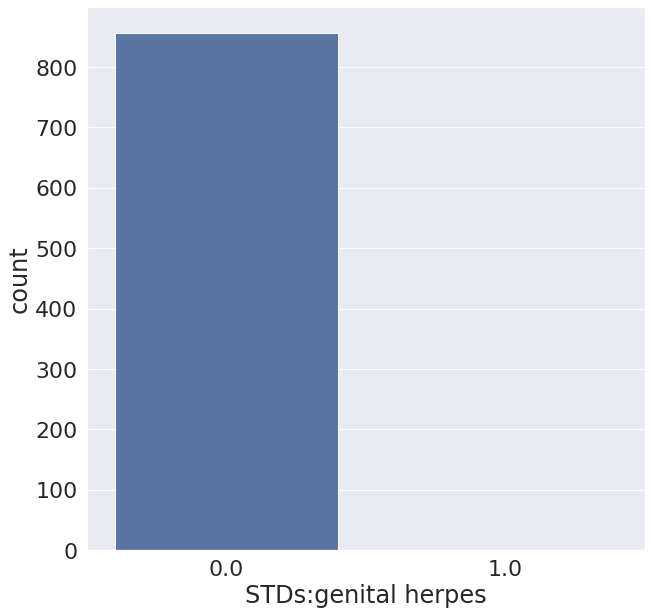

0.0    857
1.0      1
Name: STDs:genital herpes, dtype: int64


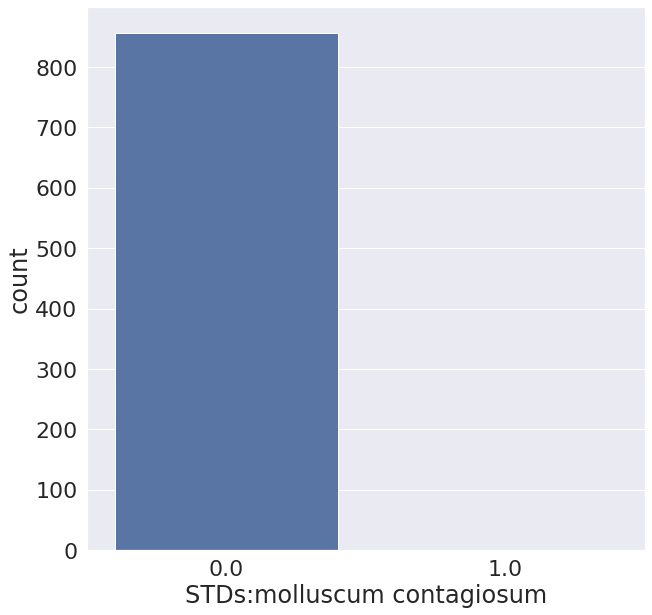

0.0    857
1.0      1
Name: STDs:molluscum contagiosum, dtype: int64


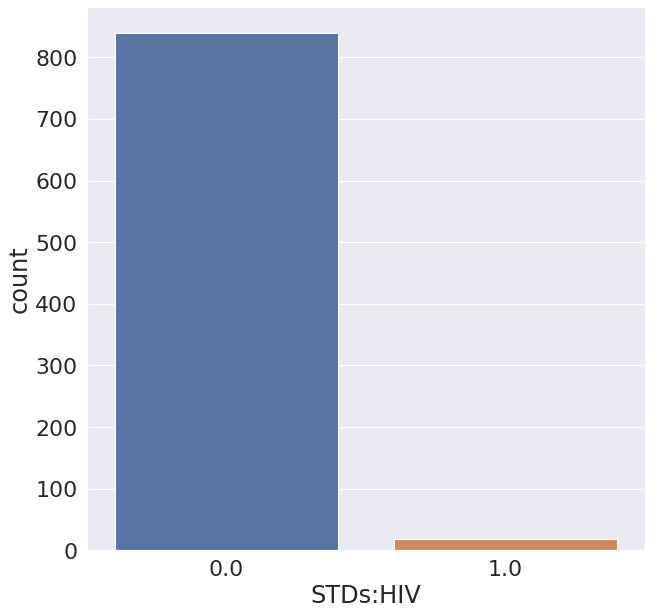

0.0    840
1.0     18
Name: STDs:HIV, dtype: int64


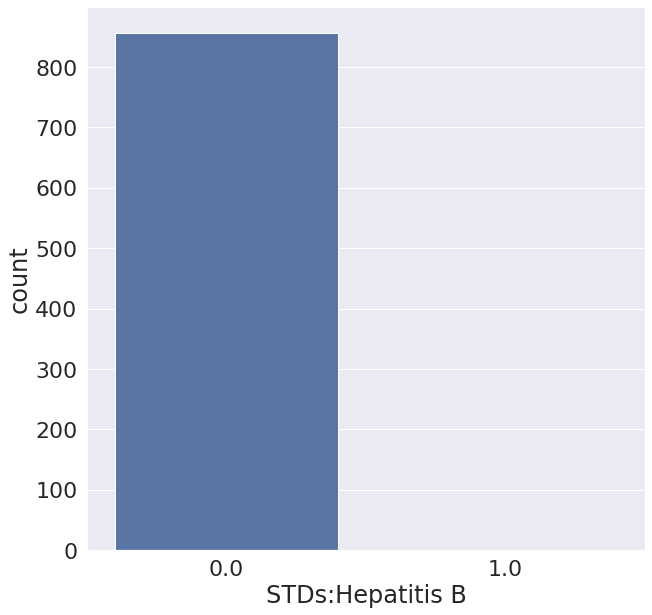

0.0    857
1.0      1
Name: STDs:Hepatitis B, dtype: int64


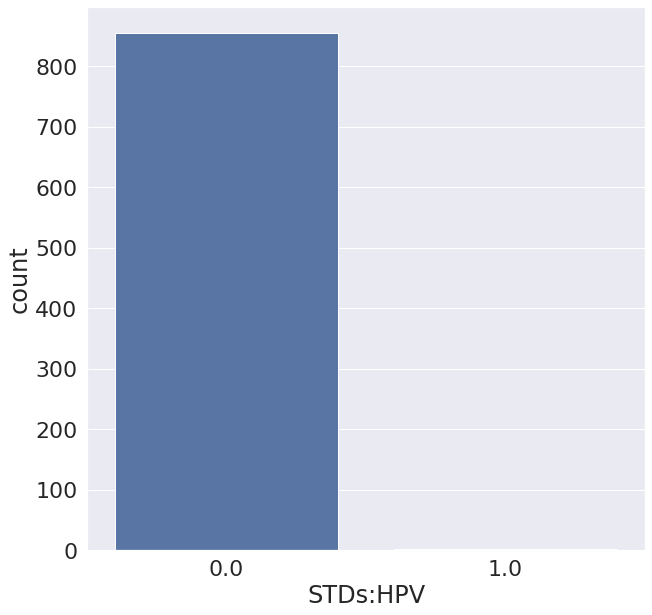

0.0    856
1.0      2
Name: STDs:HPV, dtype: int64


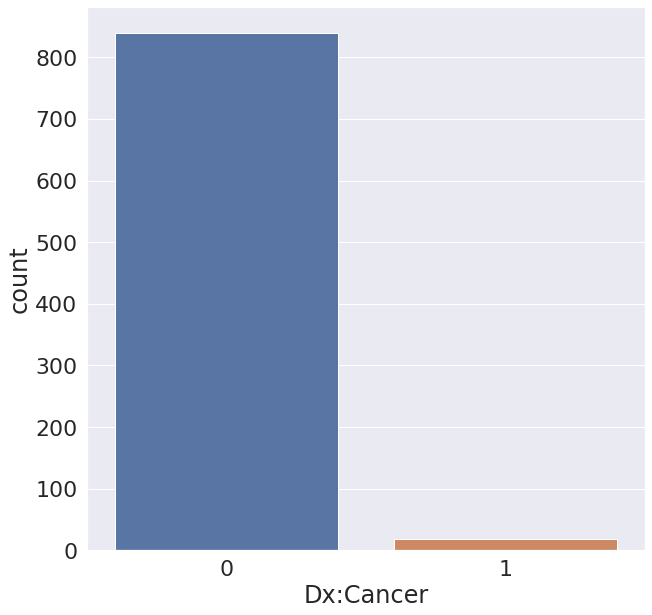

0    840
1     18
Name: Dx:Cancer, dtype: int64


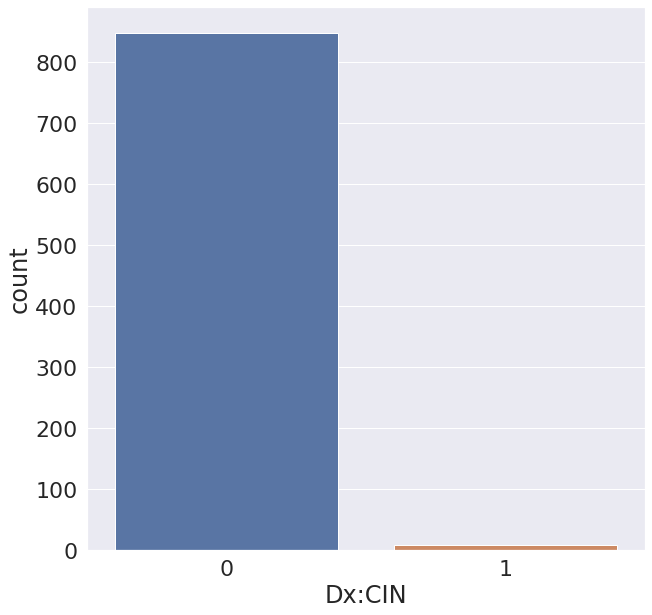

0    849
1      9
Name: Dx:CIN, dtype: int64


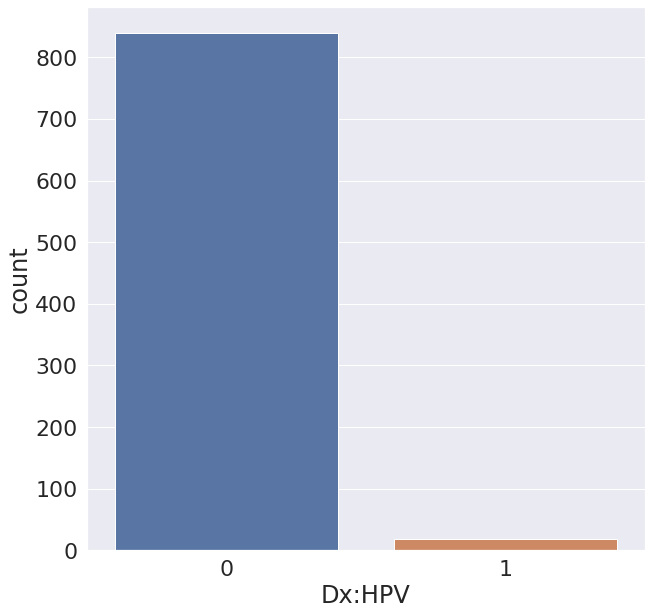

0    840
1     18
Name: Dx:HPV, dtype: int64


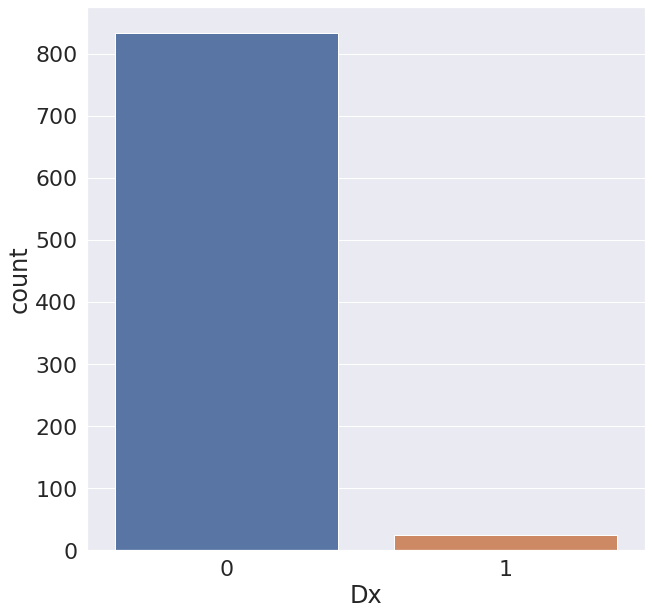

0    834
1     24
Name: Dx, dtype: int64


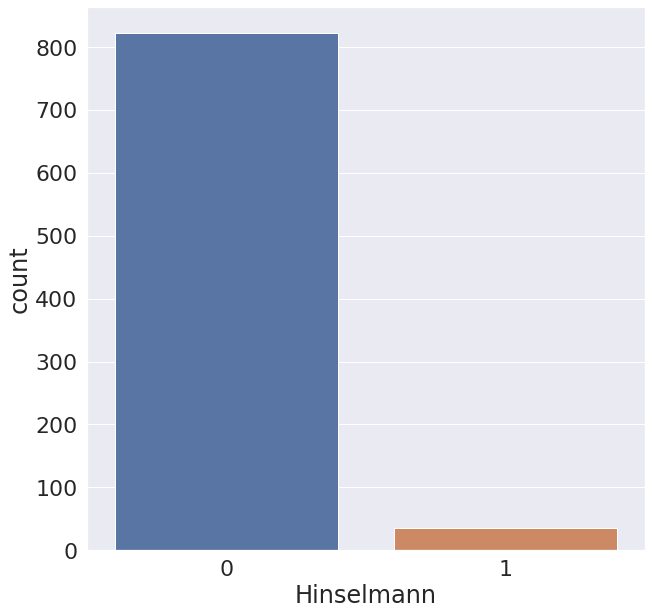

0    823
1     35
Name: Hinselmann, dtype: int64


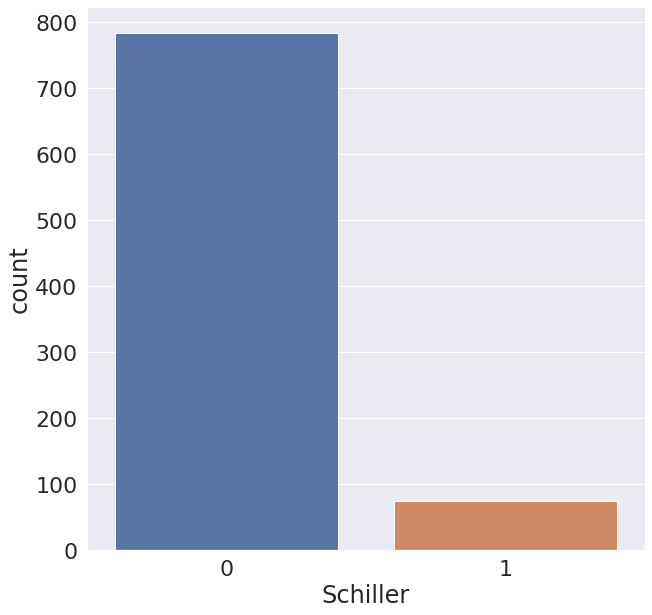

0    784
1     74
Name: Schiller, dtype: int64


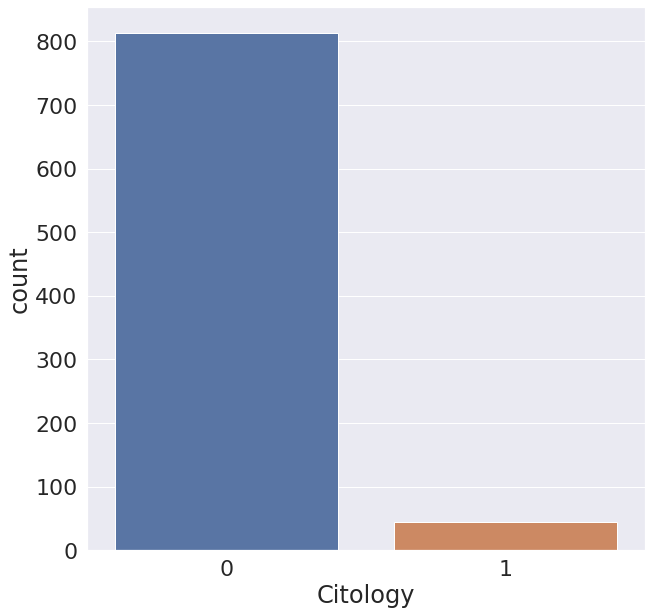

0    814
1     44
Name: Citology, dtype: int64


In [ ]:
binary_features = ['Smokes','Hormonal Contraceptives', 'IUD', 'STDs', 'STDs:condylomatosis','STDs:vaginal condylomatosis','STDs:vulvo-perineal condylomatosis','STDs:syphilis','STDs:pelvic inflammatory disease','STDs:genital herpes','STDs:molluscum contagiosum','STDs:HIV','STDs:Hepatitis B','STDs:HPV','Dx:Cancer','Dx:CIN','Dx:HPV','Dx','Hinselmann','Schiller','Citology']
for feature in binary_features:
    plt.figure(figsize=(10,10))
    sb.countplot(x=feature, data=df);
    plt.show()
    print(df[feature].value_counts())
    

# **Outliers Detection - IQR RULE**

In [ ]:
def outlier_treatment(out_df,numerical_features, drop = False):
    for col_name in numerical_features:
        sorted(out_df[col_name])
        Q1 = out_df[col_name].quantile(0.25)
        Q3 = out_df[col_name].quantile(0.75)
        IQR = Q3 - Q1
        lower_range = Q1 - (1.5 * IQR)
        upper_range = Q3 + (1.5 * IQR)
        print(col_name+':')
        print('lower range:'+ str(lower_range))
        print('upper range:'+ str(upper_range))
        if drop:
            out_df.drop(out_df[ (out_df[col_name] > upper_range) | (out_df[col_name] < lower_range) ].index , inplace=True)
        else:
            median = out_df[col_name].median()
            out_df[col_name] = np.where((out_df[col_name] > upper_range) | (out_df[col_name] < lower_range), median, out_df[col_name])
    return out_df.copy()


print(df.info())
drop_temp_df = df.copy()
sub_temp_df = df.copy()
drop_df = outlier_treatment(drop_temp_df, numerical_features, drop = True)
print(drop_df.info())
sub_df = outlier_treatment(sub_temp_df, numerical_features, drop = False)
print(sub_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 858 entries, 0 to 857
Data columns (total 34 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Age                                 858 non-null    int64  
 1   Number of sexual partners           858 non-null    float64
 2   First sexual intercourse            858 non-null    float64
 3   Num of pregnancies                  858 non-null    float64
 4   Smokes                              858 non-null    float64
 5   Smokes (years)                      858 non-null    float64
 6   Smokes (packs/year)                 858 non-null    float64
 7   Hormonal Contraceptives             858 non-null    float64
 8   Hormonal Contraceptives (years)     858 non-null    float64
 9   IUD                                 858 non-null    float64
 10  IUD (years)                         858 non-null    float64
 11  STDs                                858 non-n

In [ ]:
print(df['Biopsy'].value_counts())
print(sub_df['Biopsy'].value_counts())
print(drop_df['Biopsy'].value_counts())

0    803
1     55
Name: Biopsy, dtype: int64
0    803
1     55
Name: Biopsy, dtype: int64
0    456
1     21
Name: Biopsy, dtype: int64


If outliers of all the numerical features are eliminated, the number of elements belonging to all the classes are halved. This is not positive, because the small number of elements belonging to class 1, becomes smaller.
Moreover, for variables like 'Smokes' or 'STDs', where 0 value is more present in comparison to other numbers, if we remove these records this could mean removing possible important individuals, which can help us in outlining the disease.

# TRAINING AND TESTING MACHINE LEARNING MODELS

 # **Training and Test set**

In [ ]:
# Default
X = df.drop(['Biopsy'], axis = 1)
y = df['Biopsy']

(643, 33)
(643,)
(215, 33)
(215,)
0    602
1     41
Name: Biopsy, dtype: int64
0    201
1     14
Name: Biopsy, dtype: int64


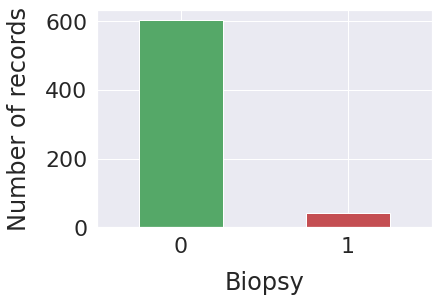

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, stratify = y, random_state= 10)

print(X_train.shape)
print(y_train.shape)

print(X_test.shape)
print(y_test.shape)

# Now look at the value counts for the target variable
print(y_train.value_counts())
print(y_test.value_counts())
#ax = df.plot.bar(x = , y=y_train.value_counts.values, rot=0)

y_train.value_counts().plot(kind = 'bar', rot = 0, color = ('g', 'r'))
plt.xlabel("Biopsy", labelpad=14)
plt.ylabel("Number of records", labelpad=14)

traintest_values = [X_train, X_test, y_train, y_test]

# **PCA**

[1.75151999e+01 9.06137159e+00 7.47281497e+00 6.11529105e+00
 5.49248296e+00 5.00414243e+00 4.67906038e+00 4.01601285e+00
 3.87256020e+00 3.57544663e+00 3.18268115e+00 3.10714428e+00
 3.03957356e+00 2.82953737e+00 2.57937631e+00 2.49008533e+00
 2.43436219e+00 2.28567566e+00 2.23002604e+00 1.77690217e+00
 1.65641065e+00 1.44640859e+00 9.67599083e-01 8.35299849e-01
 7.06613399e-01 5.28367091e-01 3.76552556e-01 2.62486228e-01
 2.17195529e-01 1.50815778e-01 6.80369296e-02 2.44672895e-02
 5.52695507e-31]


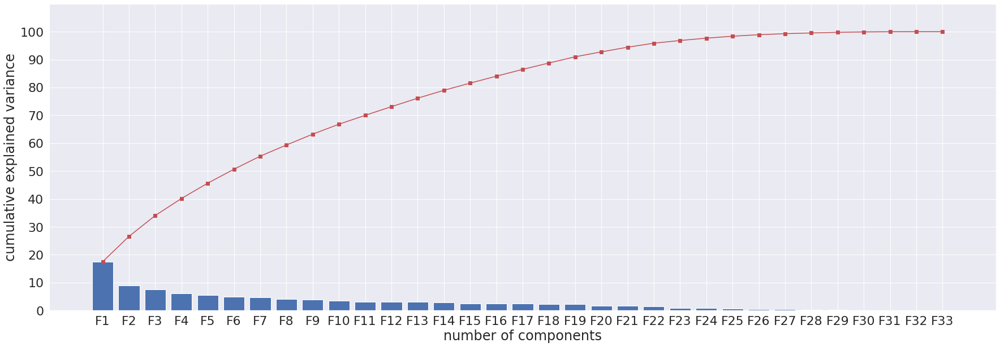

<class 'pandas.core.frame.DataFrame'>
Int64Index: 643 entries, 630 to 551
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   PC0     643 non-null    float64
dtypes: float64(1)
memory usage: 10.0 KB
None
<class 'pandas.core.frame.DataFrame'>
Int64Index: 215 entries, 354 to 194
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   PC0     215 non-null    float64
dtypes: float64(1)
memory usage: 3.4 KB
None


In [ ]:
# pca

# Standardize the continuous factors
def pca(X, num_of_variables):
    std_scale = StandardScaler()
    std_X = pd.DataFrame(std_scale.fit_transform(X), columns = X.columns)

    pca = PCA().fit(std_X)
    height = pca.explained_variance_ratio_*100
    print(height)
    bars = ('F1','F2','F3','F4','F5','F6','F7','F8','F9','F10','F11','F12','F13','F14','F15','F16','F17','F18','F19','F20','F21','F22','F23','F24','F25','F26','F27','F28','F29','F30','F31','F32','F33')
    y_pos = np.arange(len(bars))
    plt.figure(figsize = (30,10))
    plt.bar(y_pos,height)
    plt.xticks(y_pos,bars)

    plt.ylim(0,110)
    plt.yticks(np.arange(0, 110, step=10)) 
    plt.plot(np.cumsum(pca.explained_variance_ratio_)*100, 'r-s')
    plt.xlabel('number of components')
    plt.ylabel('cumulative explained variance')
    plt.show()

    # The curve reaches the elbow more or less at 10,11 features (VERIFICARE)

    # Sklearn pca 
    pca = PCA(num_of_variables)
    principalComponents = pca.fit_transform(std_X)
    columns = ['PC'+str(i) for i in range(num_of_variables)]

    principaldf = pd.DataFrame(data = principalComponents, columns = columns)
    principaldf.describe()

    return principaldf

defaultpca = pca(X, 1)

X_train, X_test, y_train, y_test = train_test_split(defaultpca, y, test_size=0.25, stratify = y, random_state= 10)

pca_traintest_values = [X_train, X_test, y_train, y_test]

print(pca_traintest_values[0].info())
print(pca_traintest_values[1].info())

[1.14910268e+01 1.09036217e+01 7.12903694e+00 6.66777592e+00
 5.62768366e+00 5.27819624e+00 5.08804730e+00 4.71950847e+00
 4.21179064e+00 4.06076360e+00 3.85759118e+00 3.78977758e+00
 3.62789879e+00 3.47481268e+00 3.22029424e+00 3.05839297e+00
 2.79630548e+00 2.68840782e+00 2.53409510e+00 2.05149203e+00
 1.50724675e+00 1.20176606e+00 4.89214241e-01 3.07395812e-01
 1.85146429e-01 3.27116004e-02 2.34082890e-31 6.92445590e-32
 6.92445590e-32 6.92445590e-32 6.92445590e-32 6.92445590e-32
 2.04833807e-32]


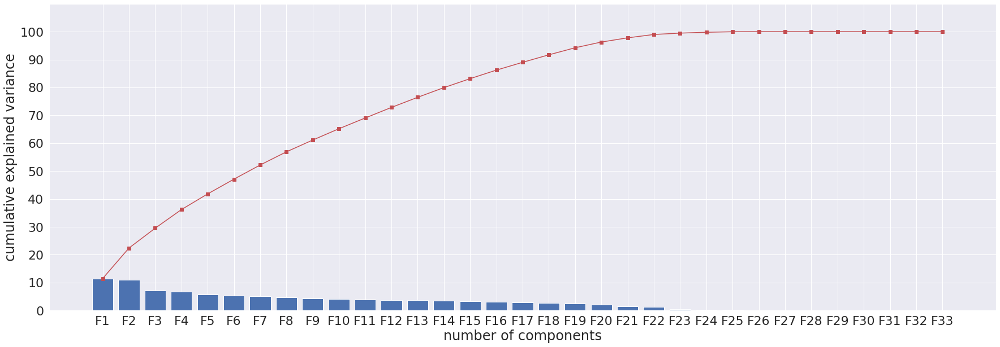

[2.20709719e+01 1.52241825e+01 1.45490352e+01 1.01799749e+01
 8.93615314e+00 8.22648562e+00 6.42777405e+00 5.04579195e+00
 3.81933981e+00 2.73631402e+00 1.84175870e+00 9.42218144e-01
 3.68190417e-31 1.42620359e-31 1.42620359e-31 1.42620359e-31
 1.42620359e-31 1.42620359e-31 1.42620359e-31 1.42620359e-31
 1.42620359e-31 1.42620359e-31 1.42620359e-31 1.42620359e-31
 1.42620359e-31 1.42620359e-31 1.42620359e-31 1.42620359e-31
 1.42620359e-31 1.42620359e-31 1.42620359e-31 1.42620359e-31
 1.42620359e-31]


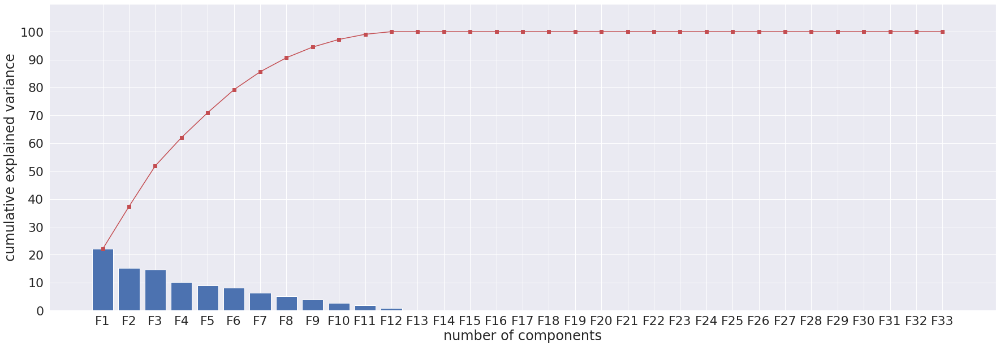

<class 'pandas.core.frame.DataFrame'>
Int64Index: 643 entries, 630 to 551
Data columns (total 33 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Age                                 643 non-null    float64
 1   Number of sexual partners           643 non-null    float64
 2   First sexual intercourse            643 non-null    float64
 3   Num of pregnancies                  643 non-null    float64
 4   Smokes                              643 non-null    float64
 5   Smokes (years)                      643 non-null    float64
 6   Smokes (packs/year)                 643 non-null    float64
 7   Hormonal Contraceptives             643 non-null    float64
 8   Hormonal Contraceptives (years)     643 non-null    float64
 9   IUD                                 643 non-null    float64
 10  IUD (years)                         643 non-null    float64
 11  STDs                                643 non

In [ ]:
############## Because of no improvements on the results, it is chosen not to use this part ###############
# Substitution of outliers
X = sub_df.drop(['Biopsy'], axis = 1)
y = sub_df['Biopsy']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, stratify = y, random_state= 10)

sub_traintest_values = [X_train, X_test, y_train, y_test]

# Substitution of outliers + PCA
sub_out_pca = pca(X,17)

X_train, X_test, y_train, y_test = train_test_split(sub_out_pca, y, test_size=0.25, stratify = y, random_state= 10)

sub_out_pca_traintest_values = [X_train, X_test, y_train, y_test]

# Elimination of outliers
X = drop_df.drop(['Biopsy'], axis = 1)
y = drop_df['Biopsy']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, stratify = y, random_state= 10)

drop_traintest_values = [X_train, X_test, y_train, y_test]

# Elimination of outliers + PCA
drop_out_pca = pca(X,7)

X_train, X_test, y_train, y_test = train_test_split(drop_out_pca, y, test_size=0.25, stratify = y, random_state= 10)

drop_out_pca_traintest_values = [X_train, X_test, y_train, y_test]

print(sub_traintest_values[0].info())
print(drop_traintest_values[0].info())
print(sub_out_pca_traintest_values[0].info())
print(drop_out_pca_traintest_values[0].info())


# Model definition


In [ ]:
# Useful functions
def prec_recall_curve(model_obj,X_test,y_test):   
    # predict probabilities
    probs = model_obj.predict_proba(X_test)
    # keep probabilities for the positive outcome only
    probs = probs[:, 1]
    # predict class values
    preds = model_obj.predict(X_test)
    # calculate precision-recall curve
    precision, recall, thresholds = precision_recall_curve(y_test, probs)
    # calculate average precision
    average_precision = average_precision_score(y_test, probs)
    
    # recall score for class 1 (Predict that Biopsy is True)
    rs = recall_score(y_test, preds)
    # calculate F1 score
    f1 = f1_score(y_test, preds)
    # calculate precision-recall AUC
    auc_score = auc(recall, precision)
    
    # create chart
    # In matplotlib < 1.5, plt.fill_between does not have a 'step' argument
    step_kwargs = ({'step': 'post'}
                   if 'step' in signature(plt.fill_between).parameters
                   else {})
    plt.step(recall, precision, color='b', alpha=0.2, where='post')
    plt.fill_between(recall, precision, alpha=0.2, color='b', **step_kwargs)

    # plot a "no skill" line
    plt.plot([0, 1], [0.5, 0.5], linestyle='--')

    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.ylim([0.0, 1.05])
    plt.xlim([0.0, 1.0])
    plt.title('Precision-Recall curve: Average Precision={0:0.3f}'.format(average_precision))
    plt.show()

    print('f1=%.3f auc=%.3f recall=%.3f' % (f1, auc_score, rs))

def ROC_curve(model_obj,X_test,y_test):
    y_score = model_obj.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test,y_score[:,1], pos_label = 1)
    roc_auc = auc(fpr, tpr)

    lw = 2
    plt.figure(figsize = (10,10))
    plt.plot(fpr, tpr, color='darkorange',
            lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()



def confusion_matrix(model_obj, X_test, y_test):
    disp = plot_confusion_matrix(model_obj, X_test, y_test,
                                 display_labels = ['No Disease','Disease'],
                                 cmap = plt.cm.Blues,
                                 normalize = 'true')
    
    disp.ax_.set_title('Confusion matrix')

    print(disp.confusion_matrix)
    plt.grid(False)
    plt.show()

def custom_auc_score(y_test, y_score):
    # calculate precision-recall curve
    precision, recall, thresholds = precision_recall_curve(y_test, y_score)
    # calculate precision-recall AUC
    auc_score = auc(recall, precision)

    return auc_score

auc_scorer = make_scorer(custom_auc_score, greater_is_better = True, needs_proba=True)

def plot_feature_importances(model,X_train):
    n_features = X_train.shape[1]
    plt.figure(figsize=(15,15))
    plt.barh(range(n_features), model.feature_importances_, align='center') 
    plt.yticks(np.arange(n_features), X.columns)
    plt.xlabel("Feature importance")
    plt.ylabel("Feature")

In [ ]:
# Model definition
def cv_model(classifier, params, values, upsample = False, standardization = False, reduction = False):
    X_train, X_test, y_train, y_test = values    

    if standardization and reduction and upsample:
        model = Pipeline([
            ('scaling', StandardScaler()),
            ('pca', PCA()),             
            ('sampling', SMOTE(random_state=42)),
            ('classification', classifier)
            ])
         
    elif standardization and reduction and not upsample:
        model = Pipeline([
            ('scaling', StandardScaler()),
            ('pca', PCA()),            
            ('classification', classifier)
            ])
    
    elif standardization and upsample and not reduction:
        model = Pipeline([
            ('scaling', StandardScaler()),
            ('sampling', SMOTE(random_state=42)),         
            ('classification', classifier)
            ])
        
    elif standardization and not upsample and not reduction:
        model = Pipeline([
            ('scaling', StandardScaler()),            
            ('classification', classifier)
            ])
        
    elif upsample and not standardization and not reduction:
        model = Pipeline([           
            ('sampling', SMOTE(random_state=42)),
            ('classification', classifier)
            ])

    else:
        model = Pipeline([
        ('classification', classifier)
        ])
                  
    clf = GridSearchCV(model, params, scoring = auc_scorer, cv = StratifiedKFold(n_splits = 5))

    # Fit the model on the training data
    model_obj = clf.fit(X_train, y_train)

    prec_recall_curve(model_obj,X_test,y_test)
    ROC_curve(model_obj,X_test,y_test)
    confusion_matrix(model_obj,X_test,y_test) 

    print("Best parameters set found on development set:")
    print()
    print(model_obj.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = model_obj.cv_results_['mean_test_score']
    stds = model_obj.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, model_obj.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
            % (mean, std * 2, params))
    print()

    print("Detailed classification report:")
    print()
    print("The model is trained on the full development set.")
    print("The scores are computed on the full evaluation set.")
    print()
    y_true, y_pred = y_test, clf.predict(X_test)
    print(classification_report(y_true, y_pred))
    print()

    if type(model['classification']) == DecisionTreeClassifier:
        if len(model_obj.best_estimator_.steps) == 4:
            plot_feature_importances(model_obj.best_estimator_.steps[3][1],X_train)
            plt.show()        
        elif len(model_obj.best_estimator_.steps) == 3:
            plot_feature_importances(model_obj.best_estimator_.steps[2][1],X_train)
            plt.show()        
        elif len(model_obj.best_estimator_.steps) == 2:
            plot_feature_importances(model_obj.best_estimator_.steps[1][1],X_train)
            plt.show()            
        elif len(model_obj.best_estimator_.steps) == 1:
            plot_feature_importances(model_obj.best_estimator_.steps[0][1],X_train)
            plt.show()



# **Logistic Regression**

DEFAULT IMPLEMENTATION


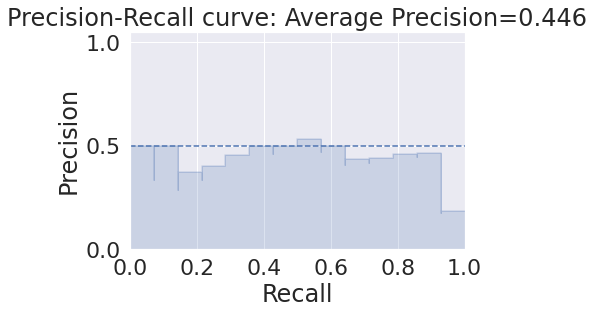

f1=0.000 auc=0.406 recall=0.000


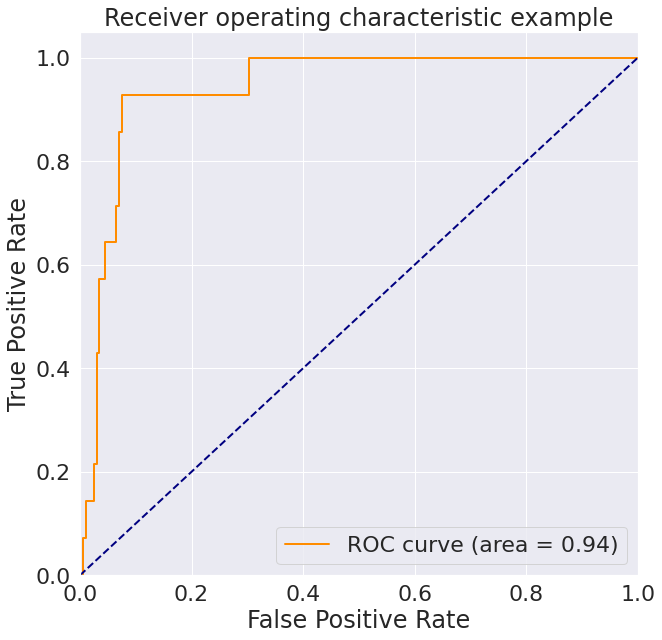

[[1. 0.]
 [1. 0.]]


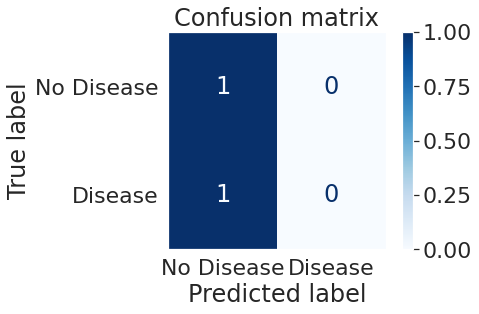

Best parameters set found on development set:

{'classification__C': 25, 'classification__penalty': 'l2'}

Grid scores on development set:

0.058 (+/-0.011) for {'classification__C': 0.001, 'classification__penalty': 'l1'}
0.095 (+/-0.106) for {'classification__C': 0.001, 'classification__penalty': 'l2'}
0.088 (+/-0.097) for {'classification__C': 0.009, 'classification__penalty': 'l1'}
0.130 (+/-0.131) for {'classification__C': 0.009, 'classification__penalty': 'l2'}
0.090 (+/-0.097) for {'classification__C': 0.01, 'classification__penalty': 'l1'}
0.136 (+/-0.134) for {'classification__C': 0.01, 'classification__penalty': 'l2'}
0.203 (+/-0.220) for {'classification__C': 0.09, 'classification__penalty': 'l1'}
0.270 (+/-0.183) for {'classification__C': 0.09, 'classification__penalty': 'l2'}
0.304 (+/-0.195) for {'classification__C': 1, 'classification__penalty': 'l1'}
0.314 (+/-0.185) for {'classification__C': 1, 'classification__penalty': 'l2'}
0.318 (+/-0.184) for {'classification__C':

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



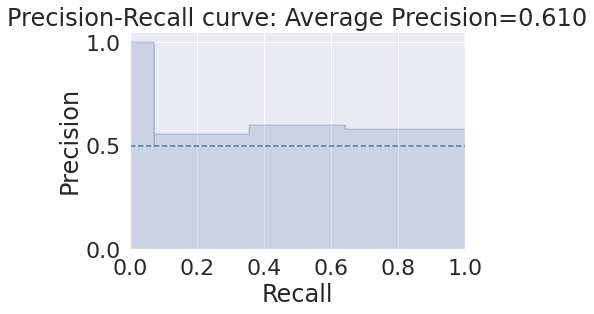

f1=0.621 auc=0.599 recall=0.643


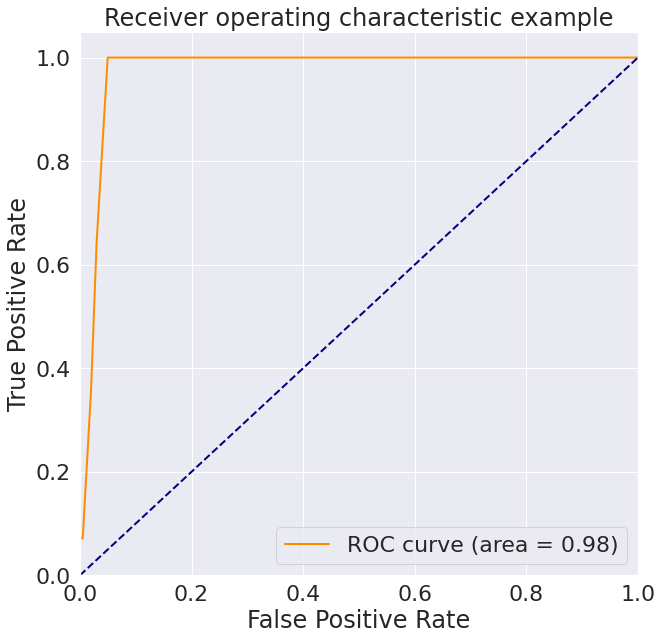

[[0.97014925 0.02985075]
 [0.35714286 0.64285714]]


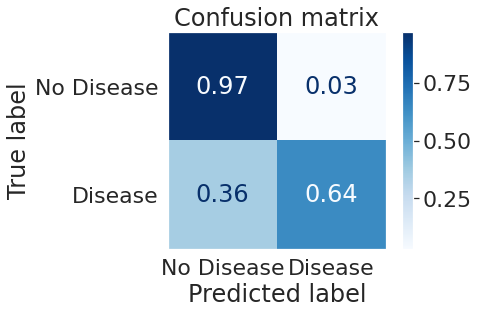

Best parameters set found on development set:

{'classification__C': 0.09, 'classification__penalty': 'l1'}

Grid scores on development set:

0.532 (+/-0.003) for {'classification__C': 0.001, 'classification__penalty': 'l1'}
0.699 (+/-0.170) for {'classification__C': 0.001, 'classification__penalty': 'l2'}
0.532 (+/-0.003) for {'classification__C': 0.009, 'classification__penalty': 'l1'}
0.711 (+/-0.173) for {'classification__C': 0.009, 'classification__penalty': 'l2'}
0.532 (+/-0.003) for {'classification__C': 0.01, 'classification__penalty': 'l1'}
0.712 (+/-0.172) for {'classification__C': 0.01, 'classification__penalty': 'l2'}
0.718 (+/-0.300) for {'classification__C': 0.09, 'classification__penalty': 'l1'}
0.656 (+/-0.279) for {'classification__C': 0.09, 'classification__penalty': 'l2'}
0.641 (+/-0.294) for {'classification__C': 1, 'classification__penalty': 'l1'}
0.626 (+/-0.272) for {'classification__C': 1, 'classification__penalty': 'l2'}
0.625 (+/-0.277) for {'classification__C

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.2

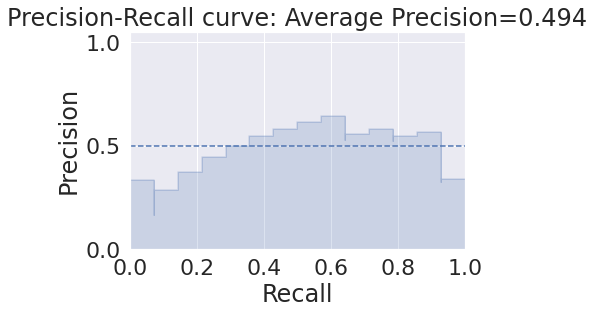

f1=0.703 auc=0.461 recall=0.929


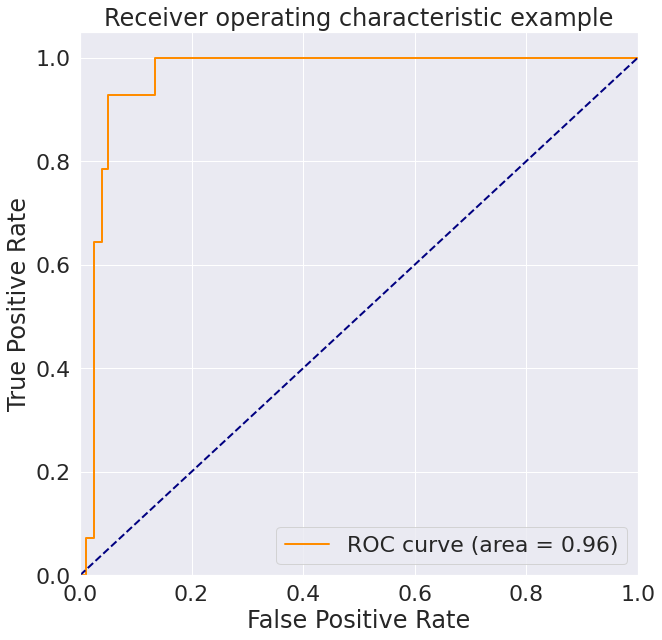

[[0.95024876 0.04975124]
 [0.07142857 0.92857143]]


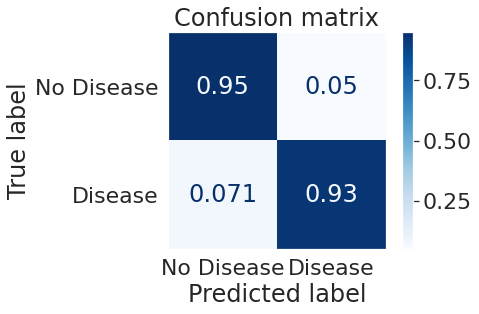

Best parameters set found on development set:

{'classification__C': 1, 'classification__penalty': 'l1'}

Grid scores on development set:

0.532 (+/-0.003) for {'classification__C': 0.001, 'classification__penalty': 'l1'}
0.141 (+/-0.142) for {'classification__C': 0.001, 'classification__penalty': 'l2'}
0.630 (+/-0.432) for {'classification__C': 0.009, 'classification__penalty': 'l1'}
0.554 (+/-0.329) for {'classification__C': 0.009, 'classification__penalty': 'l2'}
0.630 (+/-0.432) for {'classification__C': 0.01, 'classification__penalty': 'l1'}
0.566 (+/-0.331) for {'classification__C': 0.01, 'classification__penalty': 'l2'}
0.666 (+/-0.352) for {'classification__C': 0.09, 'classification__penalty': 'l1'}
0.666 (+/-0.304) for {'classification__C': 0.09, 'classification__penalty': 'l2'}
0.670 (+/-0.306) for {'classification__C': 1, 'classification__penalty': 'l1'}
0.663 (+/-0.305) for {'classification__C': 1, 'classification__penalty': 'l2'}
0.664 (+/-0.308) for {'classification__C': 

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.2

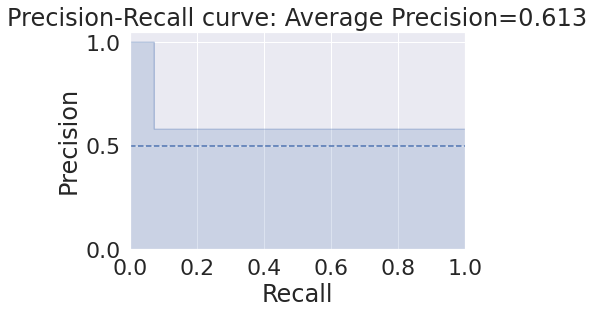

f1=0.737 auc=0.807 recall=1.000


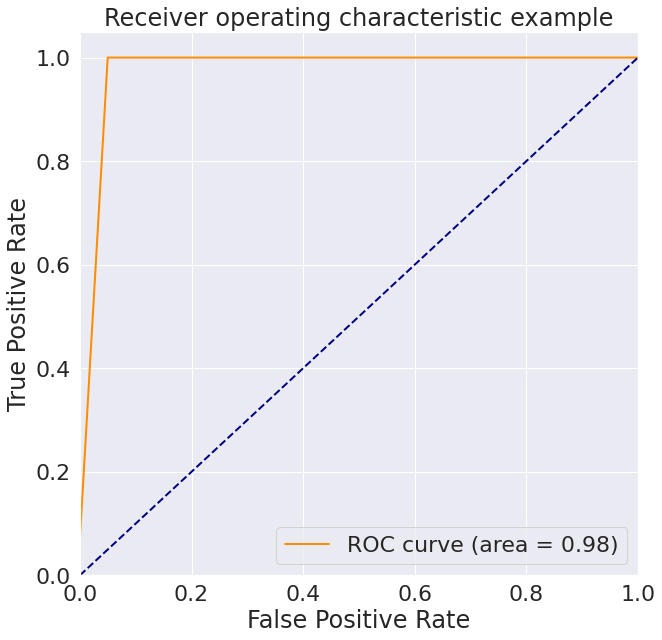

[[0.95024876 0.04975124]
 [0.         1.        ]]


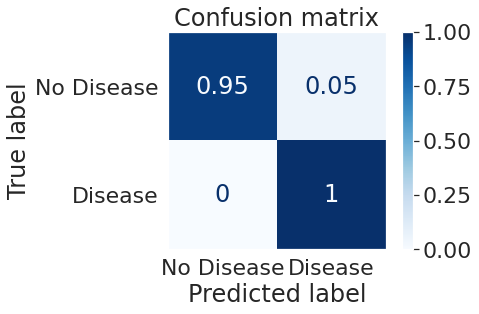

Best parameters set found on development set:

{'classification__C': 0.009, 'classification__penalty': 'l1'}

Grid scores on development set:

0.532 (+/-0.003) for {'classification__C': 0.001, 'classification__penalty': 'l1'}
0.705 (+/-0.251) for {'classification__C': 0.001, 'classification__penalty': 'l2'}
0.727 (+/-0.238) for {'classification__C': 0.009, 'classification__penalty': 'l1'}
0.643 (+/-0.360) for {'classification__C': 0.009, 'classification__penalty': 'l2'}
0.713 (+/-0.227) for {'classification__C': 0.01, 'classification__penalty': 'l1'}
0.641 (+/-0.365) for {'classification__C': 0.01, 'classification__penalty': 'l2'}
0.608 (+/-0.422) for {'classification__C': 0.09, 'classification__penalty': 'l1'}
0.605 (+/-0.400) for {'classification__C': 0.09, 'classification__penalty': 'l2'}
0.564 (+/-0.420) for {'classification__C': 1, 'classification__penalty': 'l1'}
0.565 (+/-0.422) for {'classification__C': 1, 'classification__penalty': 'l2'}
0.562 (+/-0.420) for {'classification__

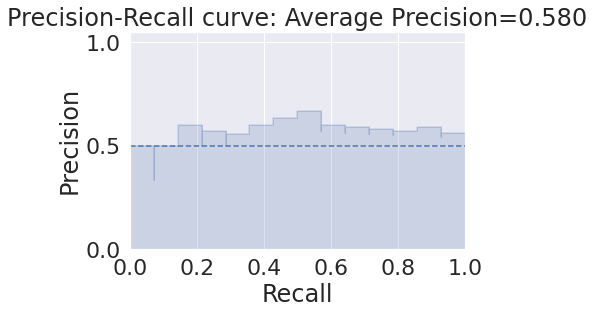

f1=0.222 auc=0.539 recall=0.143


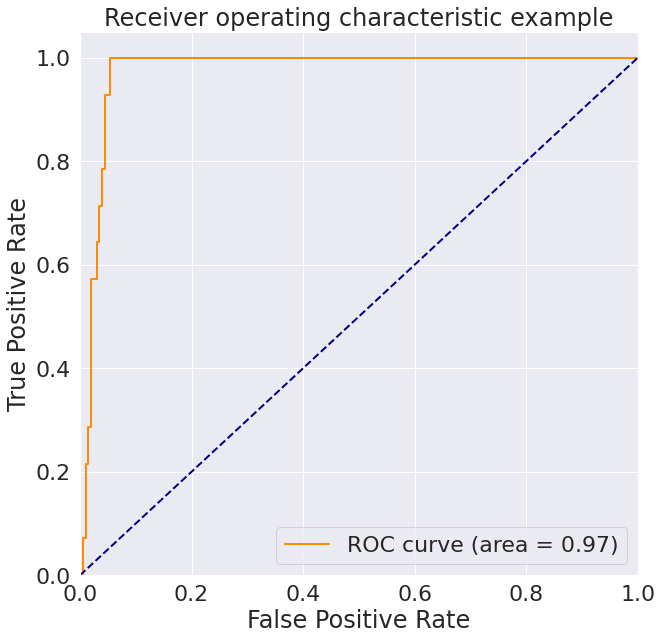

[[0.99004975 0.00995025]
 [0.85714286 0.14285714]]


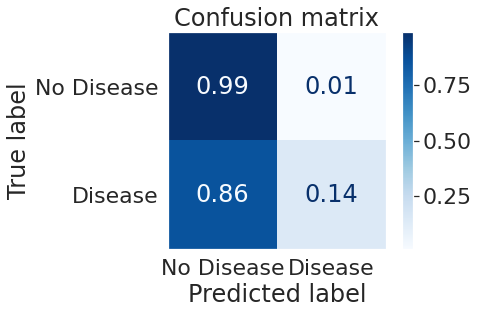

Best parameters set found on development set:

{'classification__C': 0.01, 'classification__penalty': 'l2'}

Grid scores on development set:

0.532 (+/-0.003) for {'classification__C': 0.001, 'classification__penalty': 'l1'}
0.699 (+/-0.170) for {'classification__C': 0.001, 'classification__penalty': 'l2'}
0.532 (+/-0.003) for {'classification__C': 0.009, 'classification__penalty': 'l1'}
0.711 (+/-0.173) for {'classification__C': 0.009, 'classification__penalty': 'l2'}
0.473 (+/-0.235) for {'classification__C': 0.01, 'classification__penalty': 'l1'}
0.712 (+/-0.172) for {'classification__C': 0.01, 'classification__penalty': 'l2'}
0.663 (+/-0.272) for {'classification__C': 0.09, 'classification__penalty': 'l1'}
0.656 (+/-0.279) for {'classification__C': 0.09, 'classification__penalty': 'l2'}
0.670 (+/-0.301) for {'classification__C': 1, 'classification__penalty': 'l1'}
0.626 (+/-0.272) for {'classification__C': 1, 'classification__penalty': 'l2'}
0.627 (+/-0.273) for {'classification__C

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.2

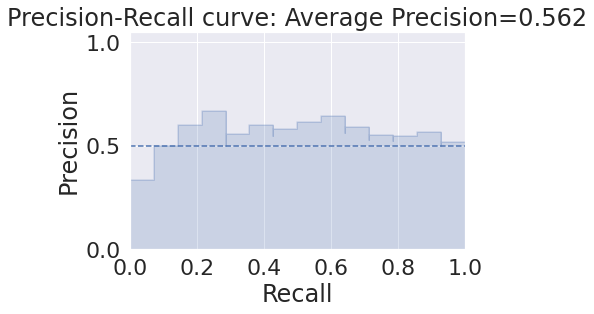

f1=0.683 auc=0.527 recall=1.000


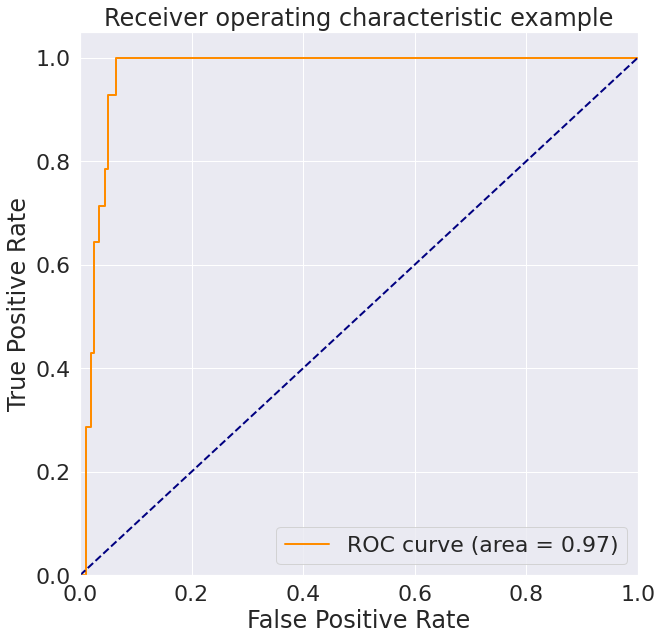

[[0.93532338 0.06467662]
 [0.         1.        ]]


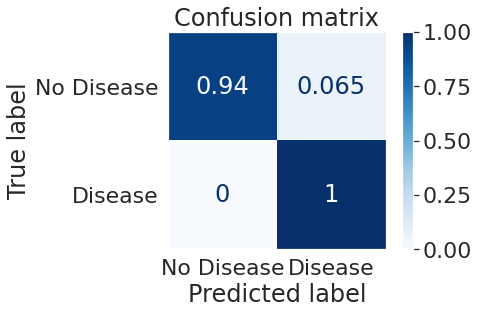

Best parameters set found on development set:

{'classification__C': 0.001, 'classification__penalty': 'l2'}

Grid scores on development set:

0.532 (+/-0.003) for {'classification__C': 0.001, 'classification__penalty': 'l1'}
0.705 (+/-0.251) for {'classification__C': 0.001, 'classification__penalty': 'l2'}
0.697 (+/-0.245) for {'classification__C': 0.009, 'classification__penalty': 'l1'}
0.643 (+/-0.360) for {'classification__C': 0.009, 'classification__penalty': 'l2'}
0.691 (+/-0.247) for {'classification__C': 0.01, 'classification__penalty': 'l1'}
0.641 (+/-0.365) for {'classification__C': 0.01, 'classification__penalty': 'l2'}
0.646 (+/-0.410) for {'classification__C': 0.09, 'classification__penalty': 'l1'}
0.605 (+/-0.400) for {'classification__C': 0.09, 'classification__penalty': 'l2'}
0.567 (+/-0.419) for {'classification__C': 1, 'classification__penalty': 'l1'}
0.565 (+/-0.421) for {'classification__C': 1, 'classification__penalty': 'l2'}
0.564 (+/-0.421) for {'classification__

In [ ]:
lr_params = {"classification__C":[0.001,.009,0.01,.09,1,5,10,25], "classification__penalty":["l1","l2"]}

lr1 = LogisticRegression(solver='saga')
lr2 = LogisticRegression(solver='liblinear')


@ignore_warnings(category=ConvergenceWarning)
def my_function():
    print('DEFAULT IMPLEMENTATION')
    cv_model(lr1, lr_params, traintest_values)
    print('STANDARDIZATION')
    cv_model(lr1, lr_params, traintest_values, standardization = True)
    print('OVERSAMPLING')
    cv_model(lr1, lr_params, traintest_values,upsample=True)
    print('STANDARDIZATION AND OVERSAMPLING')
    cv_model(lr1, lr_params, traintest_values, standardization = True, upsample=True)    


    print('PCA')
    cv_model(lr1, lr_params, traintest_values, standardization = True, reduction = True)
    print('PCA + OVERSAMPLING')
    cv_model(lr1, lr_params,  traintest_values, standardization = True, reduction = True, upsample = True)


my_function()

# **KNN**

DEFAULT IMPLEMENTATION


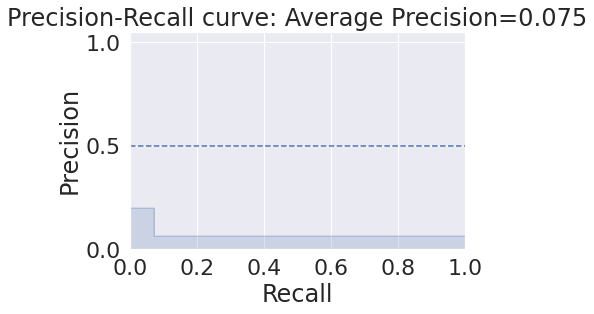

f1=0.105 auc=0.166 recall=0.071


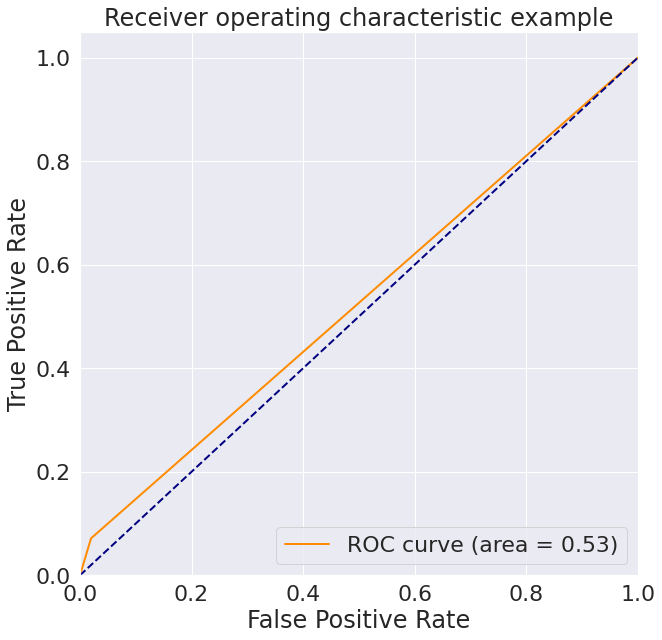

[[0.9800995  0.0199005 ]
 [0.92857143 0.07142857]]


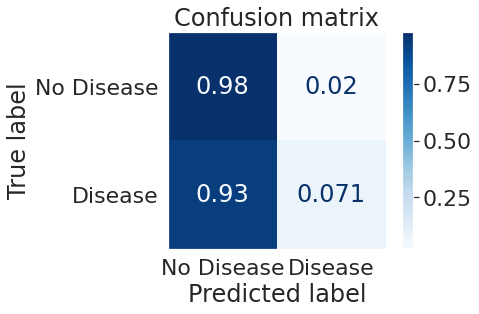

Best parameters set found on development set:

{'classification__n_neighbors': 1}

Grid scores on development set:

0.178 (+/-0.198) for {'classification__n_neighbors': 1}
0.155 (+/-0.092) for {'classification__n_neighbors': 2}
0.118 (+/-0.118) for {'classification__n_neighbors': 3}
0.147 (+/-0.124) for {'classification__n_neighbors': 4}
0.104 (+/-0.093) for {'classification__n_neighbors': 5}
0.113 (+/-0.133) for {'classification__n_neighbors': 6}
0.115 (+/-0.153) for {'classification__n_neighbors': 7}
0.118 (+/-0.151) for {'classification__n_neighbors': 8}
0.089 (+/-0.052) for {'classification__n_neighbors': 9}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           0       0.94      0.98      0.96       201
           1       0.20      0.07      0.11        14

    accuracy                           0.92       215
   macro avg       0.57  

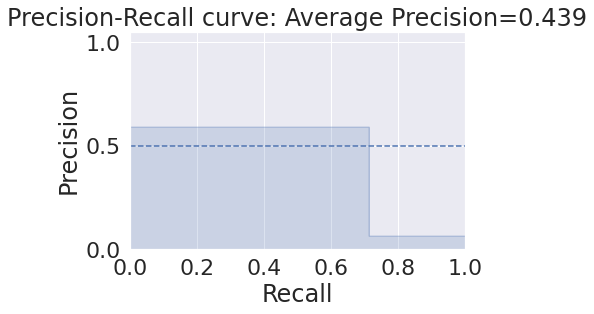

f1=0.645 auc=0.661 recall=0.714


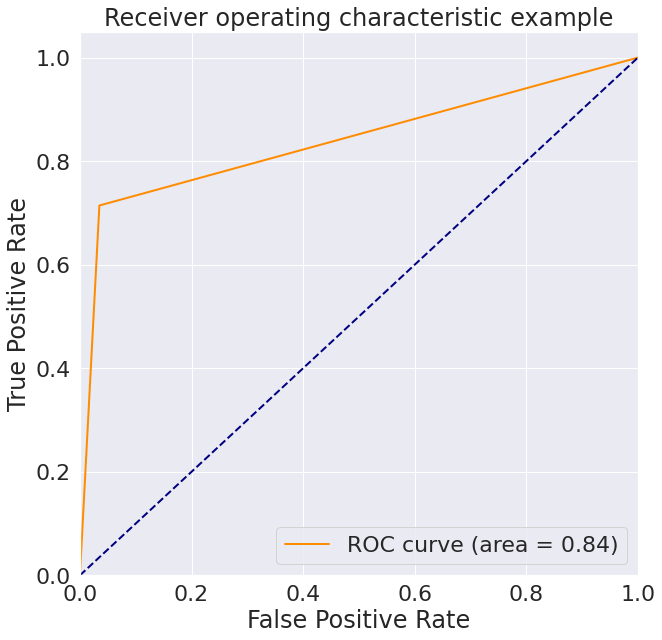

[[0.96517413 0.03482587]
 [0.28571429 0.71428571]]


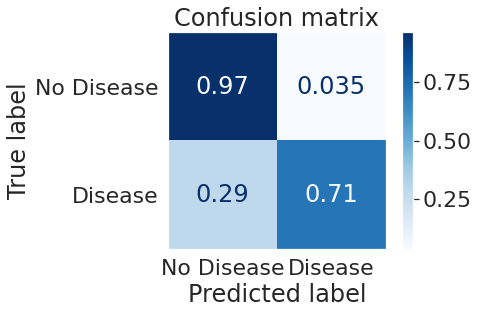

Best parameters set found on development set:

{'classification__n_neighbors': 1}

Grid scores on development set:

0.580 (+/-0.438) for {'classification__n_neighbors': 1}
0.566 (+/-0.518) for {'classification__n_neighbors': 2}
0.510 (+/-0.462) for {'classification__n_neighbors': 3}
0.533 (+/-0.439) for {'classification__n_neighbors': 4}
0.493 (+/-0.424) for {'classification__n_neighbors': 5}
0.471 (+/-0.367) for {'classification__n_neighbors': 6}
0.469 (+/-0.363) for {'classification__n_neighbors': 7}
0.484 (+/-0.380) for {'classification__n_neighbors': 8}
0.469 (+/-0.379) for {'classification__n_neighbors': 9}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           0       0.98      0.97      0.97       201
           1       0.59      0.71      0.65        14

    accuracy                           0.95       215
   macro avg       0.78  

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.2

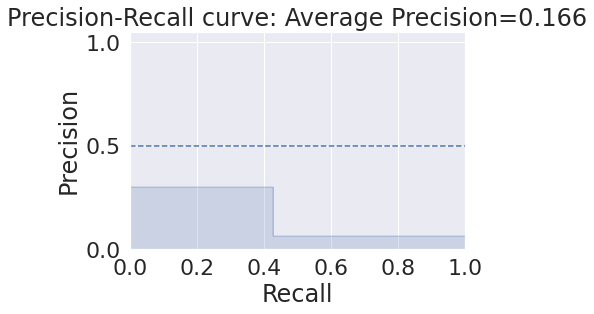

f1=0.353 auc=0.383 recall=0.429


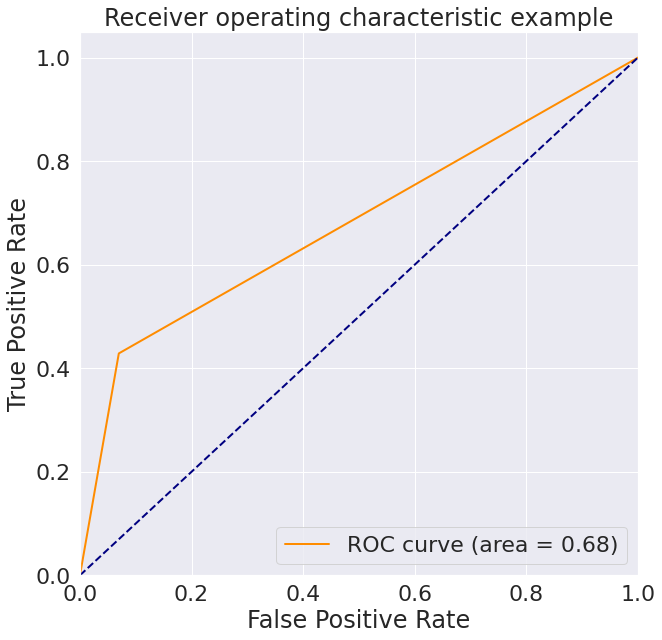

[[0.93034826 0.06965174]
 [0.57142857 0.42857143]]


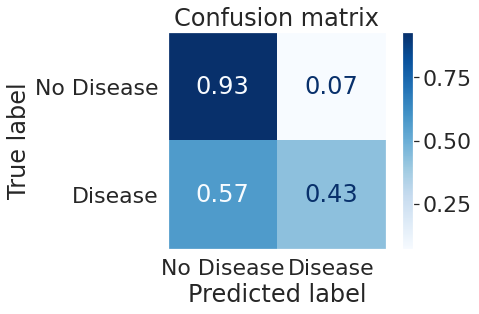

Best parameters set found on development set:

{'classification__n_neighbors': 1}

Grid scores on development set:

0.244 (+/-0.264) for {'classification__n_neighbors': 1}
0.228 (+/-0.229) for {'classification__n_neighbors': 2}
0.227 (+/-0.210) for {'classification__n_neighbors': 3}
0.169 (+/-0.129) for {'classification__n_neighbors': 4}
0.149 (+/-0.089) for {'classification__n_neighbors': 5}
0.147 (+/-0.077) for {'classification__n_neighbors': 6}
0.152 (+/-0.079) for {'classification__n_neighbors': 7}
0.148 (+/-0.082) for {'classification__n_neighbors': 8}
0.130 (+/-0.069) for {'classification__n_neighbors': 9}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           0       0.96      0.93      0.94       201
           1       0.30      0.43      0.35        14

    accuracy                           0.90       215
   macro avg       0.63  

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.2

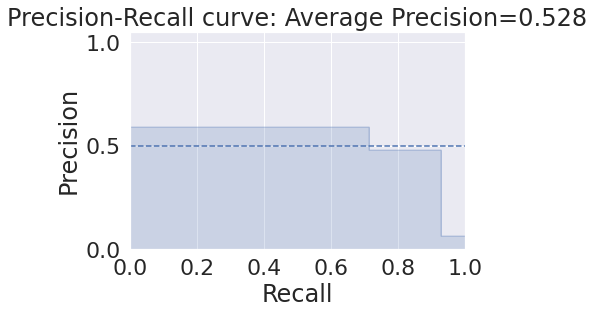

f1=0.645 auc=0.701 recall=0.714


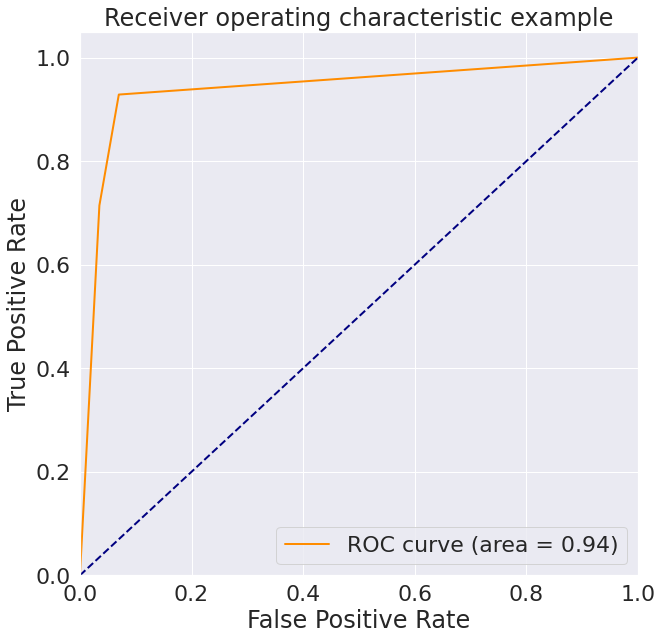

[[0.96517413 0.03482587]
 [0.28571429 0.71428571]]


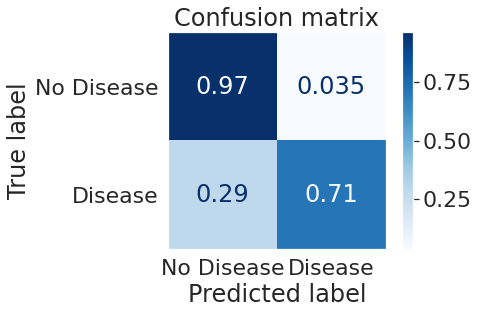

Best parameters set found on development set:

{'classification__n_neighbors': 2}

Grid scores on development set:

0.616 (+/-0.425) for {'classification__n_neighbors': 1}
0.645 (+/-0.343) for {'classification__n_neighbors': 2}
0.622 (+/-0.359) for {'classification__n_neighbors': 3}
0.627 (+/-0.339) for {'classification__n_neighbors': 4}
0.608 (+/-0.419) for {'classification__n_neighbors': 5}
0.599 (+/-0.406) for {'classification__n_neighbors': 6}
0.611 (+/-0.437) for {'classification__n_neighbors': 7}
0.611 (+/-0.437) for {'classification__n_neighbors': 8}
0.621 (+/-0.433) for {'classification__n_neighbors': 9}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           0       0.98      0.97      0.97       201
           1       0.59      0.71      0.65        14

    accuracy                           0.95       215
   macro avg       0.78  

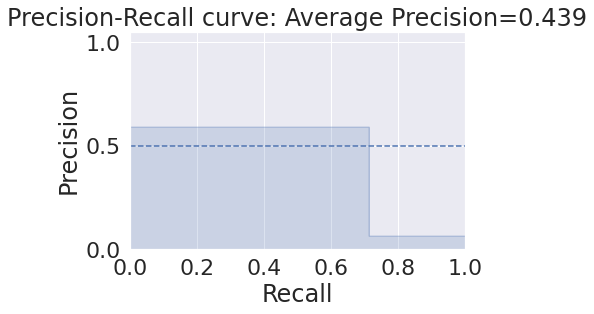

f1=0.645 auc=0.661 recall=0.714


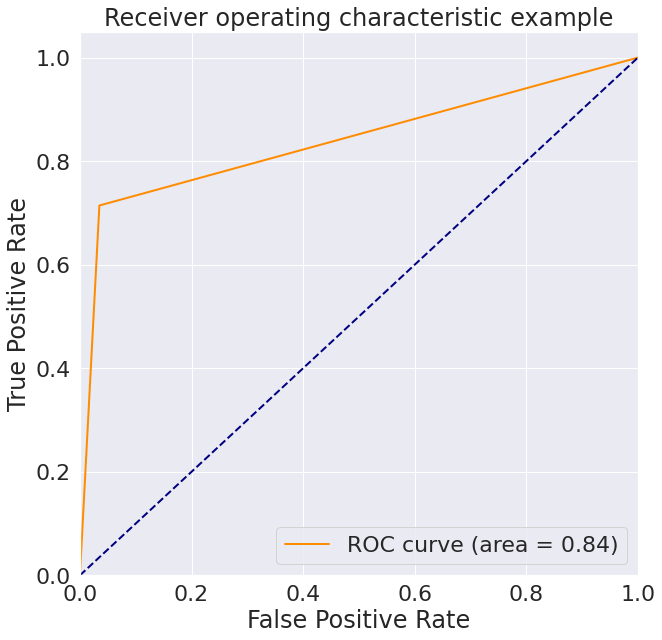

[[0.96517413 0.03482587]
 [0.28571429 0.71428571]]


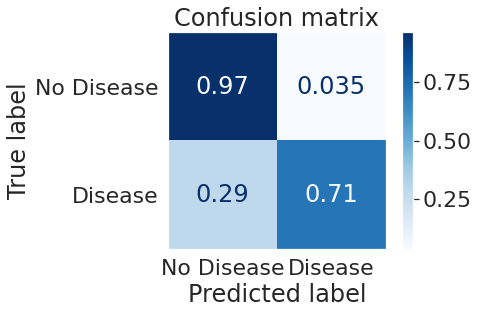

Best parameters set found on development set:

{'classification__n_neighbors': 1}

Grid scores on development set:

0.580 (+/-0.438) for {'classification__n_neighbors': 1}
0.566 (+/-0.518) for {'classification__n_neighbors': 2}
0.510 (+/-0.462) for {'classification__n_neighbors': 3}
0.533 (+/-0.439) for {'classification__n_neighbors': 4}
0.493 (+/-0.424) for {'classification__n_neighbors': 5}
0.471 (+/-0.367) for {'classification__n_neighbors': 6}
0.469 (+/-0.363) for {'classification__n_neighbors': 7}
0.484 (+/-0.380) for {'classification__n_neighbors': 8}
0.469 (+/-0.379) for {'classification__n_neighbors': 9}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           0       0.98      0.97      0.97       201
           1       0.59      0.71      0.65        14

    accuracy                           0.95       215
   macro avg       0.78  

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.2

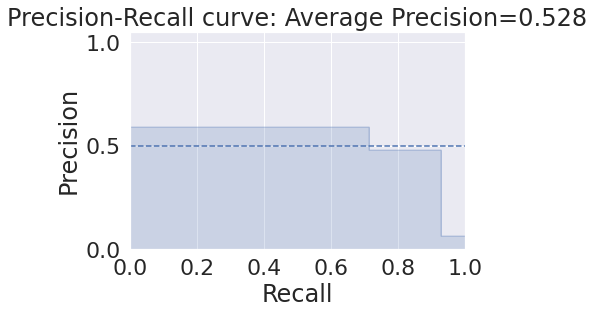

f1=0.645 auc=0.701 recall=0.714


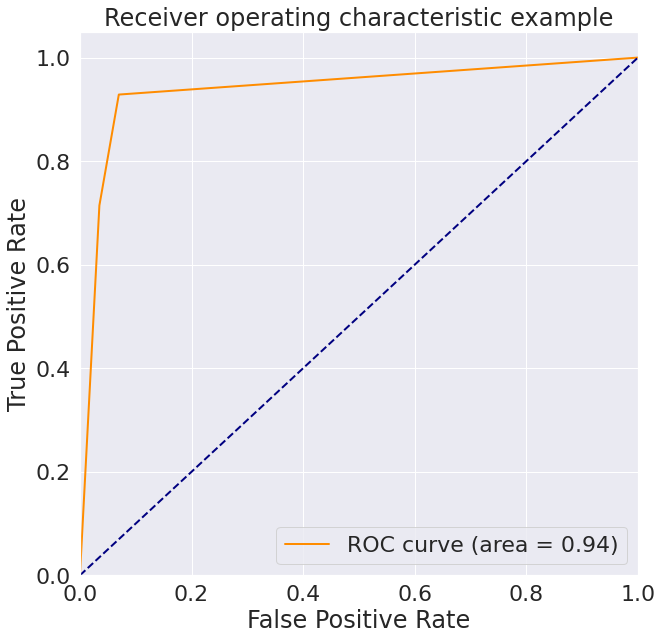

[[0.96517413 0.03482587]
 [0.28571429 0.71428571]]


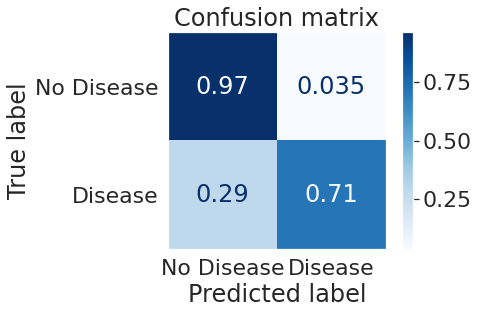

Best parameters set found on development set:

{'classification__n_neighbors': 2}

Grid scores on development set:

0.616 (+/-0.425) for {'classification__n_neighbors': 1}
0.645 (+/-0.343) for {'classification__n_neighbors': 2}
0.622 (+/-0.359) for {'classification__n_neighbors': 3}
0.627 (+/-0.339) for {'classification__n_neighbors': 4}
0.608 (+/-0.419) for {'classification__n_neighbors': 5}
0.599 (+/-0.406) for {'classification__n_neighbors': 6}
0.611 (+/-0.437) for {'classification__n_neighbors': 7}
0.611 (+/-0.437) for {'classification__n_neighbors': 8}
0.621 (+/-0.433) for {'classification__n_neighbors': 9}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           0       0.98      0.97      0.97       201
           1       0.59      0.71      0.65        14

    accuracy                           0.95       215
   macro avg       0.78  

In [ ]:
knn_params = {"classification__n_neighbors":list(range(1, 10))}

knn = KNeighborsClassifier()


@ignore_warnings(category=ConvergenceWarning)
def my_function():
    print('DEFAULT IMPLEMENTATION')
    cv_model(knn, knn_params, traintest_values)
    print('STANDARDIZATION')
    cv_model(knn, knn_params, traintest_values, standardization = True)
    print('OVERSAMPLING')
    cv_model(knn, knn_params, traintest_values,upsample=True)
    print('STANDARDIZATION AND OVERSAMPLING')
    cv_model(knn, knn_params, traintest_values, standardization = True, upsample=True)    

    print('PCA')
    cv_model(knn, knn_params, traintest_values, standardization = True, reduction = True)
    print('PCA + OVERSAMPLING')
    cv_model(knn, knn_params,  traintest_values, standardization = True, reduction = True, upsample = True)

    

my_function()

# **Decision tree**

DEFAULT IMPLEMENTATION


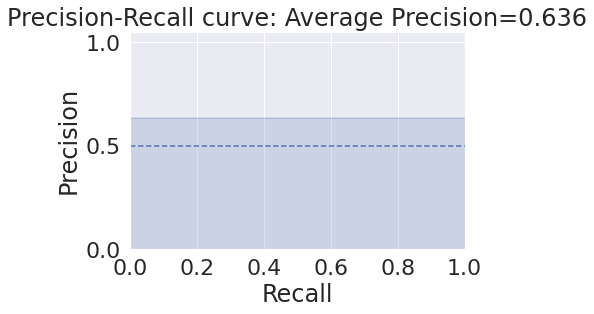

f1=0.778 auc=0.818 recall=1.000


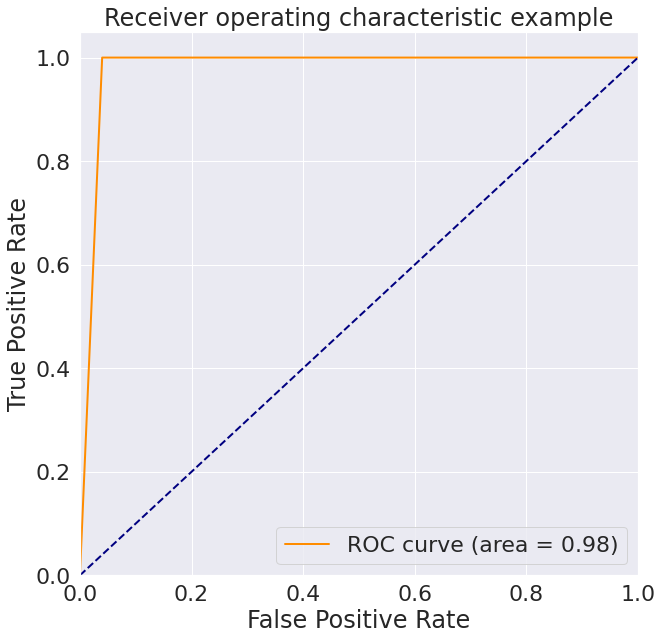

[[0.960199 0.039801]
 [0.       1.      ]]


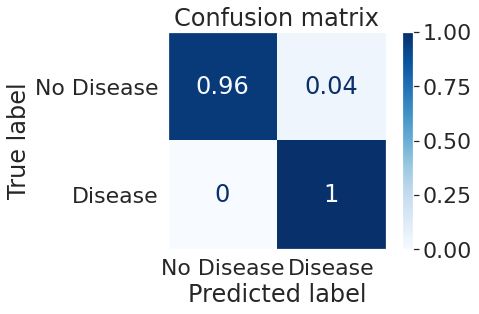

Best parameters set found on development set:

{'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 4}

Grid scores on development set:

0.640 (+/-0.202) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2}
0.563 (+/-0.367) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 3}
0.655 (+/-0.156) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 4}
0.489 (+/-0.428) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 5}
0.515 (+/-0.381) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 6}
0.585 (+/-0.459) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth'

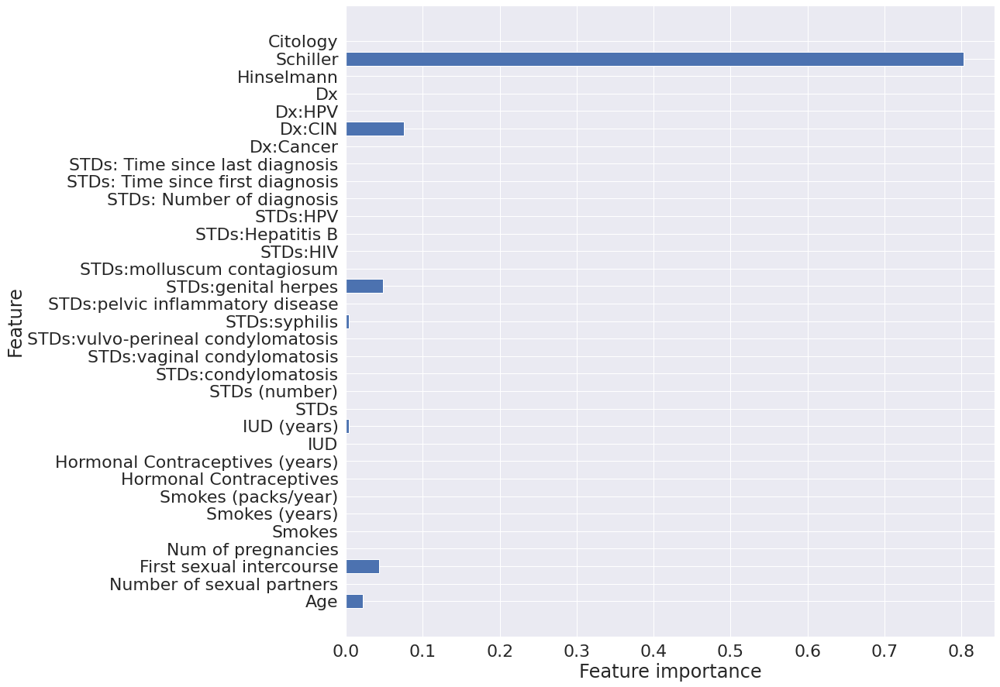

STANDARDIZATION


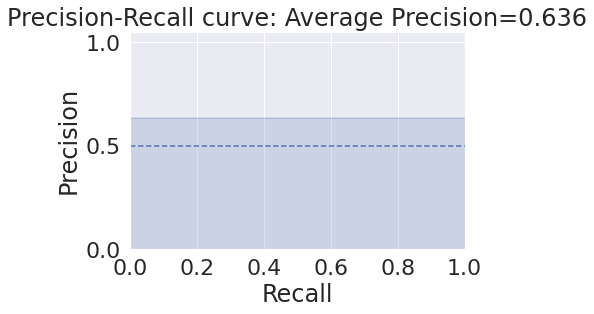

f1=0.778 auc=0.818 recall=1.000


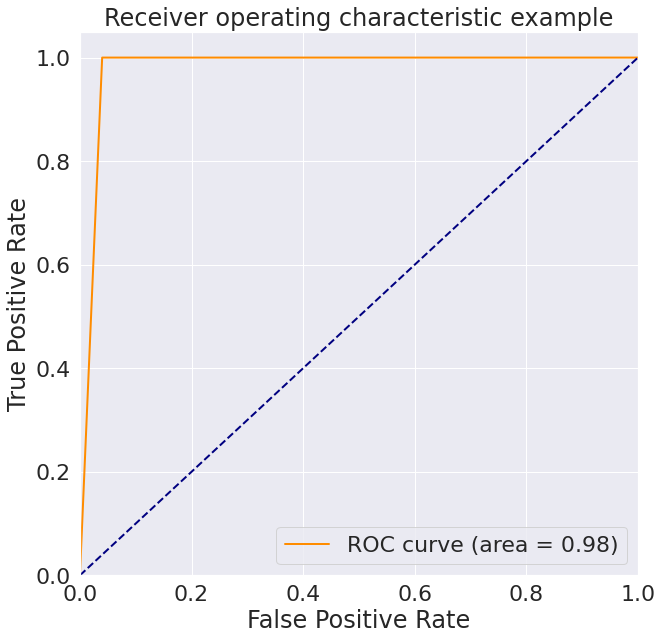

[[0.960199 0.039801]
 [0.       1.      ]]


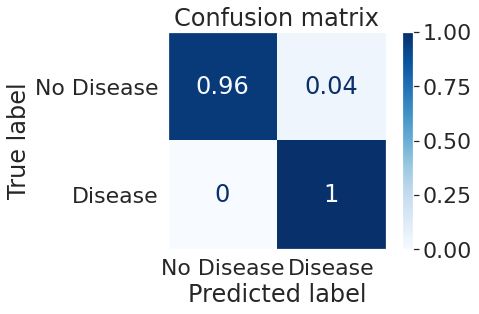

Best parameters set found on development set:

{'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 4}

Grid scores on development set:

0.640 (+/-0.202) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2}
0.563 (+/-0.367) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 3}
0.655 (+/-0.156) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 4}
0.489 (+/-0.428) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 5}
0.515 (+/-0.381) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 6}
0.585 (+/-0.459) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth'

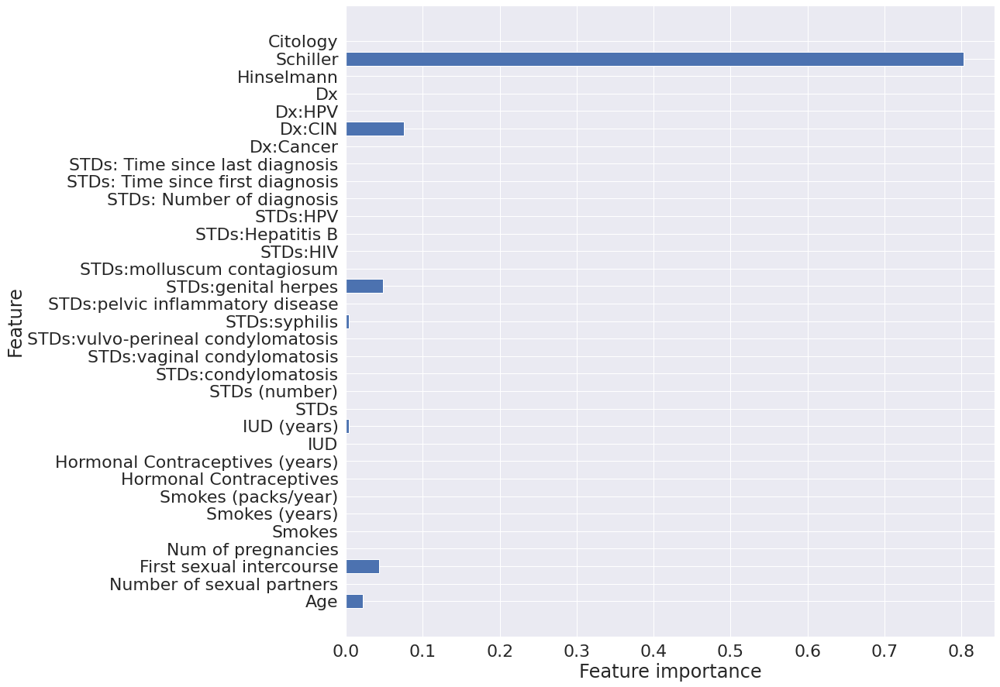

OVERSAMPLING


/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.2

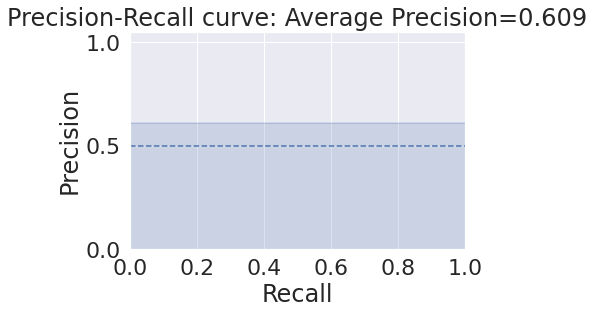

f1=0.718 auc=0.804 recall=1.000


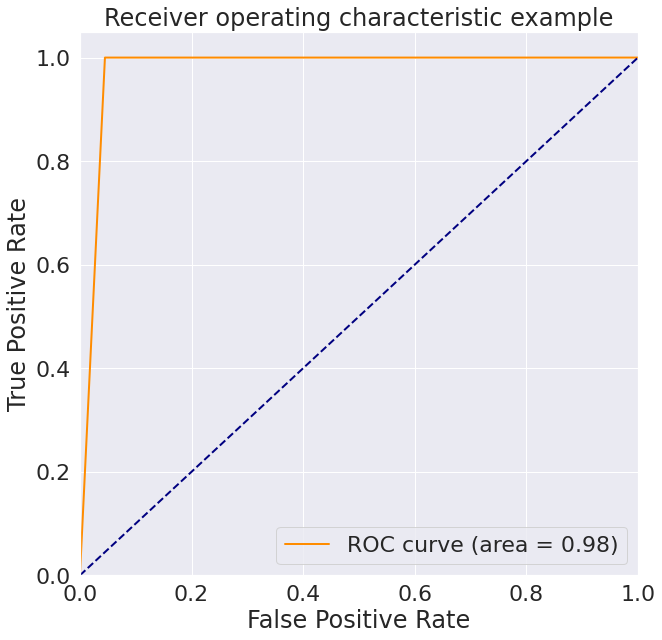

[[0.94527363 0.05472637]
 [0.         1.        ]]


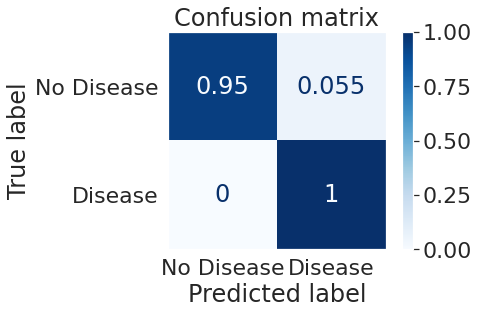

Best parameters set found on development set:

{'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2}

Grid scores on development set:

0.726 (+/-0.257) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2}
0.614 (+/-0.436) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 3}
0.620 (+/-0.419) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 4}
0.563 (+/-0.383) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 5}
0.479 (+/-0.250) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 6}
0.538 (+/-0.310) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth'

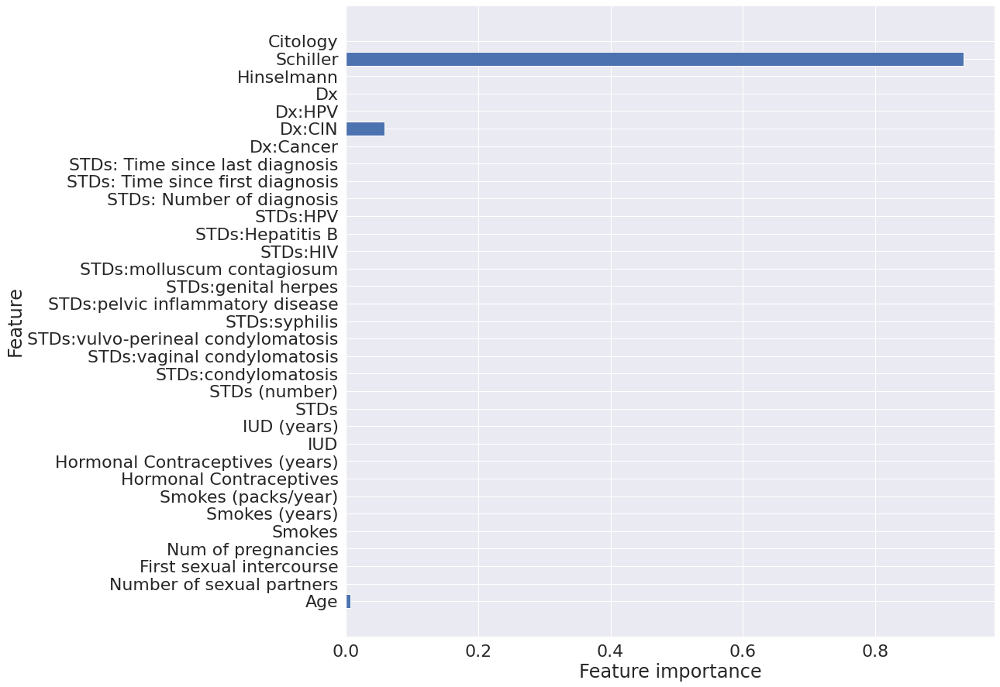

STANDARDIZATION AND OVERSAMPLING


/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.2

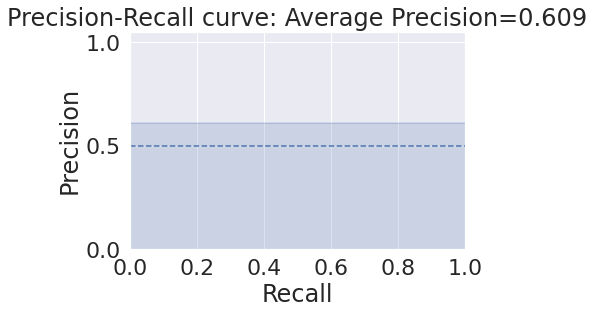

f1=0.718 auc=0.804 recall=1.000


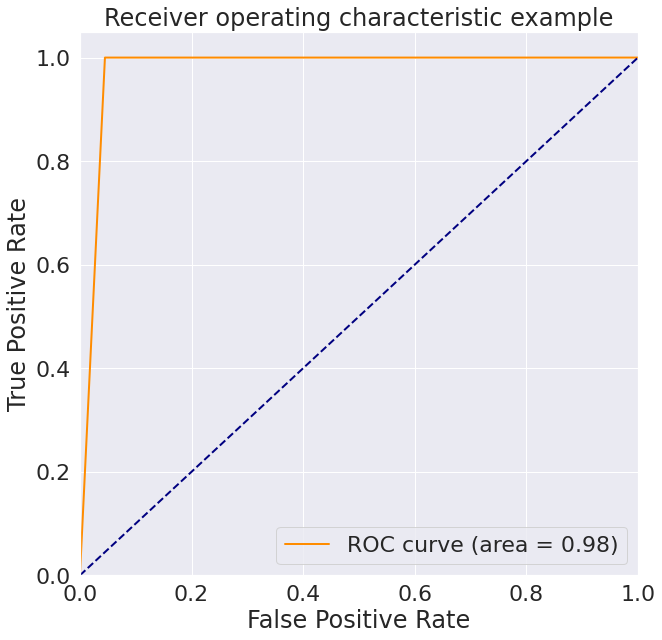

[[0.94527363 0.05472637]
 [0.         1.        ]]


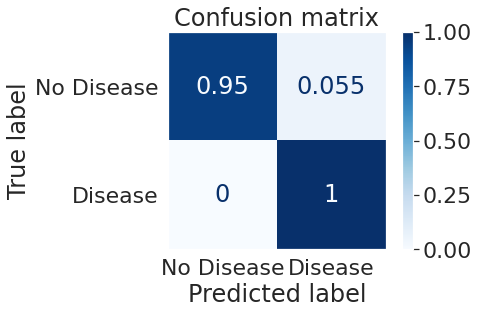

Best parameters set found on development set:

{'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2}

Grid scores on development set:

0.707 (+/-0.288) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2}
0.580 (+/-0.294) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 3}
0.589 (+/-0.296) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 4}
0.512 (+/-0.383) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 5}
0.428 (+/-0.204) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 6}
0.461 (+/-0.245) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth'

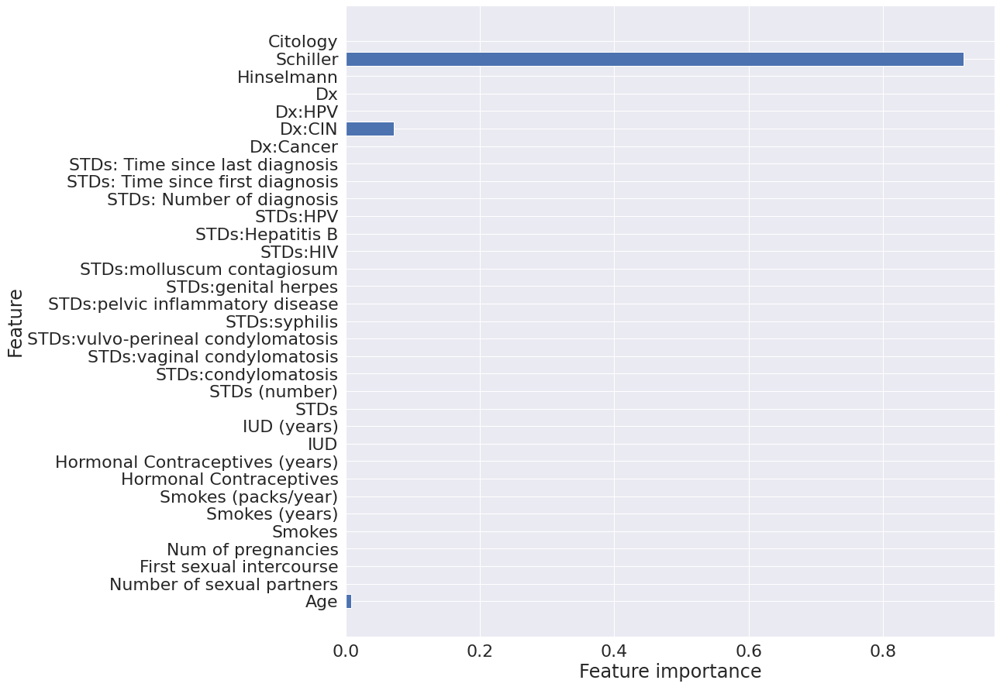

PCA


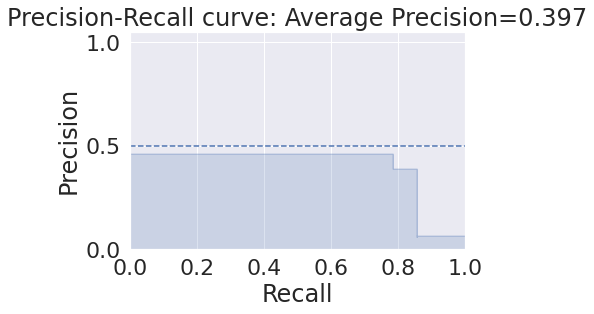

f1=0.533 auc=0.612 recall=0.857


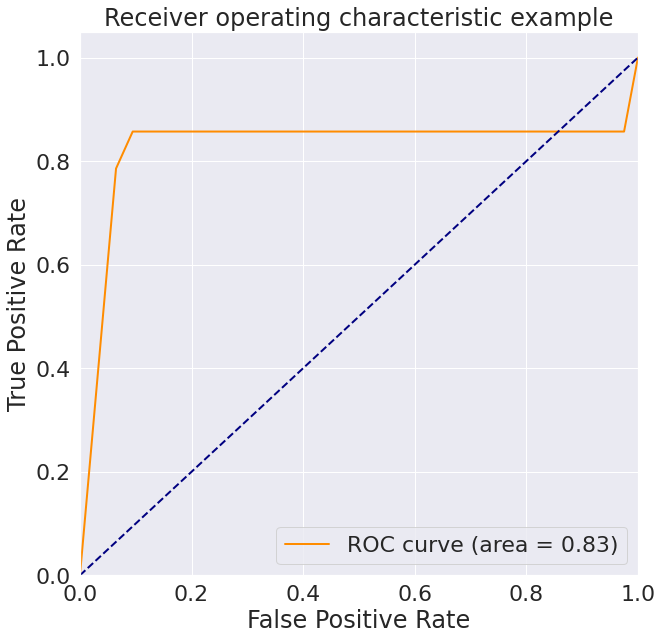

[[0.90547264 0.09452736]
 [0.14285714 0.85714286]]


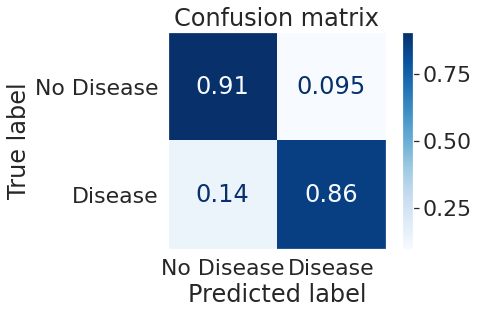

Best parameters set found on development set:

{'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2}

Grid scores on development set:

0.549 (+/-0.148) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2}
0.488 (+/-0.239) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 3}
0.480 (+/-0.325) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 4}
0.525 (+/-0.239) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 5}
0.485 (+/-0.313) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 6}
0.449 (+/-0.321) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth'

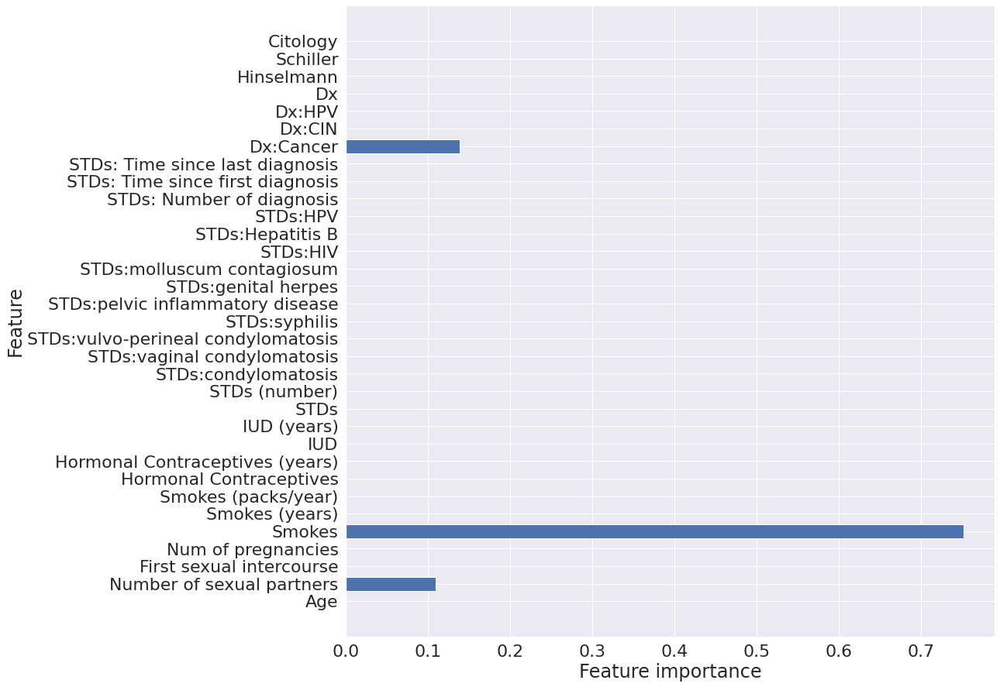

PCA + OVERSAMPLING


/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.2

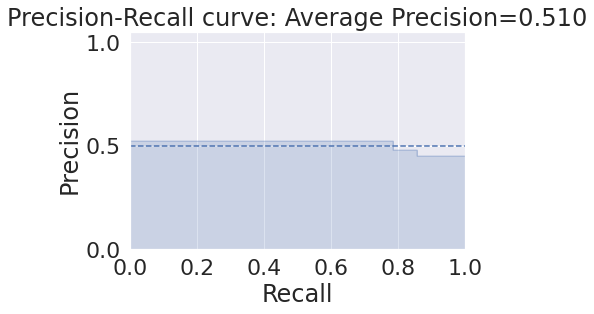

f1=0.615 auc=0.701 recall=0.857


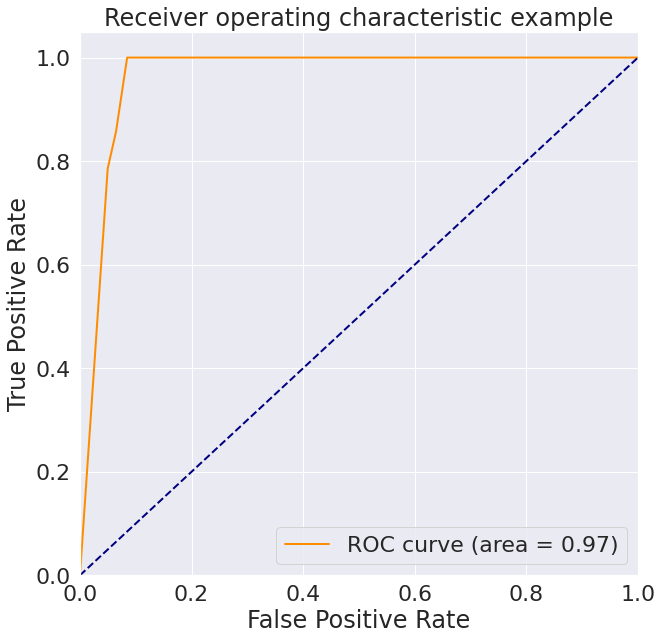

[[0.93532338 0.06467662]
 [0.14285714 0.85714286]]


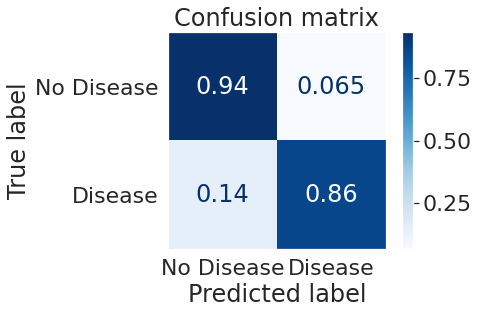

Best parameters set found on development set:

{'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2}

Grid scores on development set:

0.570 (+/-0.217) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2}
0.487 (+/-0.374) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 3}
0.449 (+/-0.431) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 4}
0.464 (+/-0.417) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 5}
0.241 (+/-0.203) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 6}
0.241 (+/-0.170) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth'

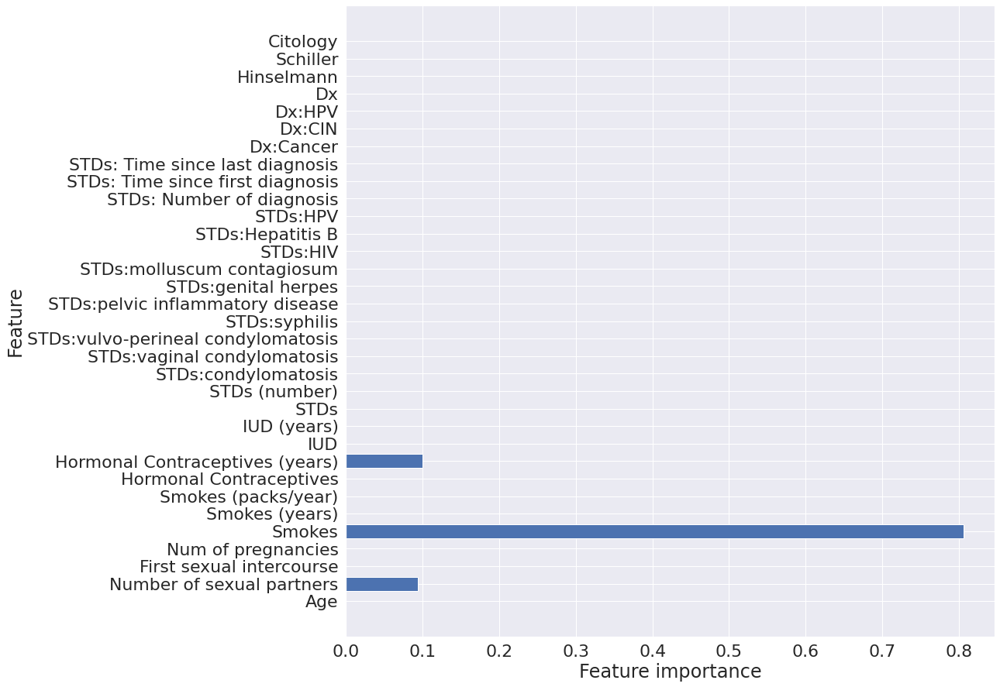

In [ ]:
# create a parameter grid
tree_params = {
    "classification__class_weight": ['balanced'],
    "classification__criterion": ['gini', 'entropy'],
    "classification__max_depth": [2, 3, 4, 5, 6, 7]}

# create a Decision Tree 
tree = DecisionTreeClassifier(random_state=10) 


@ignore_warnings(category=ConvergenceWarning)
def my_function():
    print('DEFAULT IMPLEMENTATION')
    cv_model(tree, tree_params, traintest_values)
    print('STANDARDIZATION')
    cv_model(tree, tree_params, traintest_values, standardization = True)
    print('OVERSAMPLING')
    cv_model(tree, tree_params, traintest_values,upsample=True)
    print('STANDARDIZATION AND OVERSAMPLING')
    cv_model(tree, tree_params, traintest_values, standardization = True, upsample=True)    

    print('PCA')
    cv_model(tree, tree_params, traintest_values, standardization = True, reduction = True)
    print('PCA + OVERSAMPLING')
    cv_model(tree, tree_params,  traintest_values, standardization = True, reduction = True, upsample = True)
    

my_function()

# **Random Forest**# 

DEFAULT IMPLEMENTATION


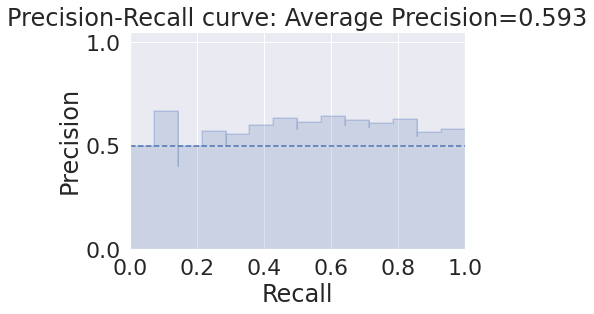

f1=0.718 auc=0.552 recall=1.000


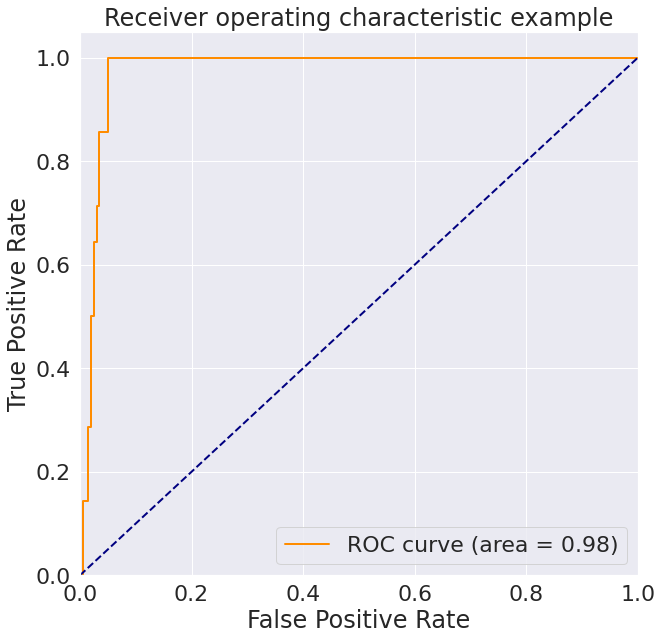

[[0.94527363 0.05472637]
 [0.         1.        ]]


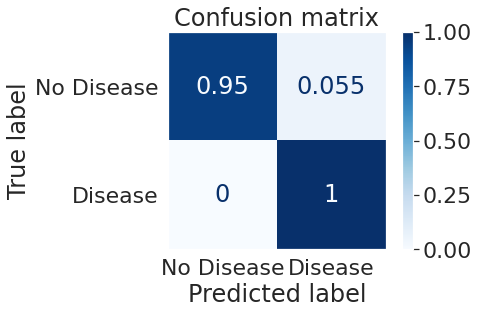

Best parameters set found on development set:

{'classification__class_weight': 'balanced', 'classification__criterion': 'entropy', 'classification__max_depth': 2, 'classification__n_estimators': 200}

Grid scores on development set:

0.727 (+/-0.215) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2, 'classification__n_estimators': 20}
0.752 (+/-0.174) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2, 'classification__n_estimators': 40}
0.737 (+/-0.187) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2, 'classification__n_estimators': 50}
0.759 (+/-0.203) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2, 'classification__n_estimators': 60}
0.755 (+/-0.193) for {'classification__class_weight': 'balanced', 'classification

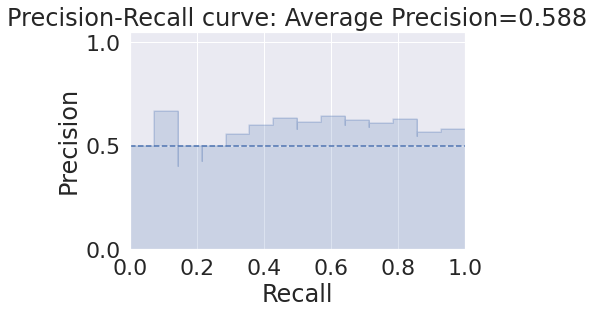

f1=0.718 auc=0.547 recall=1.000


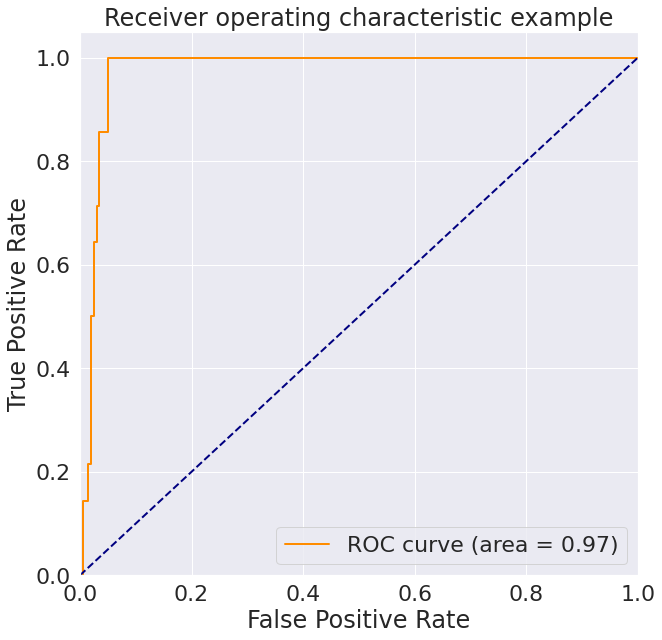

[[0.94527363 0.05472637]
 [0.         1.        ]]


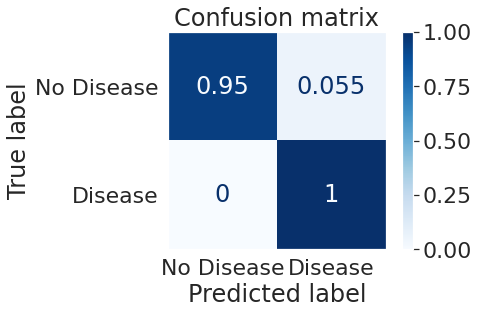

Best parameters set found on development set:

{'classification__class_weight': 'balanced', 'classification__criterion': 'entropy', 'classification__max_depth': 2, 'classification__n_estimators': 200}

Grid scores on development set:

0.727 (+/-0.215) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2, 'classification__n_estimators': 20}
0.752 (+/-0.174) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2, 'classification__n_estimators': 40}
0.742 (+/-0.183) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2, 'classification__n_estimators': 50}
0.759 (+/-0.203) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2, 'classification__n_estimators': 60}
0.755 (+/-0.193) for {'classification__class_weight': 'balanced', 'classification

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.2

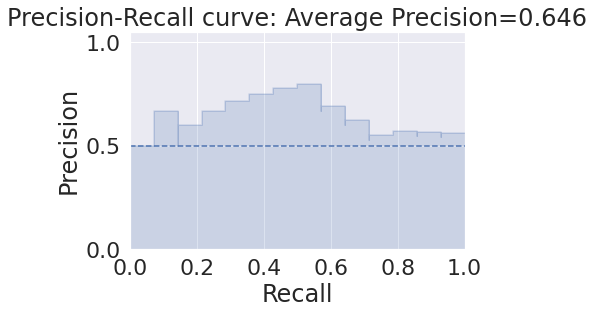

f1=0.684 auc=0.606 recall=0.929


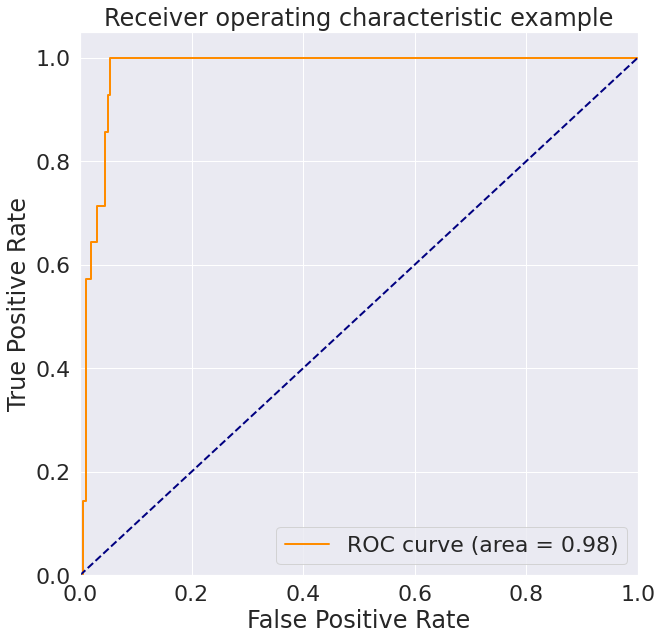

[[0.94527363 0.05472637]
 [0.07142857 0.92857143]]


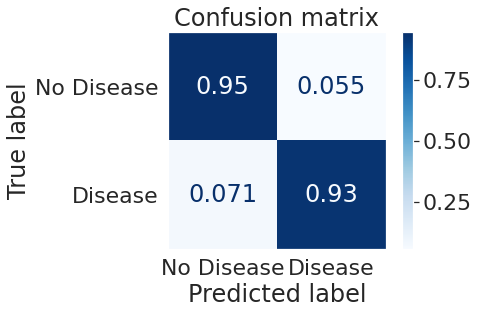

Best parameters set found on development set:

{'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 3, 'classification__n_estimators': 40}

Grid scores on development set:

0.723 (+/-0.230) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2, 'classification__n_estimators': 20}
0.731 (+/-0.209) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2, 'classification__n_estimators': 40}
0.724 (+/-0.213) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2, 'classification__n_estimators': 50}
0.724 (+/-0.216) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2, 'classification__n_estimators': 60}
0.735 (+/-0.203) for {'classification__class_weight': 'balanced', 'classification__cr

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.2

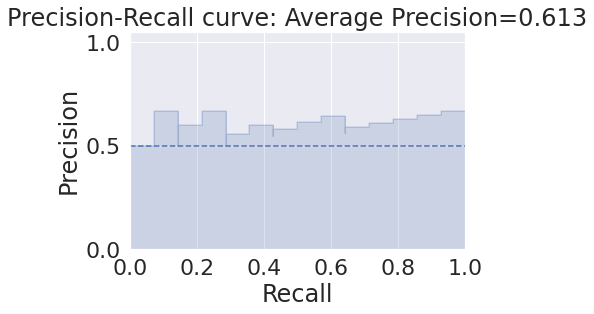

f1=0.718 auc=0.572 recall=1.000


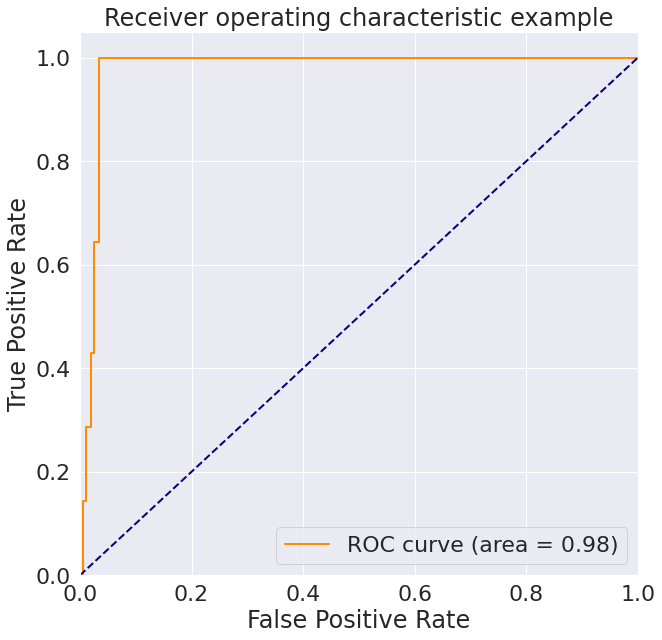

[[0.94527363 0.05472637]
 [0.         1.        ]]


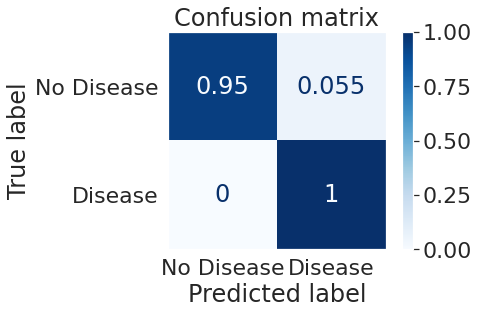

Best parameters set found on development set:

{'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2, 'classification__n_estimators': 40}

Grid scores on development set:

0.688 (+/-0.247) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2, 'classification__n_estimators': 20}
0.716 (+/-0.224) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2, 'classification__n_estimators': 40}
0.705 (+/-0.248) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2, 'classification__n_estimators': 50}
0.675 (+/-0.261) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2, 'classification__n_estimators': 60}
0.689 (+/-0.278) for {'classification__class_weight': 'balanced', 'classification__cr

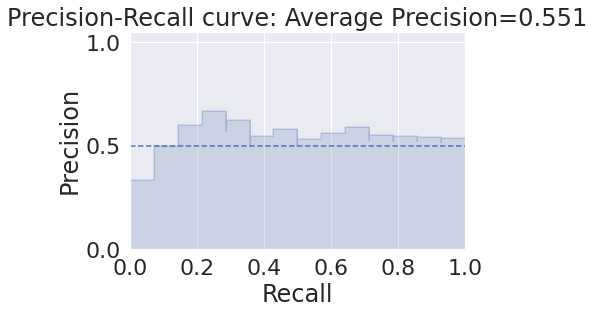

f1=0.683 auc=0.516 recall=1.000


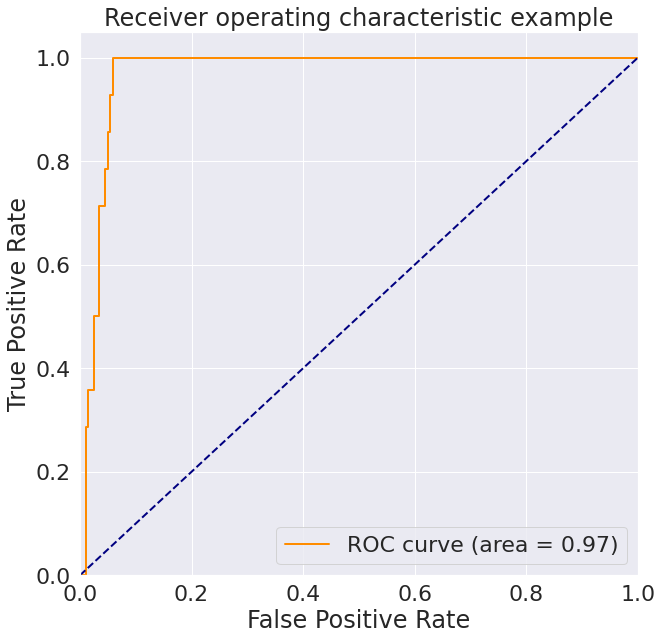

[[0.93532338 0.06467662]
 [0.         1.        ]]


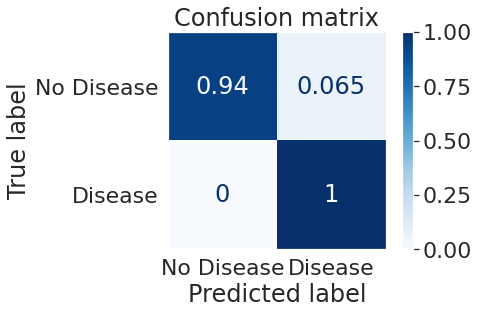

Best parameters set found on development set:

{'classification__class_weight': 'balanced', 'classification__criterion': 'entropy', 'classification__max_depth': 2, 'classification__n_estimators': 60}

Grid scores on development set:

0.653 (+/-0.247) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2, 'classification__n_estimators': 20}
0.659 (+/-0.293) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2, 'classification__n_estimators': 40}
0.658 (+/-0.284) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2, 'classification__n_estimators': 50}
0.672 (+/-0.315) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2, 'classification__n_estimators': 60}
0.684 (+/-0.252) for {'classification__class_weight': 'balanced', 'classification_

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.2

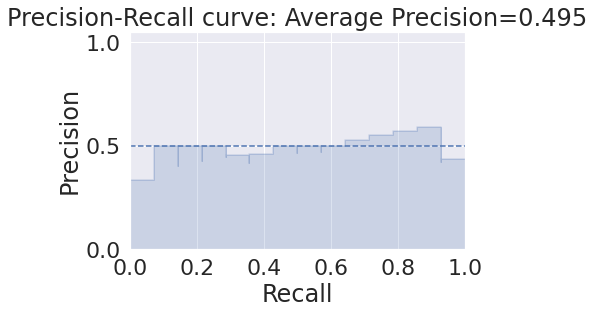

f1=0.650 auc=0.497 recall=0.929


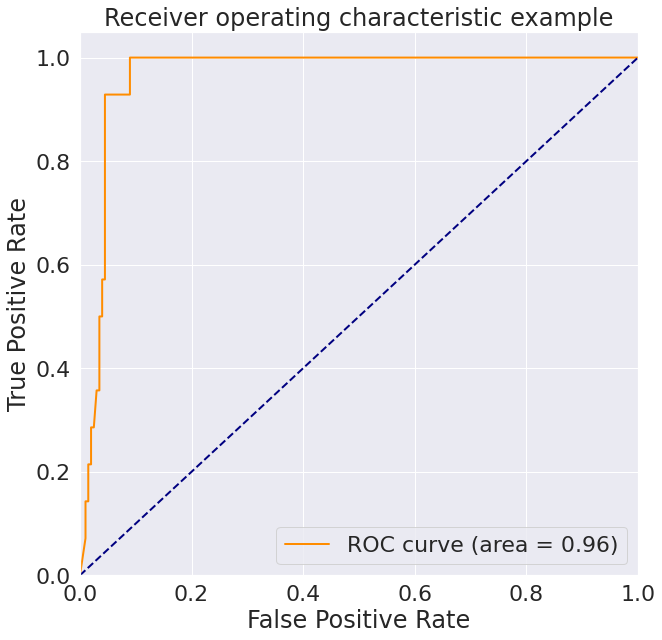

[[0.93532338 0.06467662]
 [0.07142857 0.92857143]]


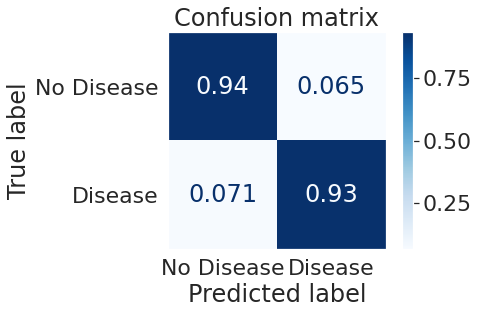

Best parameters set found on development set:

{'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 4, 'classification__n_estimators': 20}

Grid scores on development set:

0.644 (+/-0.348) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2, 'classification__n_estimators': 20}
0.620 (+/-0.308) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2, 'classification__n_estimators': 40}
0.607 (+/-0.335) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2, 'classification__n_estimators': 50}
0.626 (+/-0.319) for {'classification__class_weight': 'balanced', 'classification__criterion': 'gini', 'classification__max_depth': 2, 'classification__n_estimators': 60}
0.610 (+/-0.371) for {'classification__class_weight': 'balanced', 'classification__cr

In [ ]:
rf_params = {
    'classification__class_weight': ['balanced'],
    'classification__criterion': ['gini', 'entropy' ],
    'classification__max_depth': [2, 3, 4, 5, 6, 7, 8],
    'classification__n_estimators': [20, 40, 50, 60, 80, 100, 200]}

rf = RandomForestClassifier(random_state=10, n_jobs=-1)

@ignore_warnings(category=ConvergenceWarning)
def my_function():
    print('DEFAULT IMPLEMENTATION')
    cv_model(rf, rf_params, traintest_values)
    print('STANDARDIZATION')
    cv_model(rf, rf_params, traintest_values, standardization = True)
    print('OVERSAMPLING')
    cv_model(rf, rf_params, traintest_values,upsample=True)
    print('STANDARDIZATION AND OVERSAMPLING')
    cv_model(rf, rf_params, traintest_values, standardization = True, upsample=True)    

    print('PCA')
    cv_model(rf, rf_params, traintest_values, standardization = True, reduction = True)
    print('PCA + OVERSAMPLING')
    cv_model(rf, rf_params,  traintest_values, standardization = True, reduction = True, upsample = True)



my_function()

# **SVM**

DEFAULT IMPLEMENTATION


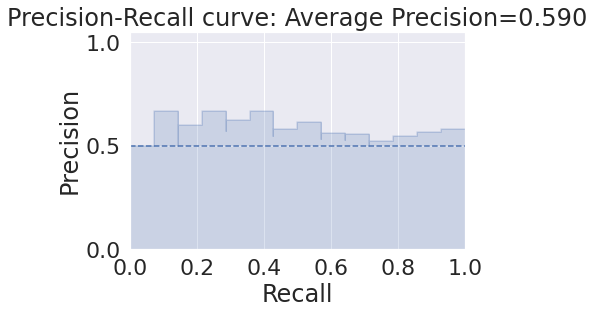

f1=0.703 auc=0.549 recall=0.929


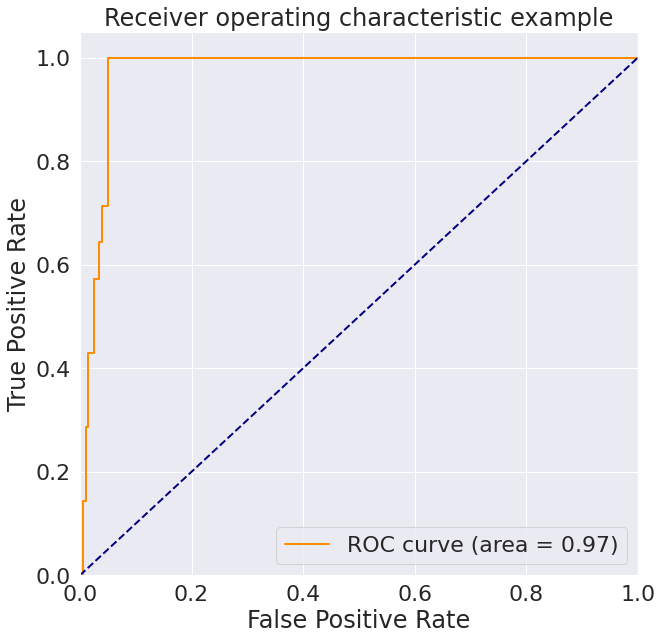

[[0.95024876 0.04975124]
 [0.07142857 0.92857143]]


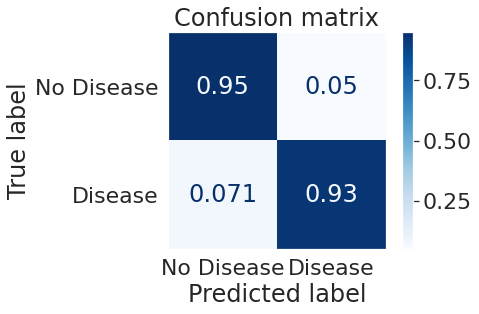

Best parameters set found on development set:

{'classification__C': 1}

Grid scores on development set:

0.611 (+/-0.371) for {'classification__C': 1}
0.606 (+/-0.407) for {'classification__C': 10}
0.556 (+/-0.448) for {'classification__C': 100}
0.539 (+/-0.468) for {'classification__C': 1000}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           0       0.99      0.95      0.97       201
           1       0.57      0.93      0.70        14

    accuracy                           0.95       215
   macro avg       0.78      0.94      0.84       215
weighted avg       0.97      0.95      0.95       215


STANDARDIZATION


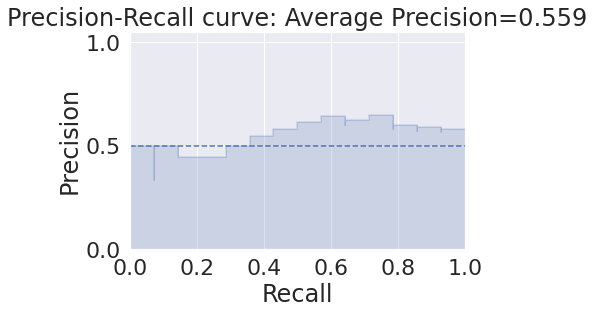

f1=0.722 auc=0.528 recall=0.929


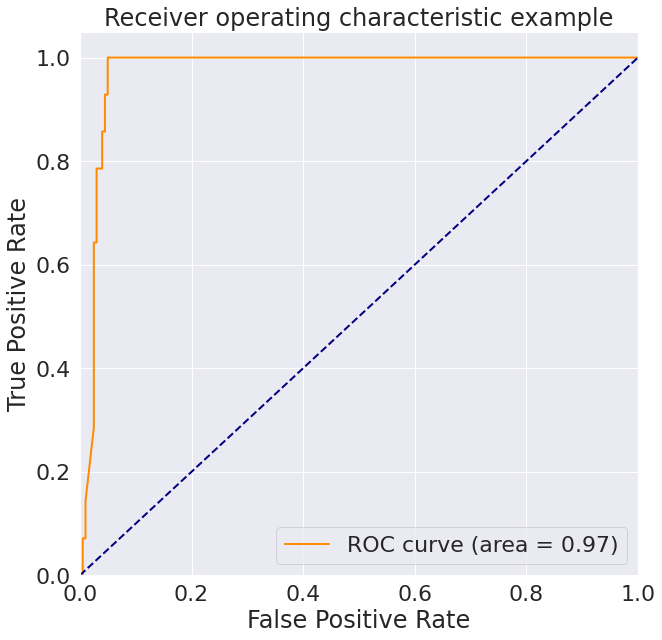

[[0.95522388 0.04477612]
 [0.07142857 0.92857143]]


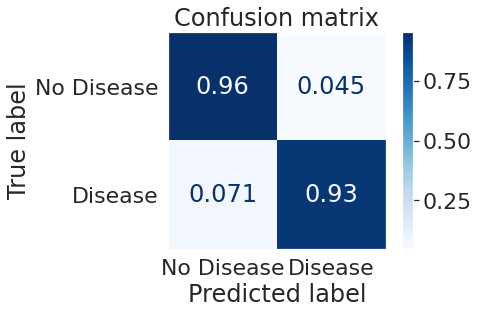

Best parameters set found on development set:

{'classification__C': 1}

Grid scores on development set:

0.590 (+/-0.416) for {'classification__C': 1}
0.554 (+/-0.458) for {'classification__C': 10}
0.550 (+/-0.450) for {'classification__C': 100}
0.550 (+/-0.453) for {'classification__C': 1000}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           0       0.99      0.96      0.97       201
           1       0.59      0.93      0.72        14

    accuracy                           0.95       215
   macro avg       0.79      0.94      0.85       215
weighted avg       0.97      0.95      0.96       215


OVERSAMPLING


/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.2

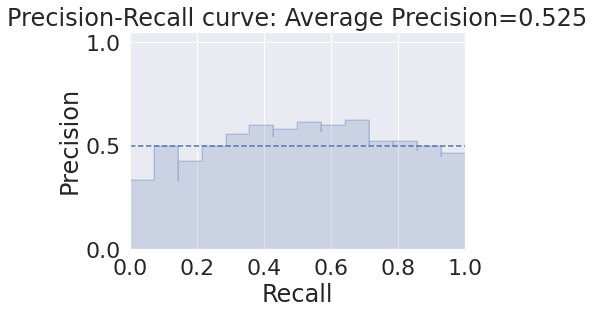

f1=0.605 auc=0.490 recall=0.929


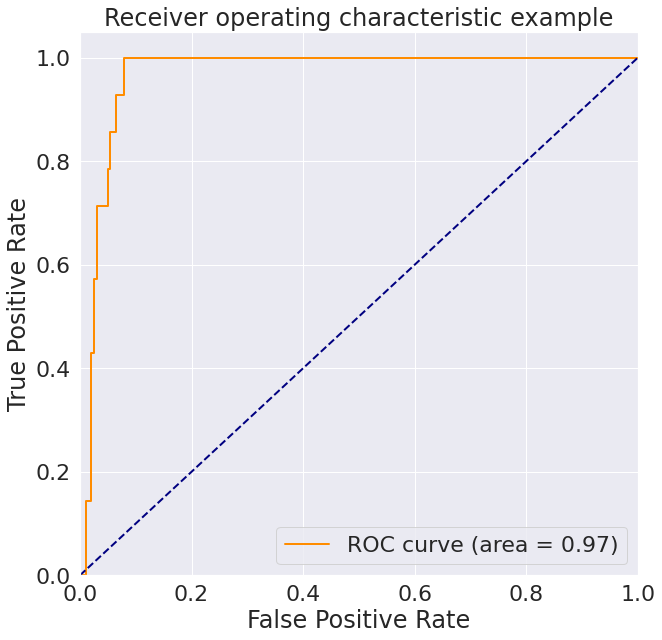

[[0.92039801 0.07960199]
 [0.07142857 0.92857143]]


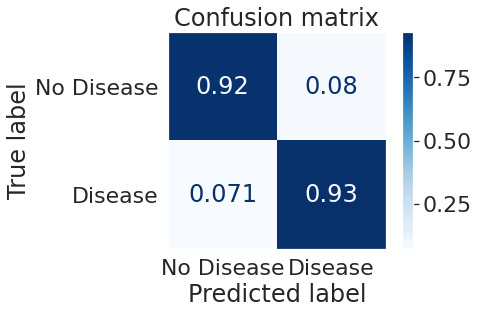

Best parameters set found on development set:

{'classification__C': 1}

Grid scores on development set:

0.593 (+/-0.459) for {'classification__C': 1}
0.580 (+/-0.465) for {'classification__C': 10}
0.568 (+/-0.470) for {'classification__C': 100}
0.568 (+/-0.445) for {'classification__C': 1000}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           0       0.99      0.92      0.96       201
           1       0.45      0.93      0.60        14

    accuracy                           0.92       215
   macro avg       0.72      0.92      0.78       215
weighted avg       0.96      0.92      0.93       215


STANDARDIZATION AND OVERSAMPLING


/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.2

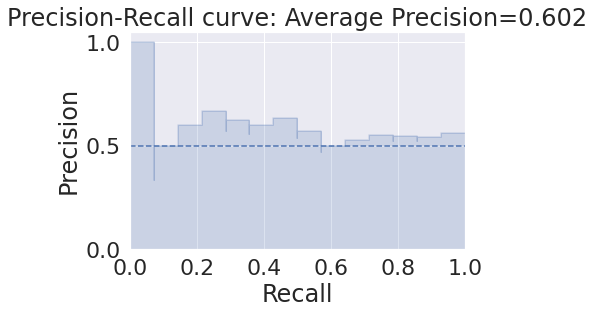

f1=0.684 auc=0.579 recall=0.929


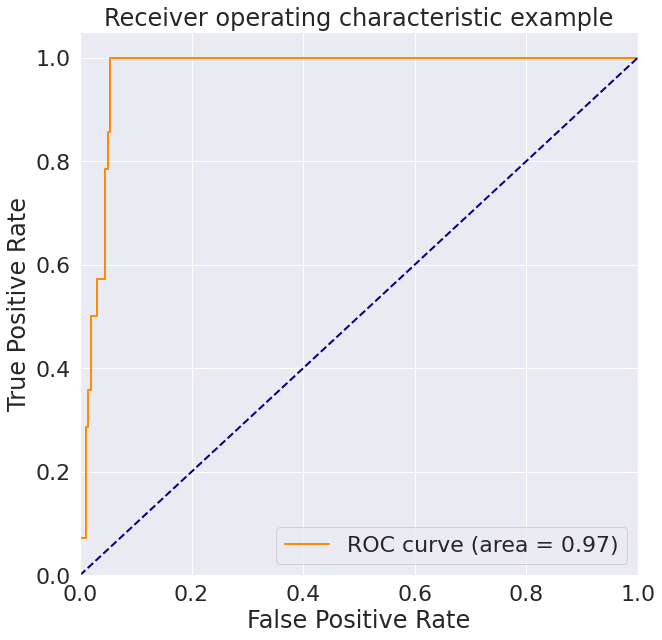

[[0.94527363 0.05472637]
 [0.07142857 0.92857143]]


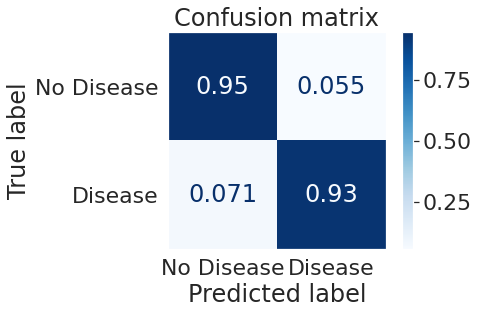

Best parameters set found on development set:

{'classification__C': 1}

Grid scores on development set:

0.489 (+/-0.449) for {'classification__C': 1}
0.461 (+/-0.453) for {'classification__C': 10}
0.460 (+/-0.456) for {'classification__C': 100}
0.460 (+/-0.455) for {'classification__C': 1000}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           0       0.99      0.95      0.97       201
           1       0.54      0.93      0.68        14

    accuracy                           0.94       215
   macro avg       0.77      0.94      0.83       215
weighted avg       0.97      0.94      0.95       215


PCA


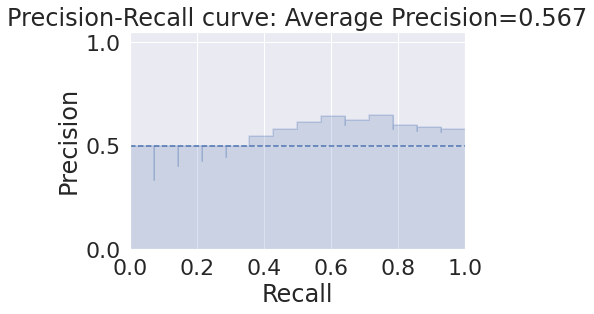

f1=0.722 auc=0.526 recall=0.929


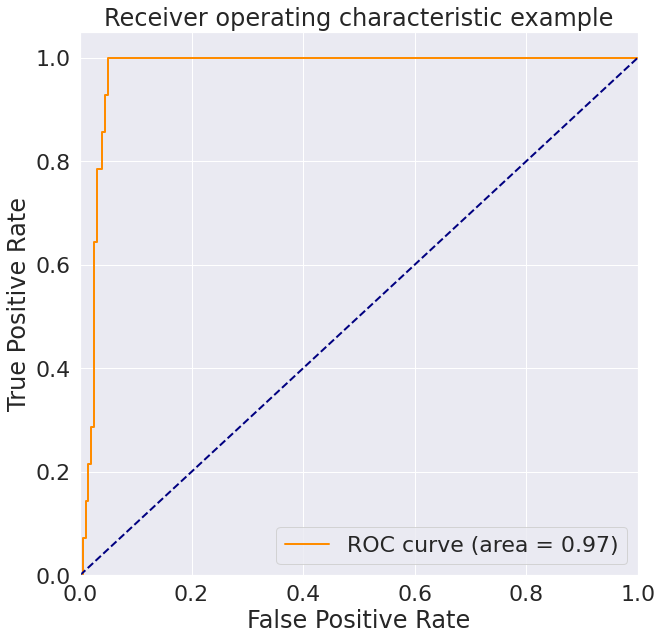

[[0.95522388 0.04477612]
 [0.07142857 0.92857143]]


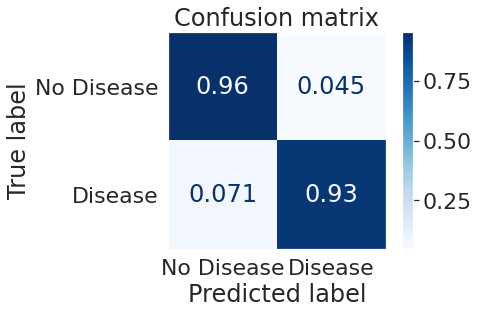

Best parameters set found on development set:

{'classification__C': 1}

Grid scores on development set:

0.590 (+/-0.416) for {'classification__C': 1}
0.554 (+/-0.458) for {'classification__C': 10}
0.550 (+/-0.450) for {'classification__C': 100}
0.549 (+/-0.453) for {'classification__C': 1000}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           0       0.99      0.96      0.97       201
           1       0.59      0.93      0.72        14

    accuracy                           0.95       215
   macro avg       0.79      0.94      0.85       215
weighted avg       0.97      0.95      0.96       215


PCA + OVERSAMPLING


/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.2

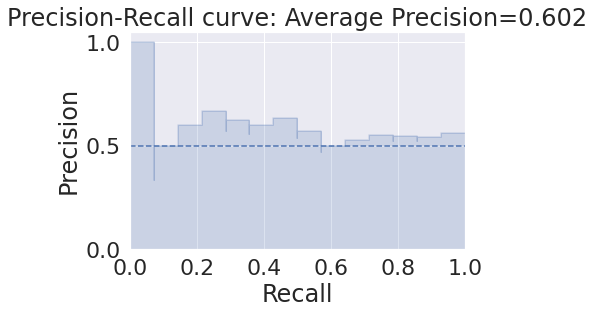

f1=0.684 auc=0.579 recall=0.929


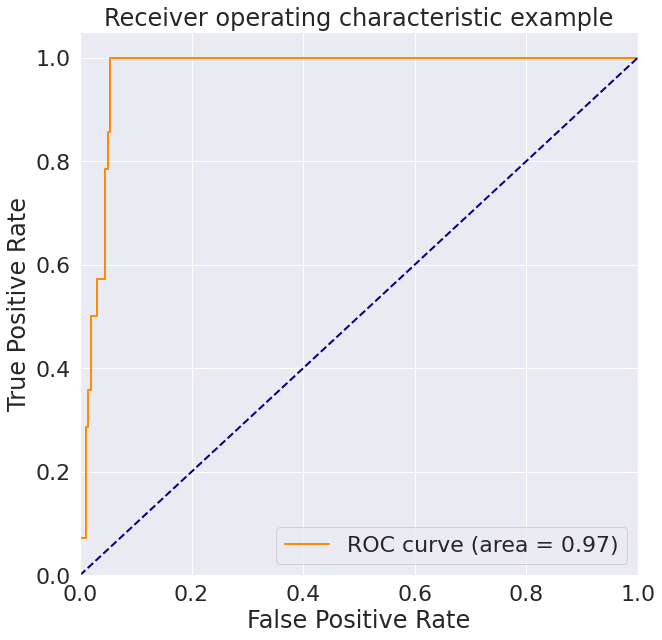

[[0.94527363 0.05472637]
 [0.07142857 0.92857143]]


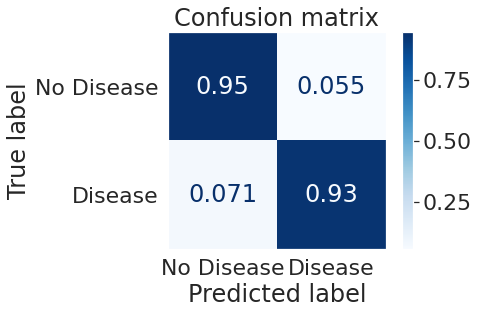

Best parameters set found on development set:

{'classification__C': 1}

Grid scores on development set:

0.489 (+/-0.449) for {'classification__C': 1}
0.461 (+/-0.454) for {'classification__C': 10}
0.460 (+/-0.456) for {'classification__C': 100}
0.460 (+/-0.455) for {'classification__C': 1000}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           0       0.99      0.95      0.97       201
           1       0.54      0.93      0.68        14

    accuracy                           0.94       215
   macro avg       0.77      0.94      0.83       215
weighted avg       0.97      0.94      0.95       215




In [ ]:
# Linear SVM
linearsvm_params = {'classification__C': [1, 10, 100, 1000]}

linearsvm = SVC(kernel='linear',probability=True)

@ignore_warnings(category=ConvergenceWarning)
def my_function():
    print('DEFAULT IMPLEMENTATION')
    cv_model(linearsvm, linearsvm_params, traintest_values)
    print('STANDARDIZATION')
    cv_model(linearsvm, linearsvm_params, traintest_values, standardization = True)
    print('OVERSAMPLING')
    cv_model(linearsvm, linearsvm_params, traintest_values,upsample=True)
    print('STANDARDIZATION AND OVERSAMPLING')
    cv_model(linearsvm, linearsvm_params, traintest_values, standardization = True, upsample=True)    


    print('PCA')
    cv_model(linearsvm, linearsvm_params, traintest_values, standardization = True, reduction = True)
    print('PCA + OVERSAMPLING')
    cv_model(linearsvm, linearsvm_params,  traintest_values, standardization = True, reduction = True, upsample = True)

my_function()

DEFAULT IMPLEMENTATION


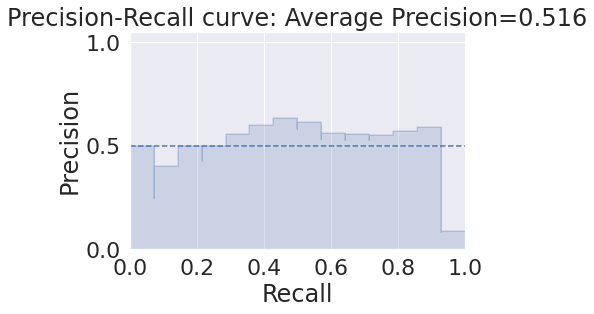

f1=0.000 auc=0.476 recall=0.000


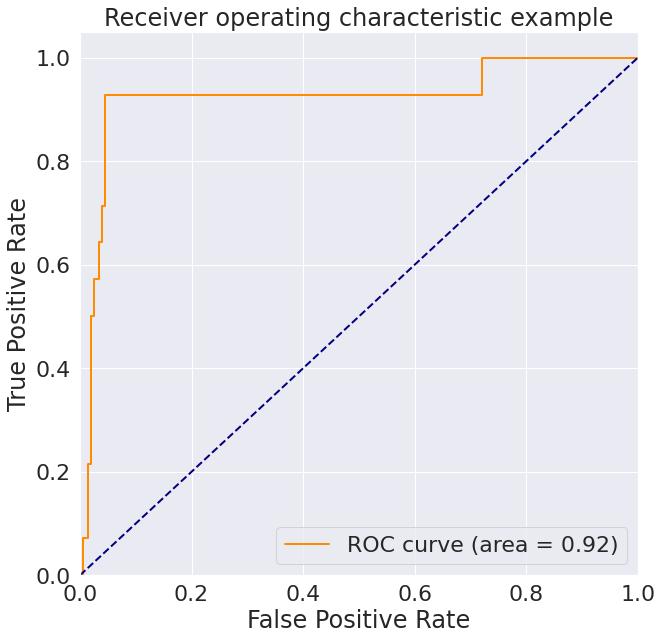

[[1. 0.]
 [1. 0.]]


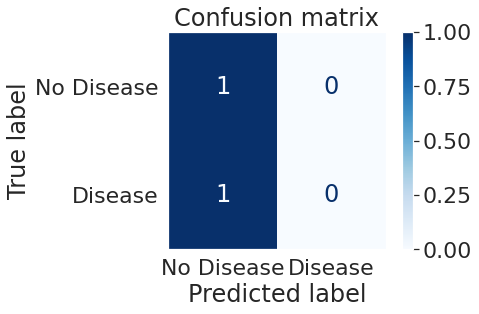

Best parameters set found on development set:

{'classification__C': 1, 'classification__gamma': 0.0001}

Grid scores on development set:

0.488 (+/-0.287) for {'classification__C': 1, 'classification__gamma': 0.001}
0.654 (+/-0.271) for {'classification__C': 1, 'classification__gamma': 0.0001}
0.484 (+/-0.268) for {'classification__C': 10, 'classification__gamma': 0.001}
0.652 (+/-0.281) for {'classification__C': 10, 'classification__gamma': 0.0001}
0.543 (+/-0.268) for {'classification__C': 100, 'classification__gamma': 0.001}
0.650 (+/-0.278) for {'classification__C': 100, 'classification__gamma': 0.0001}
0.498 (+/-0.311) for {'classification__C': 1000, 'classification__gamma': 0.001}
0.649 (+/-0.323) for {'classification__C': 1000, 'classification__gamma': 0.0001}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           0       0.93      

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



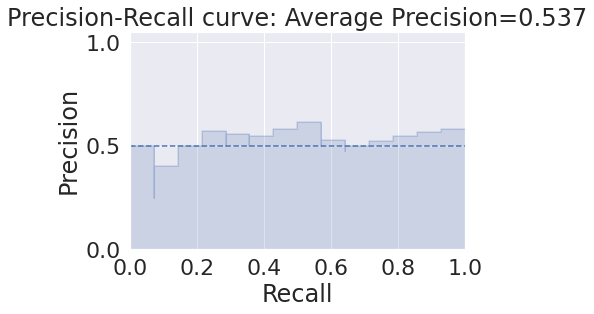

f1=0.364 auc=0.497 recall=0.286


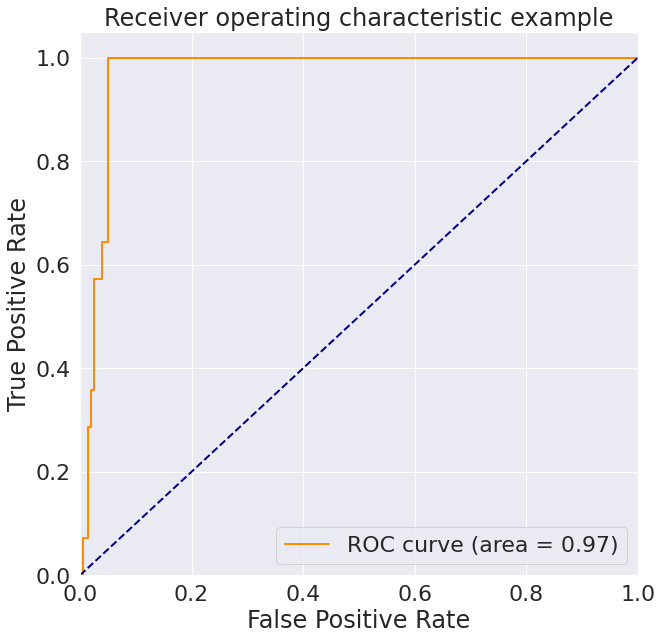

[[0.9800995  0.0199005 ]
 [0.71428571 0.28571429]]


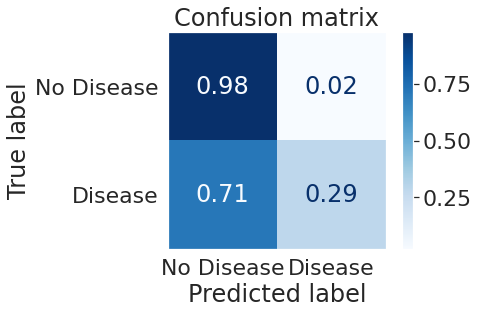

Best parameters set found on development set:

{'classification__C': 10, 'classification__gamma': 0.0001}

Grid scores on development set:

0.680 (+/-0.261) for {'classification__C': 1, 'classification__gamma': 0.001}
0.682 (+/-0.281) for {'classification__C': 1, 'classification__gamma': 0.0001}
0.691 (+/-0.280) for {'classification__C': 10, 'classification__gamma': 0.001}
0.703 (+/-0.273) for {'classification__C': 10, 'classification__gamma': 0.0001}
0.633 (+/-0.395) for {'classification__C': 100, 'classification__gamma': 0.001}
0.700 (+/-0.288) for {'classification__C': 100, 'classification__gamma': 0.0001}
0.569 (+/-0.428) for {'classification__C': 1000, 'classification__gamma': 0.001}
0.653 (+/-0.377) for {'classification__C': 1000, 'classification__gamma': 0.0001}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           0       0.95     

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.2

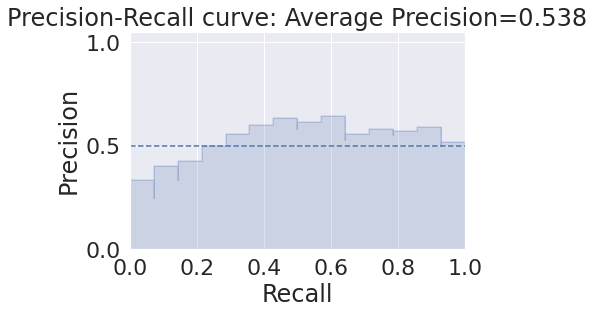

f1=0.703 auc=0.504 recall=0.929


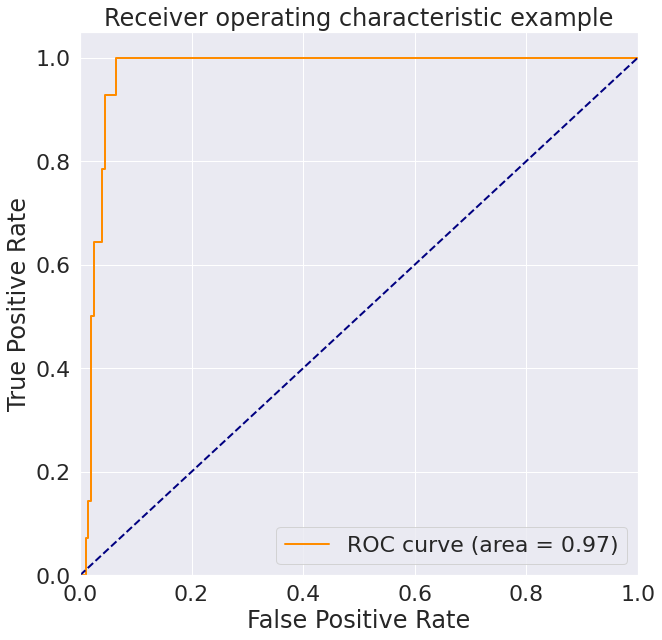

[[0.95024876 0.04975124]
 [0.07142857 0.92857143]]


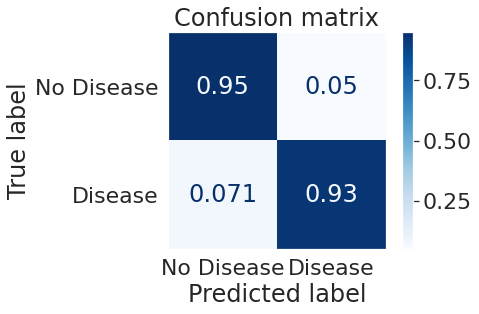

Best parameters set found on development set:

{'classification__C': 100, 'classification__gamma': 0.0001}

Grid scores on development set:

0.248 (+/-0.215) for {'classification__C': 1, 'classification__gamma': 0.001}
0.056 (+/-0.024) for {'classification__C': 1, 'classification__gamma': 0.0001}
0.626 (+/-0.301) for {'classification__C': 10, 'classification__gamma': 0.001}
0.400 (+/-0.357) for {'classification__C': 10, 'classification__gamma': 0.0001}
0.489 (+/-0.375) for {'classification__C': 100, 'classification__gamma': 0.001}
0.666 (+/-0.252) for {'classification__C': 100, 'classification__gamma': 0.0001}
0.386 (+/-0.408) for {'classification__C': 1000, 'classification__gamma': 0.001}
0.582 (+/-0.409) for {'classification__C': 1000, 'classification__gamma': 0.0001}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           0       0.99    

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.2

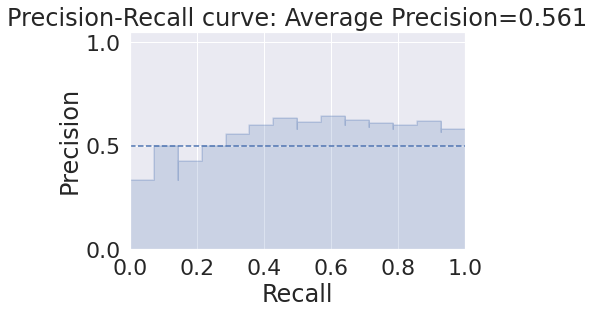

f1=0.667 auc=0.526 recall=0.714


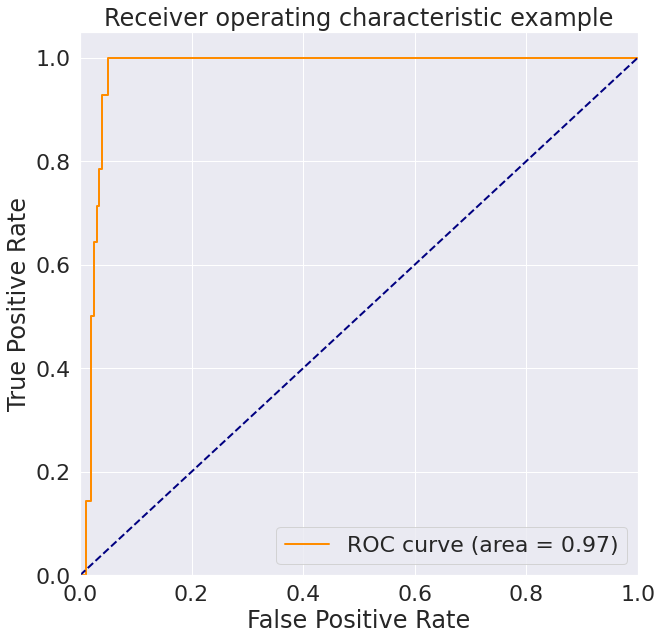

[[0.97014925 0.02985075]
 [0.28571429 0.71428571]]


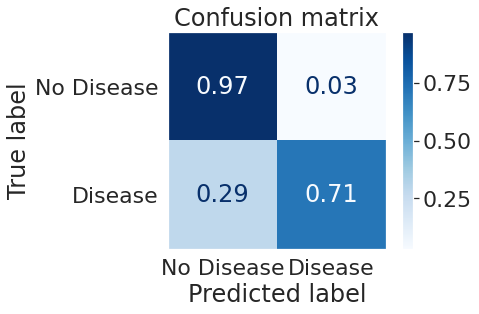

Best parameters set found on development set:

{'classification__C': 1, 'classification__gamma': 0.0001}

Grid scores on development set:

0.626 (+/-0.367) for {'classification__C': 1, 'classification__gamma': 0.001}
0.715 (+/-0.249) for {'classification__C': 1, 'classification__gamma': 0.0001}
0.576 (+/-0.454) for {'classification__C': 10, 'classification__gamma': 0.001}
0.638 (+/-0.376) for {'classification__C': 10, 'classification__gamma': 0.0001}
0.521 (+/-0.465) for {'classification__C': 100, 'classification__gamma': 0.001}
0.562 (+/-0.452) for {'classification__C': 100, 'classification__gamma': 0.0001}
0.519 (+/-0.483) for {'classification__C': 1000, 'classification__gamma': 0.001}
0.537 (+/-0.432) for {'classification__C': 1000, 'classification__gamma': 0.0001}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           0       0.98      

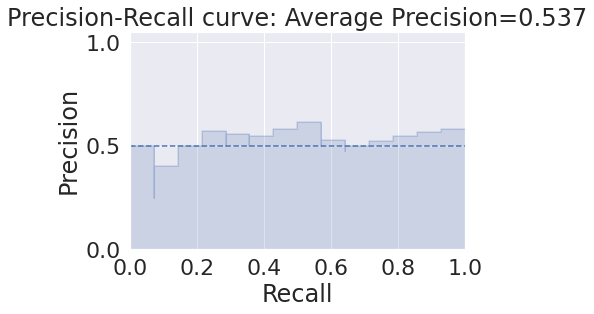

f1=0.364 auc=0.497 recall=0.286


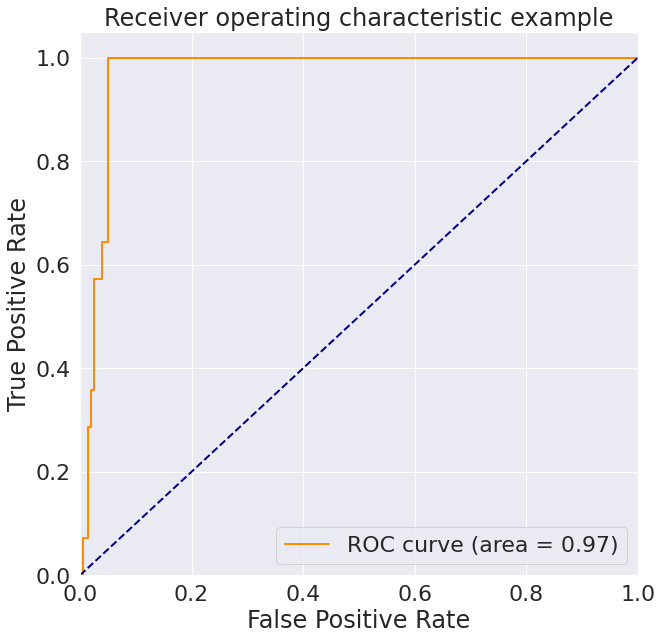

[[0.9800995  0.0199005 ]
 [0.71428571 0.28571429]]


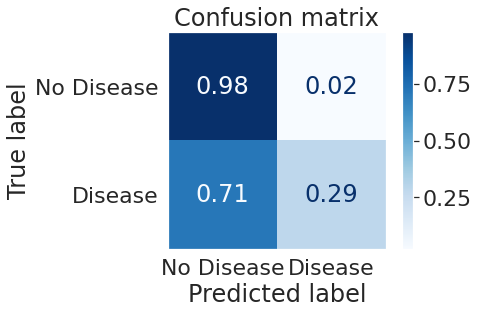

Best parameters set found on development set:

{'classification__C': 10, 'classification__gamma': 0.0001}

Grid scores on development set:

0.680 (+/-0.261) for {'classification__C': 1, 'classification__gamma': 0.001}
0.682 (+/-0.281) for {'classification__C': 1, 'classification__gamma': 0.0001}
0.691 (+/-0.280) for {'classification__C': 10, 'classification__gamma': 0.001}
0.703 (+/-0.273) for {'classification__C': 10, 'classification__gamma': 0.0001}
0.633 (+/-0.395) for {'classification__C': 100, 'classification__gamma': 0.001}
0.700 (+/-0.288) for {'classification__C': 100, 'classification__gamma': 0.0001}
0.569 (+/-0.428) for {'classification__C': 1000, 'classification__gamma': 0.001}
0.653 (+/-0.377) for {'classification__C': 1000, 'classification__gamma': 0.0001}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           0       0.95     

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.2

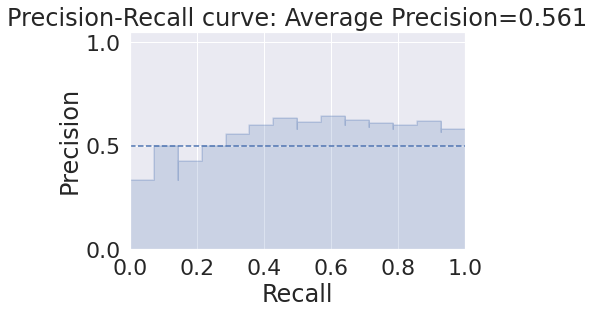

f1=0.667 auc=0.526 recall=0.714


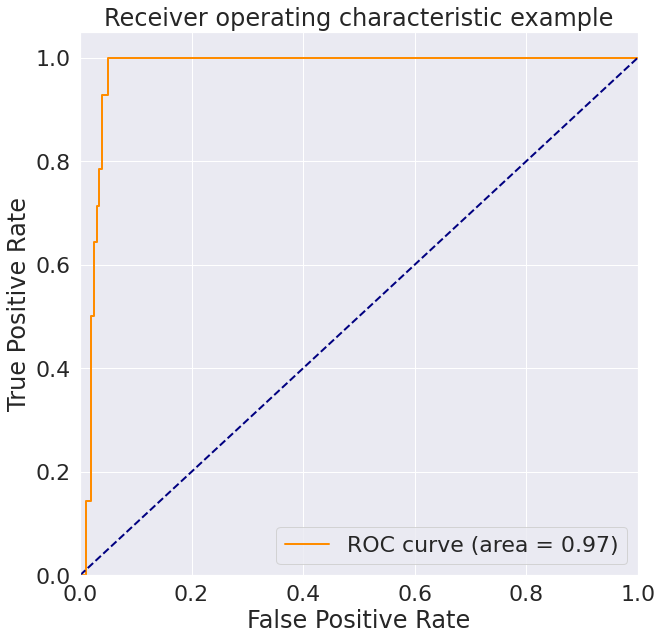

[[0.97014925 0.02985075]
 [0.28571429 0.71428571]]


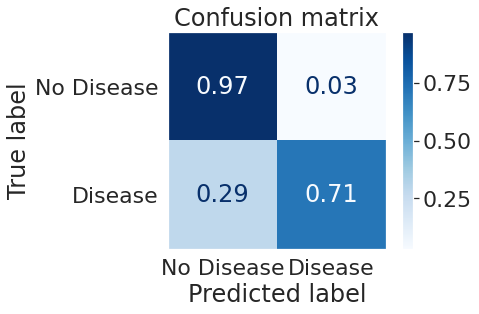

Best parameters set found on development set:

{'classification__C': 1, 'classification__gamma': 0.0001}

Grid scores on development set:

0.626 (+/-0.367) for {'classification__C': 1, 'classification__gamma': 0.001}
0.715 (+/-0.249) for {'classification__C': 1, 'classification__gamma': 0.0001}
0.576 (+/-0.453) for {'classification__C': 10, 'classification__gamma': 0.001}
0.638 (+/-0.376) for {'classification__C': 10, 'classification__gamma': 0.0001}
0.521 (+/-0.465) for {'classification__C': 100, 'classification__gamma': 0.001}
0.562 (+/-0.452) for {'classification__C': 100, 'classification__gamma': 0.0001}
0.519 (+/-0.483) for {'classification__C': 1000, 'classification__gamma': 0.001}
0.537 (+/-0.432) for {'classification__C': 1000, 'classification__gamma': 0.0001}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           0       0.98      

In [ ]:
# RBF SVM
rbfsvm_params = {'classification__gamma': [1e-3, 1e-4],
                 'classification__C': [1, 10, 100, 1000]}

rbfsvm = SVC(kernel='rbf',probability=True)

@ignore_warnings(category=ConvergenceWarning)
def my_function():
    print('DEFAULT IMPLEMENTATION')
    cv_model(rbfsvm, rbfsvm_params, traintest_values)
    print('STANDARDIZATION')
    cv_model(rbfsvm, rbfsvm_params, traintest_values, standardization = True)
    print('OVERSAMPLING')
    cv_model(rbfsvm, rbfsvm_params, traintest_values,upsample=True)
    print('STANDARDIZATION AND OVERSAMPLING')
    cv_model(rbfsvm, rbfsvm_params, traintest_values, standardization = True, upsample=True)    

    print('PCA')
    cv_model(rbfsvm, rbfsvm_params, traintest_values, standardization = True, reduction = True)
    print('PCA + OVERSAMPLING')
    cv_model(rbfsvm, rbfsvm_params,  traintest_values, standardization = True, reduction = True, upsample = True)


my_function()

# **Gradient Boosting Classifier**




DEFAULT IMPLEMENTATION


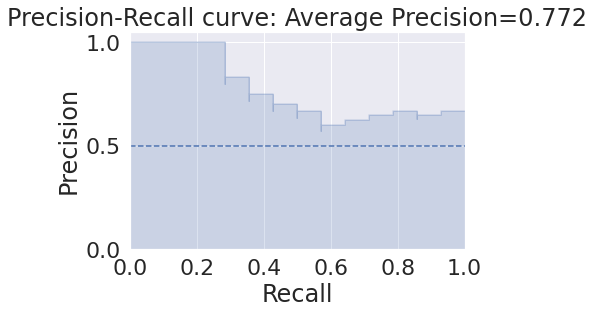

f1=0.727 auc=0.762 recall=0.857


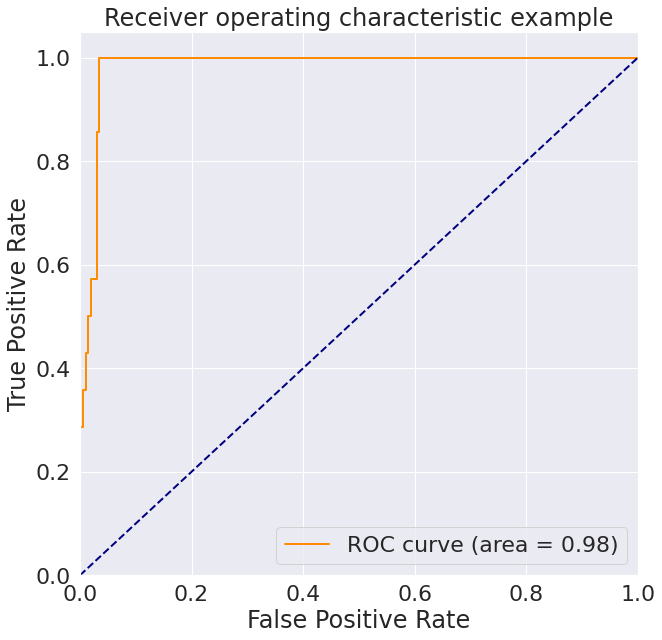

[[0.96517413 0.03482587]
 [0.14285714 0.85714286]]


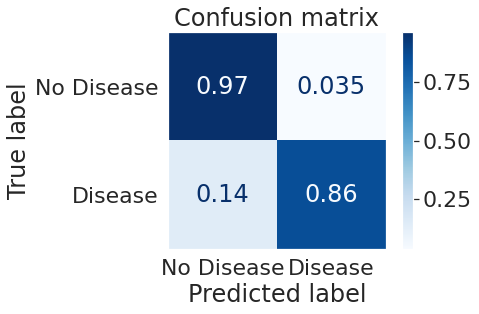

Best parameters set found on development set:

{'classification__criterion': 'mse', 'classification__learning_rate': 0.1, 'classification__loss': 'deviance', 'classification__n_estimators': 75}

Grid scores on development set:

0.645 (+/-0.225) for {'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.001, 'classification__loss': 'deviance', 'classification__n_estimators': 50}
0.644 (+/-0.227) for {'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.001, 'classification__loss': 'deviance', 'classification__n_estimators': 75}
0.644 (+/-0.227) for {'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.001, 'classification__loss': 'deviance', 'classification__n_estimators': 100}
0.643 (+/-0.228) for {'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.001, 'classification__loss': 'deviance', 'classification__n_estimators': 150}
0.659 (+/-0.221) for {'classification__criterion': 'fr

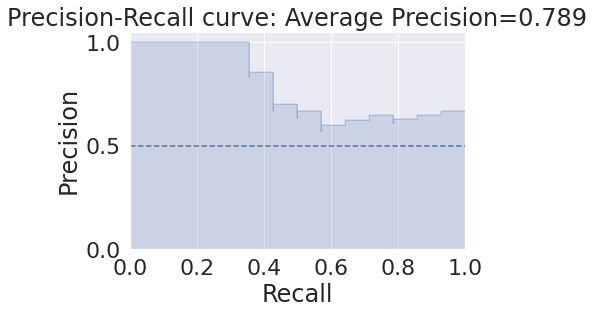

f1=0.765 auc=0.781 recall=0.929


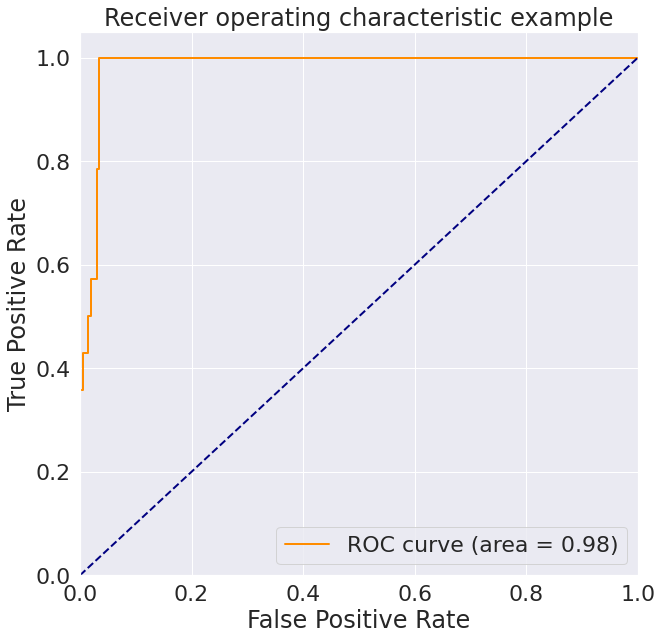

[[0.96517413 0.03482587]
 [0.07142857 0.92857143]]


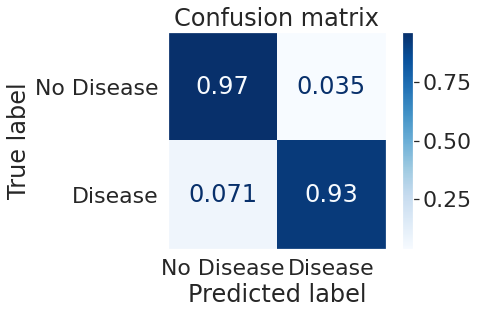

Best parameters set found on development set:

{'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.1, 'classification__loss': 'deviance', 'classification__n_estimators': 100}

Grid scores on development set:

0.645 (+/-0.225) for {'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.001, 'classification__loss': 'deviance', 'classification__n_estimators': 50}
0.644 (+/-0.227) for {'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.001, 'classification__loss': 'deviance', 'classification__n_estimators': 75}
0.644 (+/-0.227) for {'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.001, 'classification__loss': 'deviance', 'classification__n_estimators': 100}
0.643 (+/-0.228) for {'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.001, 'classification__loss': 'deviance', 'classification__n_estimators': 150}
0.659 (+/-0.221) for {'classification__crite

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.2

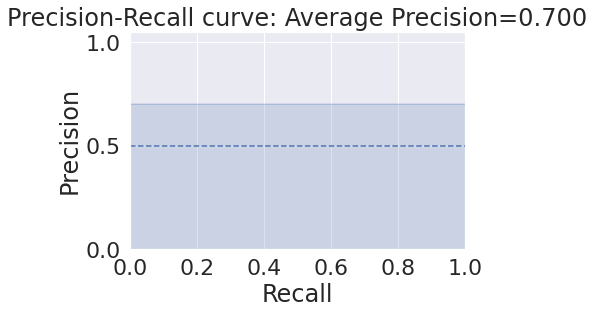

f1=0.757 auc=0.850 recall=1.000


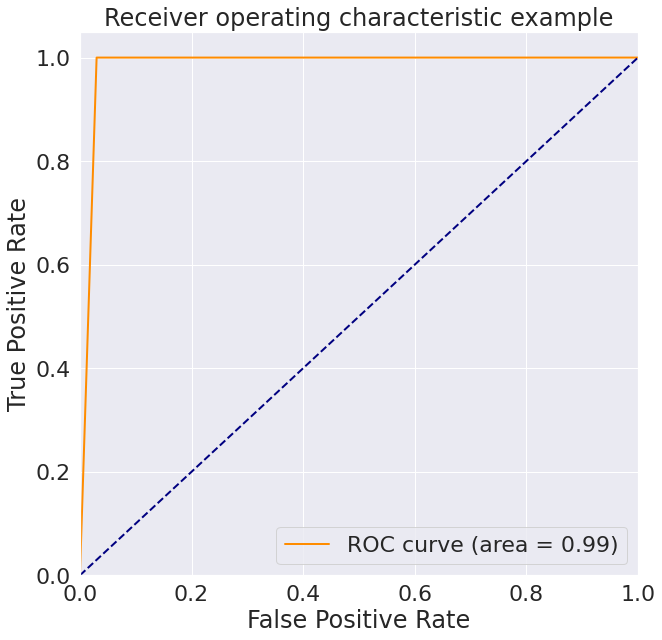

[[0.95522388 0.04477612]
 [0.         1.        ]]


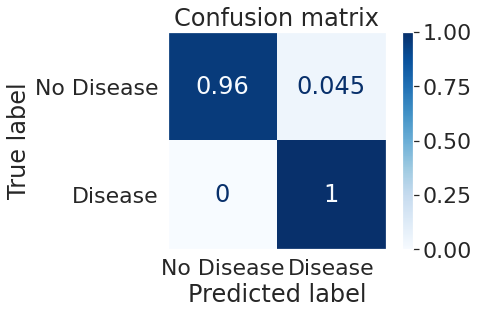

Best parameters set found on development set:

{'classification__criterion': 'mae', 'classification__learning_rate': 0.01, 'classification__loss': 'exponential', 'classification__n_estimators': 100}

Grid scores on development set:

0.682 (+/-0.243) for {'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.001, 'classification__loss': 'deviance', 'classification__n_estimators': 50}
0.682 (+/-0.243) for {'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.001, 'classification__loss': 'deviance', 'classification__n_estimators': 75}
0.682 (+/-0.243) for {'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.001, 'classification__loss': 'deviance', 'classification__n_estimators': 100}
0.686 (+/-0.241) for {'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.001, 'classification__loss': 'deviance', 'classification__n_estimators': 150}
0.686 (+/-0.241) for {'classification__criterion'

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.2

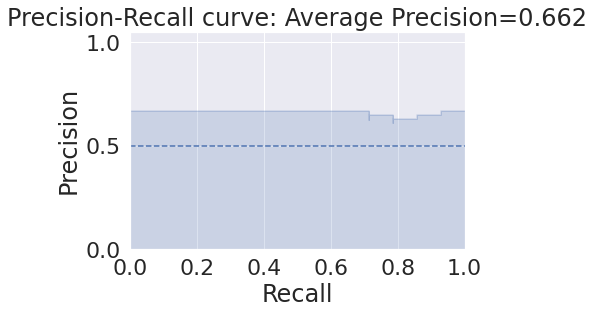

f1=0.718 auc=0.778 recall=1.000


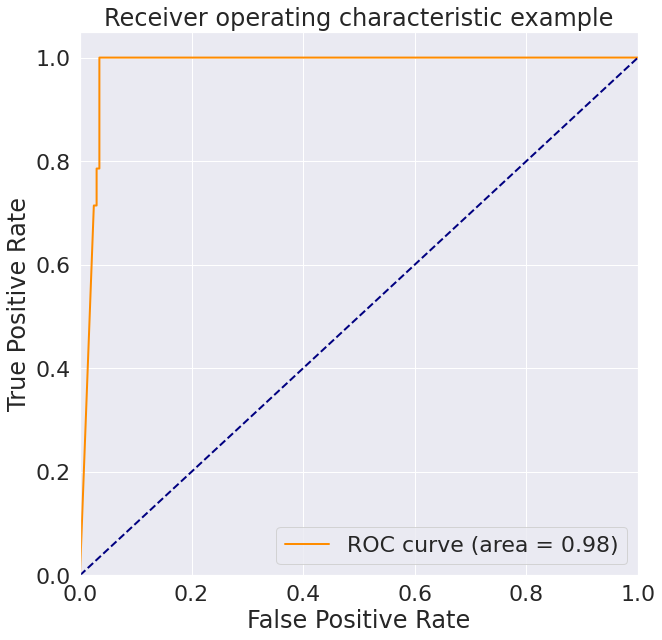

[[0.94527363 0.05472637]
 [0.         1.        ]]


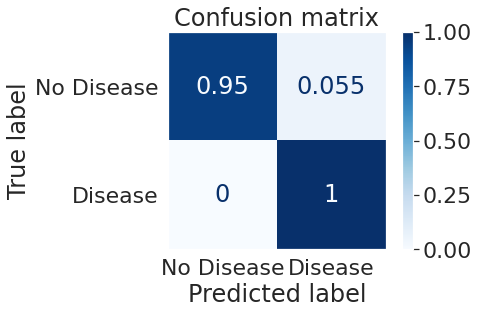

Best parameters set found on development set:

{'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.01, 'classification__loss': 'exponential', 'classification__n_estimators': 200}

Grid scores on development set:

0.586 (+/-0.294) for {'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.001, 'classification__loss': 'deviance', 'classification__n_estimators': 50}
0.586 (+/-0.294) for {'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.001, 'classification__loss': 'deviance', 'classification__n_estimators': 75}
0.586 (+/-0.294) for {'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.001, 'classification__loss': 'deviance', 'classification__n_estimators': 100}
0.586 (+/-0.294) for {'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.001, 'classification__loss': 'deviance', 'classification__n_estimators': 150}
0.578 (+/-0.294) for {'classification__c

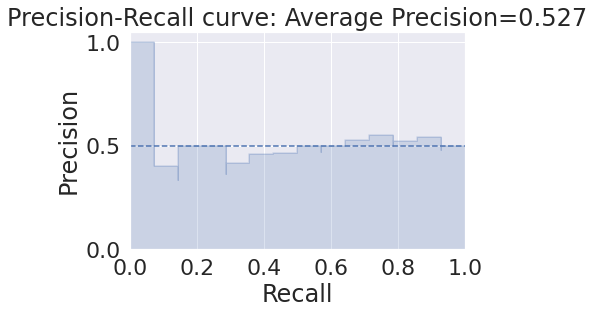

f1=0.333 auc=0.509 recall=0.286


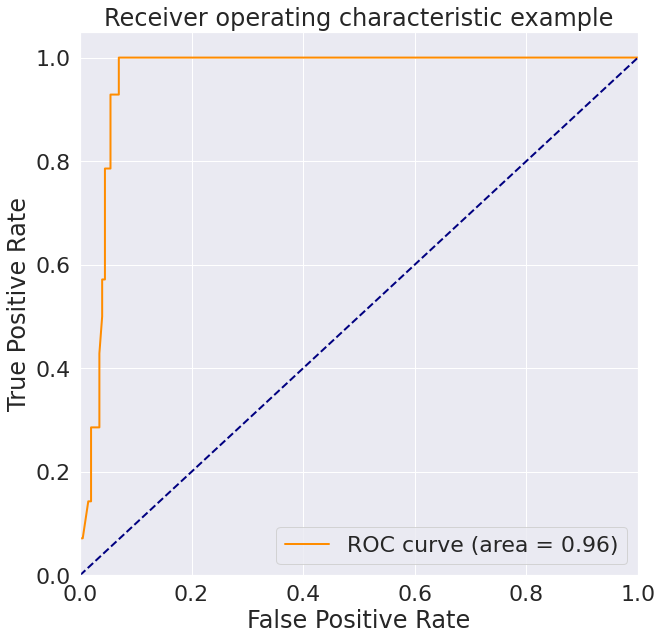

[[0.97014925 0.02985075]
 [0.71428571 0.28571429]]


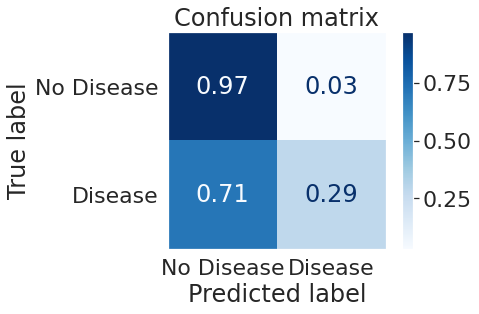

Best parameters set found on development set:

{'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.01, 'classification__loss': 'deviance', 'classification__n_estimators': 150}

Grid scores on development set:

0.569 (+/-0.202) for {'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.001, 'classification__loss': 'deviance', 'classification__n_estimators': 50}
0.569 (+/-0.202) for {'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.001, 'classification__loss': 'deviance', 'classification__n_estimators': 75}
0.611 (+/-0.308) for {'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.001, 'classification__loss': 'deviance', 'classification__n_estimators': 100}
0.612 (+/-0.292) for {'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.001, 'classification__loss': 'deviance', 'classification__n_estimators': 150}
0.602 (+/-0.297) for {'classification__crit

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.2

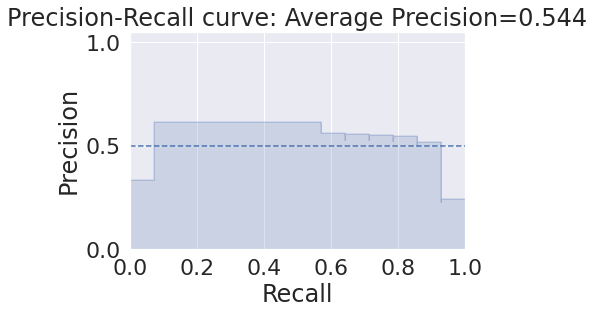

f1=0.649 auc=0.494 recall=0.857


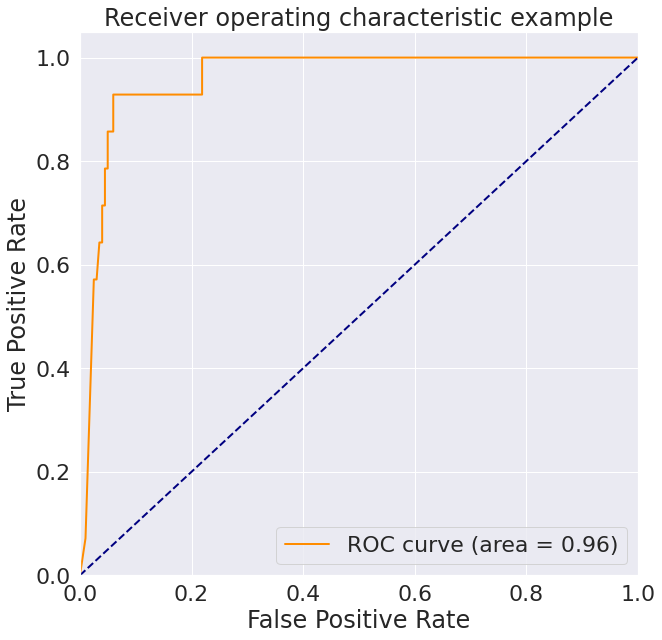

[[0.94527363 0.05472637]
 [0.14285714 0.85714286]]


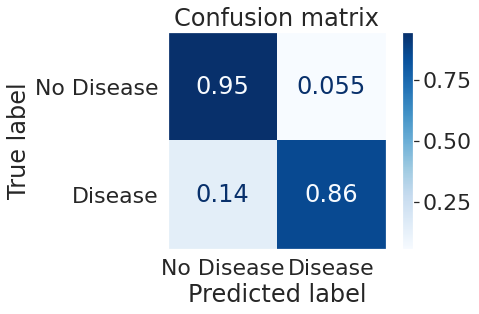

Best parameters set found on development set:

{'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.01, 'classification__loss': 'deviance', 'classification__n_estimators': 200}

Grid scores on development set:

0.497 (+/-0.357) for {'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.001, 'classification__loss': 'deviance', 'classification__n_estimators': 50}
0.561 (+/-0.303) for {'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.001, 'classification__loss': 'deviance', 'classification__n_estimators': 75}
0.567 (+/-0.306) for {'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.001, 'classification__loss': 'deviance', 'classification__n_estimators': 100}
0.568 (+/-0.298) for {'classification__criterion': 'friedman_mse', 'classification__learning_rate': 0.001, 'classification__loss': 'deviance', 'classification__n_estimators': 150}
0.572 (+/-0.293) for {'classification__crit

In [ ]:
gb_params = {
    'classification__loss': ['deviance'],
    'classification__learning_rate': [0.001,0.01,0.1,],
    'classification__n_estimators': [50,75,100,150,200],
    'classification__criterion': ['friedman_mse', 'mse', 'mae']}

gb = GradientBoostingClassifier(random_state=10)

@ignore_warnings(category=ConvergenceWarning)
def my_function():
    print('DEFAULT IMPLEMENTATION')
    cv_model(gb, gb_params, traintest_values)
    print('STANDARDIZATION')
    cv_model(gb, gb_params, traintest_values, standardization = True)
    print('OVERSAMPLING')
    cv_model(gb, gb_params, traintest_values,upsample=True)
    print('STANDARDIZATION AND OVERSAMPLING')
    cv_model(gb, gb_params, traintest_values, standardization = True, upsample=True)    


    print('PCA')
    cv_model(gb, gb_params, traintest_values, standardization = True, reduction = True)
    print('PCA + OVERSAMPLING')
    cv_model(gb, gb_params,  traintest_values, standardization = True, reduction = True, upsample = True)

my_function()